### Установка

In [8]:
!git clone https://github.com/uivvyd/Diffusion-samplers-for-TSF.git

Cloning into 'Diffusion-samplers-for-TSF'...
remote: Enumerating objects: 949, done.
remote: Counting objects: 100% (464/464), done.
remote: Compressing objects: 100% (210/210), done.
remote: Total 949 (delta 346), reused 253 (delta 253), pack-reused 485 (from 2)
Receiving objects: 100% (949/949), 9.15 MiB | 609.00 KiB/s, done.
Resolving deltas: 100% (556/556), done.


In [1]:
%cd Diffusion-samplers-for-TSF

/workdir/Diffusion-samplers-for-TSF


/home/mlcore/.local/lib/python3.10/site-packages/IPython/core/magics/osm.py:417: UserWarning: This is now an optional IPython functionality, setting dhist requires you to install the `pickleshare` library.
  self.shell.db['dhist'] = compress_dhist(dhist)[-100:]


In [10]:
!ls

checkpoints	    datasets  LICENSE	pyproject.toml	run.sh	     submodules
CODE_OF_CONDUCT.md  docs      notebook	README.md	scripts
config		    exps      probts	run.py		SECURITY.md


In [4]:
!sudo apt-get install zip unzip -y

sudo: unable to open log file /run/ml-core-sys/sudo.log: Permission denied
Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
zip is already the newest version (3.0-12build2).
The following NEW packages will be installed:
  unzip
0 upgraded, 1 newly installed, 0 to remove and 2 not upgraded.
Need to get 175 kB of archives.
After this operation, 386 kB of additional disk space will be used.
Get:1 http://repo-linux.tcsbank.ru/ubuntu jammy-updates/main amd64 unzip amd64 6.0-26ubuntu3.2 [175 kB]
Fetched 175 kB in 0s (507 kB/s)
debconf: unable to initialize frontend: Dialog
debconf: (No usable dialog-like program is installed, so the dialog based frontend cannot be used. at /usr/share/perl5/Debconf/FrontEnd/Dialog.pm line 78, <> line 1.)
debconf: falling back to frontend: Readline
Selecting previously unselected package unzip.
(Reading database ... 22918 files and directories currently installed.)
Preparing to unpack .../unzip_6.0-26ubuntu3.2_am

In [11]:
!unzip datasets/all_six_datasets.zip

Archive:  datasets/all_six_datasets.zip
   creating: all_six_datasets/
   creating: all_six_datasets/traffic/
  inflating: __MACOSX/all_six_datasets/._traffic  
  inflating: all_six_datasets/.DS_Store  
  inflating: __MACOSX/all_six_datasets/._.DS_Store  
   creating: all_six_datasets/illness/
  inflating: __MACOSX/all_six_datasets/._illness  
   creating: all_six_datasets/ETT-small/
  inflating: __MACOSX/all_six_datasets/._ETT-small  
   creating: all_six_datasets/weather/
  inflating: __MACOSX/all_six_datasets/._weather  
   creating: all_six_datasets/exchange_rate/
  inflating: __MACOSX/all_six_datasets/._exchange_rate  
   creating: all_six_datasets/electricity/
  inflating: __MACOSX/all_six_datasets/._electricity  
  inflating: all_six_datasets/traffic/.DS_Store  
  inflating: __MACOSX/all_six_datasets/traffic/._.DS_Store  
  inflating: all_six_datasets/traffic/traffic.csv  
  inflating: all_six_datasets/illness/national_illness.csv  
  inflating: all_six_datasets/ETT-small/ETTh1.

In [12]:
import shutil
import os
import argparse

def move_files_up_one_level(directory):
    for item in os.listdir(directory):
        if item in ['__MACOSX', '.DS_Store', 'all_datasets.zip']:
            continue 
        s = os.path.join(directory, item)
        d = os.path.join(os.path.dirname(directory), item)
        if not os.path.exists(d):
            shutil.move(s, d)
        else:
            print(f"skip {item} due to file exist")
            delete_path(s)
    
    try:
        delete_path(directory)
    except:
        print(f'cannot delete {directory}, skip...')
    
def cleanup_directory(directory):
    for root, dirs, files in os.walk(directory):
        for name in dirs:
            if name in ['__MACOSX']:
                shutil.rmtree(os.path.join(root, name))
                
        for name in files:
            if name in ['.DS_Store', 'all_datasets.zip']:
                os.remove(os.path.join(root, name))

def delete_path(path):
    if os.path.exists(path):
        if os.path.isfile(path):
            os.remove(path)
        elif os.path.isdir(path):
            shutil.rmtree(path)
                
move_files_up_one_level('datasets/all_six_datasets')              

In [13]:
!pip install lightning

Looking in indexes: https://artifactory.tcsbank.ru/artifactory/api/pypi/python-all/simple
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 819.0/819.0 kB 41.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 194.4/194.4 kB 116.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 65.5/65.5 kB 51.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 865.2/865.2 MB 14.7 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 961.5/961.5 kB 31.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 823.1/823.1 kB 47.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.3/6.3 MB 156.7 MB/s eta 0:00:0000:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 90.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 23.7/23.7 MB 181.0 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 897.7/897.7 kB 198.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.9/8.9 MB 153.1 MB/s eta 0:00:0

In [14]:
!pip install gluonts

Looking in indexes: https://artifactory.tcsbank.ru/artifactory/api/pypi/python-all/simple
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 61.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 443.9/443.9 kB 154.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.1/56.1 kB 5.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 118.4 MB/s eta 0:00:00

[notice] A new release of pip is available: 24.0 -> 25.1.1
[notice] To update, run: python3.10 -m pip install --upgrade pip


In [15]:
!pip install dotenv

Looking in indexes: https://artifactory.tcsbank.ru/artifactory/api/pypi/python-all/simple

[notice] A new release of pip is available: 24.0 -> 25.1.1
[notice] To update, run: python3.10 -m pip install --upgrade pip


In [16]:
!pip install reformer-pytorch

Looking in indexes: https://artifactory.tcsbank.ru/artifactory/api/pypi/python-all/simple
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 64.4/64.4 kB 8.4 MB/s eta 0:00:00

[notice] A new release of pip is available: 24.0 -> 25.1.1
[notice] To update, run: python3.10 -m pip install --upgrade pip


In [17]:
!pip install linear-attention-transformer

Looking in indexes: https://artifactory.tcsbank.ru/artifactory/api/pypi/python-all/simple

[notice] A new release of pip is available: 24.0 -> 25.1.1
[notice] To update, run: python3.10 -m pip install --upgrade pip


In [18]:
!pip install utilsforecast

Looking in indexes: https://artifactory.tcsbank.ru/artifactory/api/pypi/python-all/simple
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.2/42.2 kB 8.7 MB/s eta 0:00:00

[notice] A new release of pip is available: 24.0 -> 25.1.1
[notice] To update, run: python3.10 -m pip install --upgrade pip


In [19]:
!pip install transformers 

Looking in indexes: https://artifactory.tcsbank.ru/artifactory/api/pypi/python-all/simple
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.4/10.4 MB 176.8 MB/s eta 0:00:0000:010:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 484.2/484.2 kB 29.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 781.7/781.7 kB 194.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.0/3.0 MB 108.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 471.6/471.6 kB 72.7 MB/s eta 0:00:00

[notice] A new release of pip is available: 24.0 -> 25.1.1
[notice] To update, run: python3.10 -m pip install --upgrade pip


In [20]:
!pip install jax

Looking in indexes: https://artifactory.tcsbank.ru/artifactory/api/pypi/python-all/simple
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.3/2.3 MB 90.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 87.8/87.8 MB 86.3 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.7/4.7 MB 133.2 MB/s eta 0:00:0000:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 71.9/71.9 kB 6.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 37.7/37.7 MB 152.9 MB/s eta 0:00:0000:0100:01

[notice] A new release of pip is available: 24.0 -> 25.1.1
[notice] To update, run: python3.10 -m pip install --upgrade pip


In [21]:
!pip install scikit-learn

Looking in indexes: https://artifactory.tcsbank.ru/artifactory/api/pypi/python-all/simple
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.5/13.5 MB 209.2 MB/s eta 0:00:00a 0:00:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 307.7/307.7 kB 46.4 MB/s eta 0:00:00

[notice] A new release of pip is available: 24.0 -> 25.1.1
[notice] To update, run: python3.10 -m pip install --upgrade pip


In [2]:
%load_ext autoreload
%autoreload 2

In [3]:
from probts.model.forecaster import LinearForecaster, NaiveForecaster, TSDiffCond
from probts.model.forecast_module import ProbTSForecastModule
from probts.data import ProbTSDataModule, DataManager, ProbTSBatchData
from probts.utils import find_best_epoch
from lightning import Trainer
import torch
import matplotlib.pyplot as plt

In [4]:
import pytorch_lightning as pl
pl.seed_everything(0)

Seed set to 0


0

In [5]:
import warnings
warnings.filterwarnings("ignore")

## SSSD, ETTh

In [6]:
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'

In [51]:
import matplotlib.pyplot as plt
import numpy as np

def forecast_and_visualize(batch, model, num_chan=10, num_samples=100, batch_idx=0, context_length=96, prediction_length=96):
    model = model.to(DEVICE)
    batch_data = ProbTSBatchData(batch, model.device)
    past_target_cdf = batch_data.past_target_cdf
    future_target_cdf = batch_data.future_target_cdf
    batch_data.past_target_cdf = model.scaler.transform(batch_data.past_target_cdf)
   
    with torch.no_grad():
        prediction = model.forecaster.forecast(batch_data, num_samples=num_samples)
        prediction = model.scaler.inverse_transform(prediction).cpu()
    prediction = prediction[batch_idx]

    past_range = range(0, context_length)
    future_range = range(context_length, context_length + prediction_length)
    full_range = range(0, context_length + prediction_length)

    q05 = np.quantile(prediction, 0.05, axis=0)
    q25 = np.quantile(prediction, 0.25, axis=0)
    q75 = np.quantile(prediction, 0.75, axis=0)
    q95 = np.quantile(prediction, 0.95, axis=0)
    avg = prediction.mean(axis=0)
    med = np.quantile(prediction, 0.5, axis=0)

    if type(num_chan) is int:
        num_chan = range(num_chan)
    for i in num_chan:
        target = torch.cat([past_target_cdf[batch_idx, -context_length:, i], future_target_cdf[batch_idx, :, i]]).cpu()
        fig, ax = plt.subplots(figsize=(10, 2))
        ax.plot(full_range, target, color='black', alpha=0.7, label='ground truth')
        ax.plot(future_range, avg[:, i], color='orange', label='average forecasts')
        ax.fill_between(future_range, q05[:, i], q95[:, i], color='orange', alpha=.4, label='interval:0.9')
        plt.legend(loc="center left", bbox_to_anchor=(1.04, 0.5))
        plt.show()
        
        fig, ax = plt.subplots(figsize=(10, 2))
        ax.plot(full_range, target, color='black', alpha=0.7, label='ground truth')
        ax.plot(future_range, med[:, i], color='green', label='median forecasts')
        ax.fill_between(future_range, q25[:, i], q75[:, i], color='green', alpha=.4, label='interval:0.5')
        plt.legend(loc="center left", bbox_to_anchor=(1.04, 0.5))
        plt.show()

In [8]:
import time

def time_for_forecast(batch, model, n_repeats=10):
    model = model.to(DEVICE)
    batch_data = ProbTSBatchData(batch, model.device)
    total_time = 0

    for i in range(n_repeats):
        start_time = time.time()
        with torch.no_grad():
            prediction = model.forecaster.forecast(batch_data, num_samples=1)
        total_time += (time.time() - start_time)
    total_time /= n_repeats
    return total_time

In [9]:
from tqdm import tqdm

def check_metrics_for_samplers(test_dataloader, model, trainer, steps):
    metrics = []
    for num_steps in tqdm(steps):
        model.forecaster.solver_num_steps = num_steps
        res = trainer.test(model=model, dataloaders=test_dataloader)
        metrics += res
    return metrics

In [74]:
data_manager = DataManager(
    dataset='etth1',
    path='datasets',
    context_length=96,
    prediction_length=96,
    scaler='standard',
)

data_module = ProbTSDataModule(
    data_manager=data_manager,
    batch_size=8,
    test_batch_size=8,
    num_workers=8,
)
test_dataloader = data_module.test_dataloader()

Loading Long-term Dataset: etth1
val  pred_len: 96 : num_test_windows: 29
test  pred_len: 96 : num_test_windows: 29
Test context length: [96], prediction length: [96]
Validation context length: [96], prediction length: [96]
Training context length: [96], prediction lengths: [96]
Test rolling length: 96
Variable-specific normalization: True


In [75]:
forecaster = TSDiffCond(
    individual=True,
    use_lags=False,
    use_feat_idx_emb=False,
    use_time_feat=False,
    target_dim=data_manager.target_dim,
    context_length=data_manager.context_length,
    prediction_length=data_manager.prediction_length,
    freq=data_manager.freq,
    lags_list=data_manager.lags_list,
    time_feat_dim=data_manager.time_feat_dim,
    dataset=data_manager.dataset,

      timesteps=500,
      hidden_dim=64,
      step_emb=128,
      num_residual_blocks=3,
      use_scaling=False
)

model = ProbTSForecastModule(
    forecaster=forecaster,
    scaler=data_manager.scaler,
    learning_rate=0.001,
    quantiles_num=20,
)
model = model.load_from_checkpoint('../etth1_tsdiff_epoch=69-step=7000.ckpt')

sampling_weight_scheme: none
sampling_weight_scheme: none


In [13]:
trainer = Trainer(
    accelerator="gpu",
    devices=1,
    strategy="auto",
    max_epochs=50,
    use_distributed_sampler=False,
    limit_train_batches=100,
    log_every_n_steps=1,
    accumulate_grad_batches=1,
    default_root_dir='./results',
  check_val_every_n_epoch= 1,
  gradient_clip_val=0.5
)

Using default `ModelCheckpoint`. Consider installing `litmodels` package to enable `LitModelCheckpoint` for automatic upload to the Lightning model registry.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


### DDPM

In [76]:
model.scaler = data_manager.scaler
model.forecaster.solver = 'ddpm'
model.forecaster.solver_num_steps = 500
model.forecaster.solver_schedule = 'linear'

In [77]:
for batch in test_dataloader:
    break

time_for_forecast(batch, model, n_repeats=1)

2.2858242988586426

In [78]:
res = trainer.test(model=model, dataloaders=test_dataloader);

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |          | 0/? [00:00<?, ?it/s]

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS          0.44042032957077026
    96_test_CRPS-Sum        0.2274545580148697
      96_test_MASE           4.022146701812744
       96_test_MSE          16.230960845947266
     96_test_MSE-Sum        132.66990661621094
       96_test_ND           0.5514733195304871
     96_test_ND-Sum         0.2897064685821533
      96_test_NRMSE         0.8502860069274902
    96_test_NRMSE-Sum       0.38814207911491394
   96_test_weighted_ND      0.5514733195304871
 96_test_weighted_ND-Sum    0.2897064685821533
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


In [79]:
res

[{'96_test_ND': 0.5514733195304871,
  '96_test_ND-Sum': 0.2897064685821533,
  '96_test_weighted_ND': 0.5514733195304871,
  '96_test_weighted_ND-Sum': 0.2897064685821533,
  '96_test_CRPS': 0.44042032957077026,
  '96_test_CRPS-Sum': 0.2274545580148697,
  '96_test_NRMSE': 0.8502860069274902,
  '96_test_NRMSE-Sum': 0.38814207911491394,
  '96_test_MSE': 16.230960845947266,
  '96_test_MSE-Sum': 132.66990661621094,
  '96_test_MASE': 4.022146701812744}]

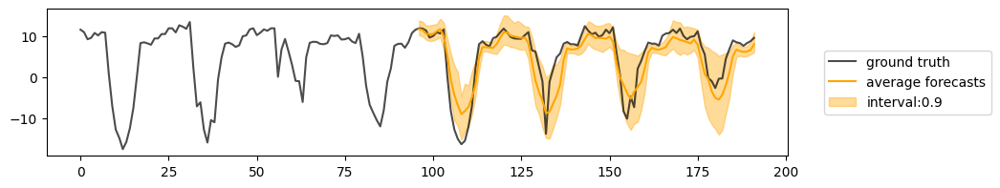

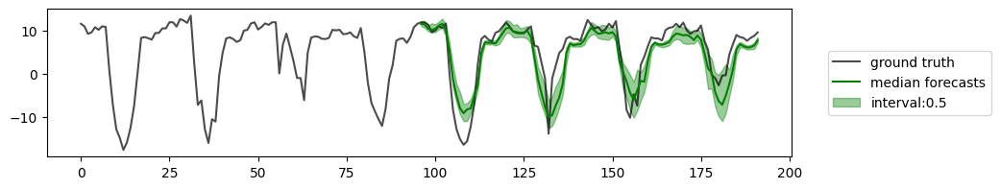

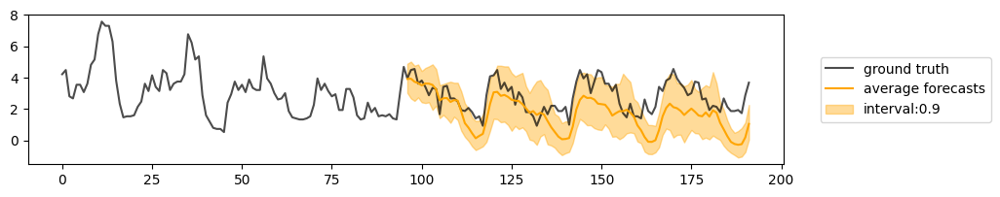

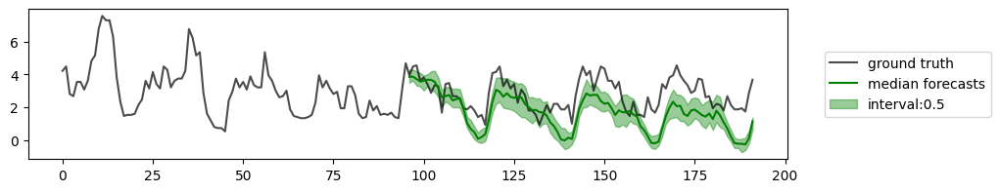

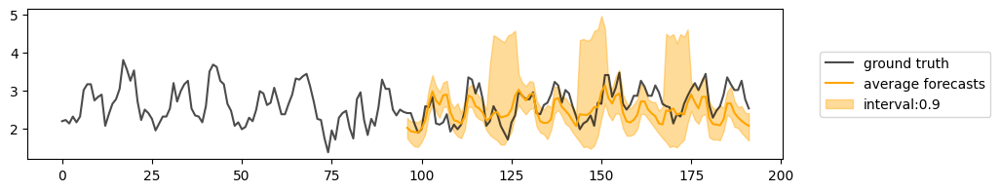

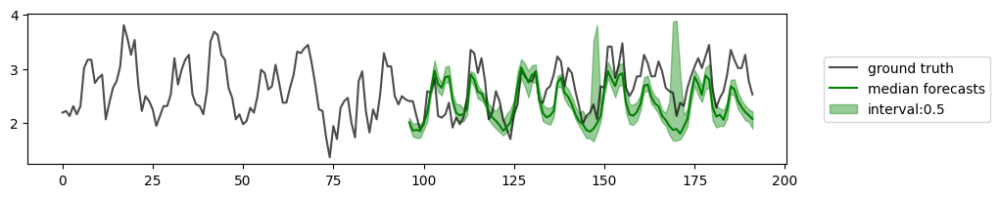

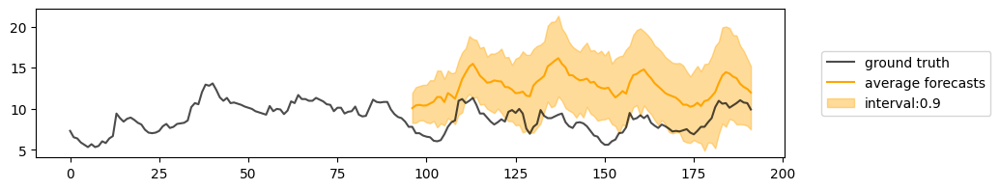

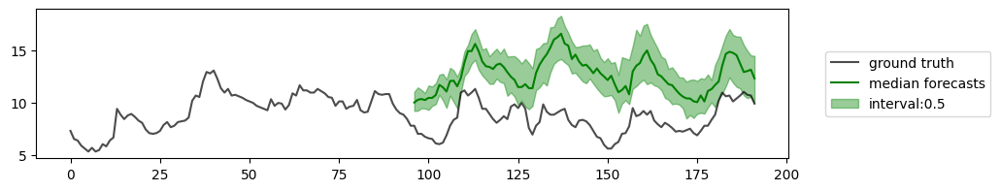

In [81]:
forecast_and_visualize(batch, model, num_chan=[0, 1, 4, 6], num_samples=50, batch_idx=4, context_length=96, prediction_length=96)

### Euler

In [82]:
model.scaler = data_manager.scaler
model.forecaster.solver = 'euler'
model.forecaster.solver_num_steps = 15
model.forecaster.solver_schedule = 'linear'

for batch in test_dataloader:
    break

In [83]:
steps = [10, 15, 20, 30, 50, 100]
euler_time = []
for num_steps in tqdm(steps):
    model.forecaster.solver_num_steps = num_steps
    euler_time.append(time_for_forecast(batch, model, n_repeats=1))
euler_time

100%|██████████| 6/6 [00:00<00:00,  6.10it/s]


[0.043985605239868164,
 0.06304192543029785,
 0.08463454246520996,
 0.12879514694213867,
 0.21712112426757812,
 0.43868160247802734]

In [84]:
euler_metrics = check_metrics_for_samplers(test_dataloader, model, trainer, steps=[10, 15, 20, 30, 50, 100])

  0%|          | 0/6 [00:00<?, ?it/s]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |          | 0/? [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:05<00:27,  5.52s/it]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS          0.4141924977302551
    96_test_CRPS-Sum        0.2580414414405823
      96_test_MASE           4.070685386657715
       96_test_MSE           17.91473960876465
     96_test_MSE-Sum         161.7249298095703
       96_test_ND           0.5358860492706299
     96_test_ND-Sum         0.3207820951938629
      96_test_NRMSE         0.8931545615196228
    96_test_NRMSE-Sum        0.432138592004776
   96_test_weighted_ND      0.5358860492706299
 96_test_weighted_ND-Sum    0.3207820951938629
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing: |          | 0/? [00:00<?, ?it/s]

 33%|███▎      | 2/6 [00:11<00:22,  5.58s/it]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS          0.3988950848579407
    96_test_CRPS-Sum        0.23077960312366486
      96_test_MASE          4.0662736892700195
       96_test_MSE          16.929100036621094
     96_test_MSE-Sum         141.0562744140625
       96_test_ND           0.5442947149276733
     96_test_ND-Sum         0.2935313582420349
      96_test_NRMSE         0.8662706613540649
    96_test_NRMSE-Sum       0.40054869651794434
   96_test_weighted_ND      0.5442947149276733
 96_test_weighted_ND-Sum    0.2935313582420349
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing: |          | 0/? [00:00<?, ?it/s]

 50%|█████     | 3/6 [00:16<00:16,  5.63s/it]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS          0.40530356764793396
    96_test_CRPS-Sum        0.2262185662984848
      96_test_MASE           4.018686771392822
       96_test_MSE          16.407466888427734
     96_test_MSE-Sum        136.43939208984375
       96_test_ND           0.5421357750892639
     96_test_ND-Sum         0.2890964448451996
      96_test_NRMSE         0.8534671664237976
    96_test_NRMSE-Sum       0.39367416501045227
   96_test_weighted_ND      0.5421357750892639
 96_test_weighted_ND-Sum    0.2890964448451996
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing: |          | 0/? [00:00<?, ?it/s]

 67%|██████▋   | 4/6 [00:22<00:11,  5.75s/it]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS          0.4222334027290344
    96_test_CRPS-Sum        0.2260977029800415
      96_test_MASE           4.034833908081055
       96_test_MSE           16.3730411529541
     96_test_MSE-Sum         135.389892578125
       96_test_ND           0.5457574129104614
     96_test_ND-Sum         0.28823766112327576
      96_test_NRMSE         0.8527339696884155
    96_test_NRMSE-Sum       0.39216676354408264
   96_test_weighted_ND      0.5457574129104614
 96_test_weighted_ND-Sum    0.28823766112327576
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing: |          | 0/? [00:00<?, ?it/s]

 83%|████████▎ | 5/6 [00:29<00:05,  5.98s/it]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS          0.43534108996391296
    96_test_CRPS-Sum        0.22886689007282257
      96_test_MASE           4.046977519989014
       96_test_MSE          16.408023834228516
     96_test_MSE-Sum         135.8465118408203
       96_test_ND           0.5508885383605957
     96_test_ND-Sum         0.29092228412628174
      96_test_NRMSE         0.8535022735595703
    96_test_NRMSE-Sum       0.39249852299690247
   96_test_weighted_ND      0.5508885383605957
 96_test_weighted_ND-Sum    0.29092228412628174
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing: |          | 0/? [00:00<?, ?it/s]

100%|██████████| 6/6 [00:36<00:00,  6.12s/it]

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS          0.43731290102005005
    96_test_CRPS-Sum        0.22703194618225098
      96_test_MASE           4.021265983581543
       96_test_MSE          16.245874404907227
     96_test_MSE-Sum        133.44927978515625
       96_test_ND           0.5498920679092407
     96_test_ND-Sum         0.28919073939323425
      96_test_NRMSE         0.8506852984428406
    96_test_NRMSE-Sum       0.38953593373298645
   96_test_weighted_ND      0.5498920679092407
 96_test_weighted_ND-Sum    0.28919073939323425
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


In [85]:
import pickle
with open("euler_metrics.pkl", "wb") as fp:
   pickle.dump(euler_metrics, fp)

10


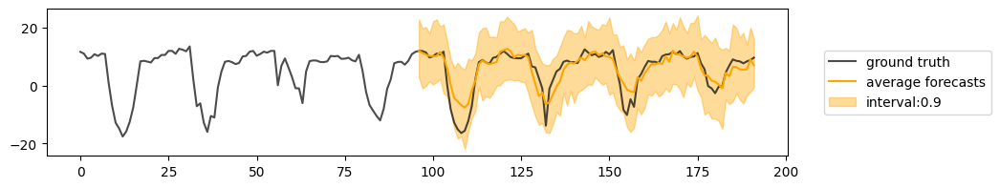

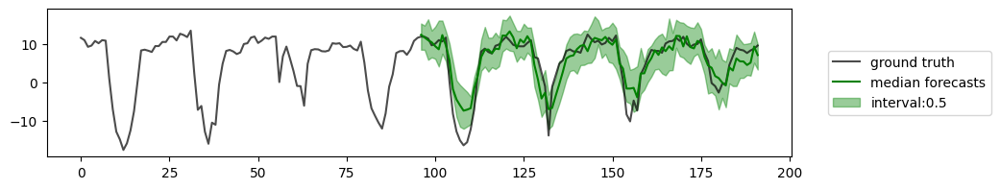

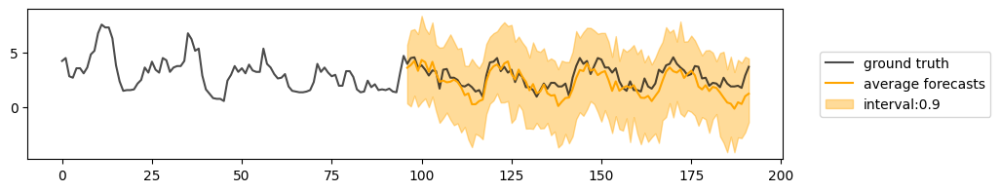

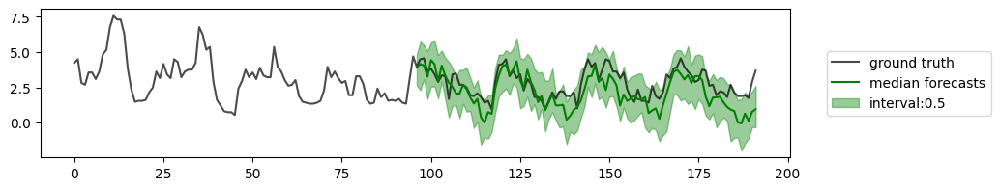

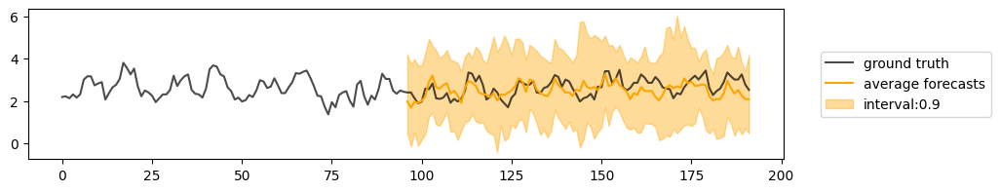

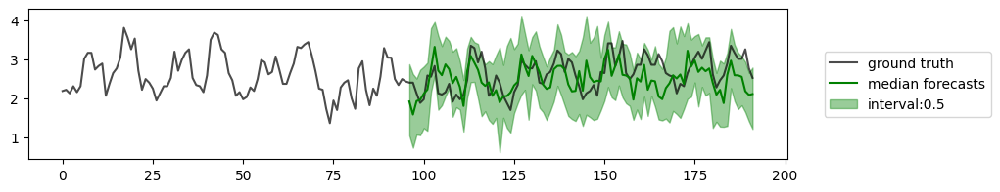

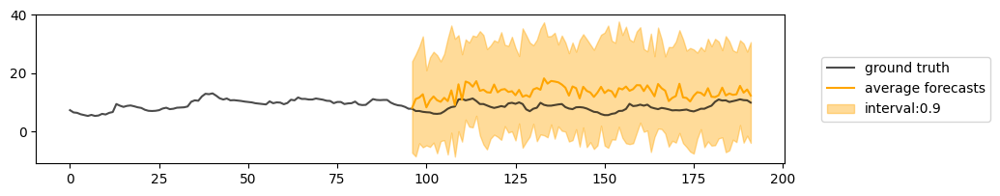

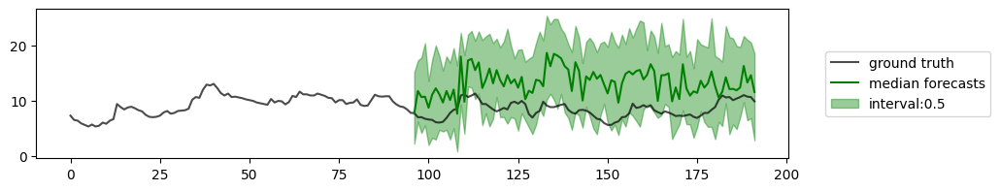

15


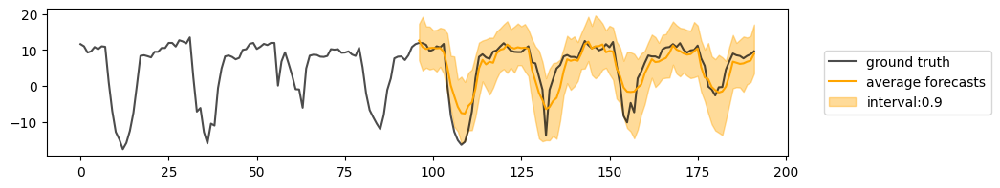

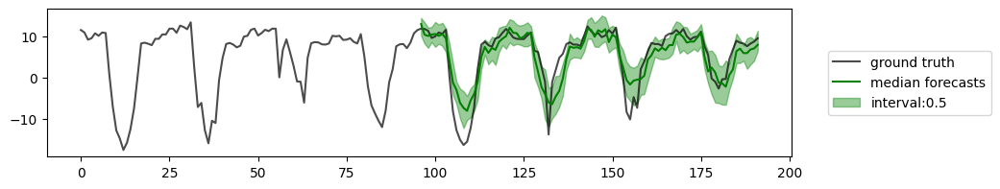

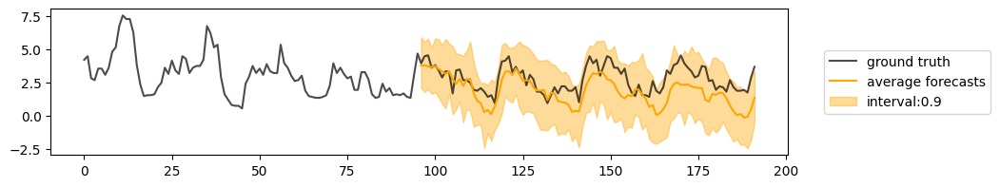

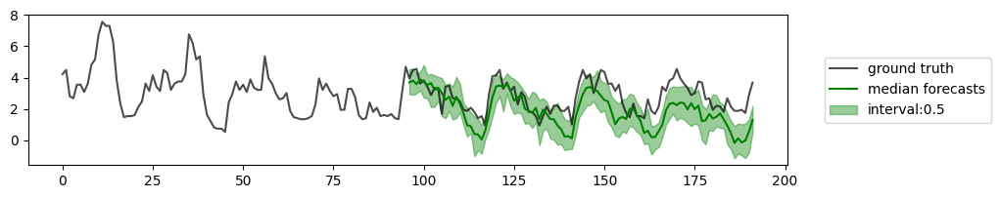

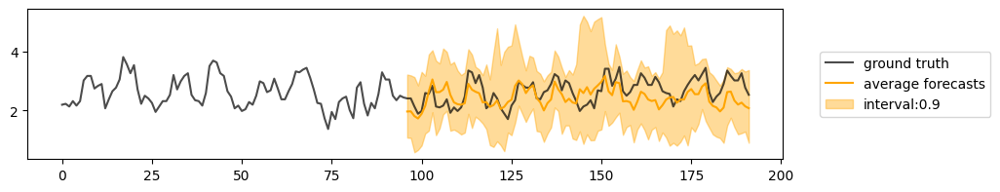

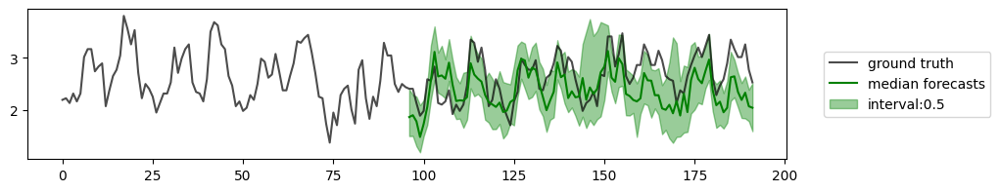

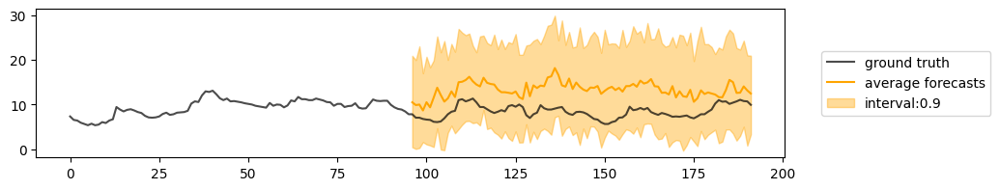

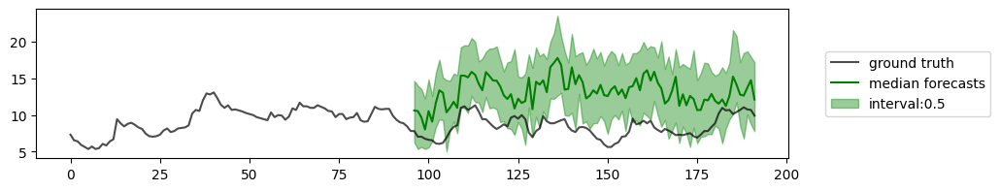

20


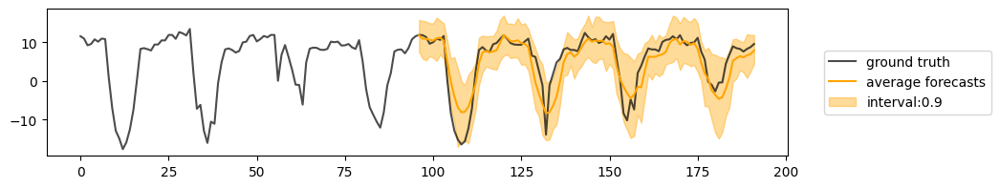

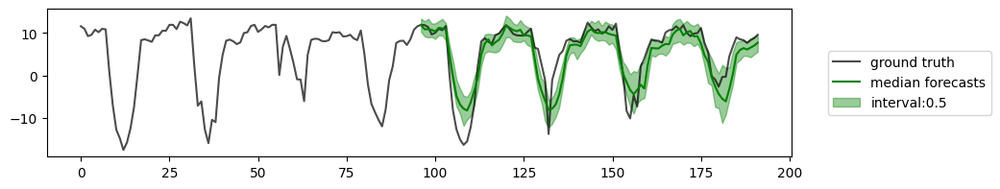

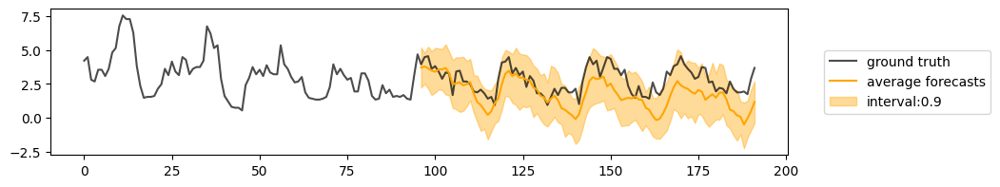

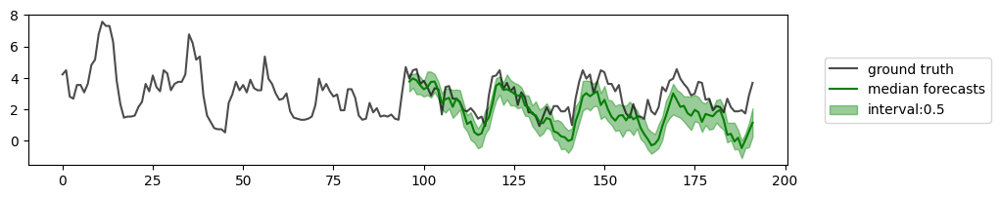

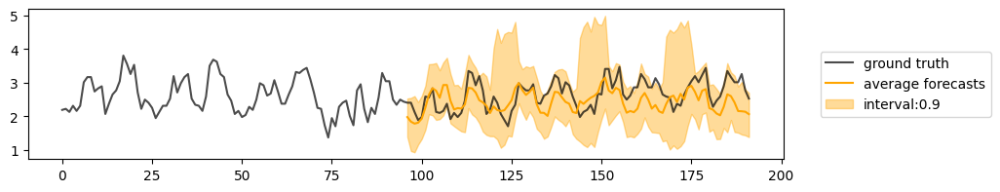

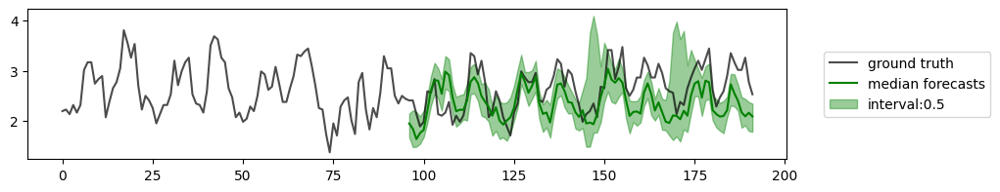

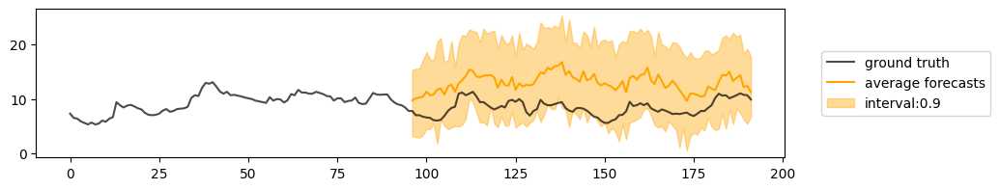

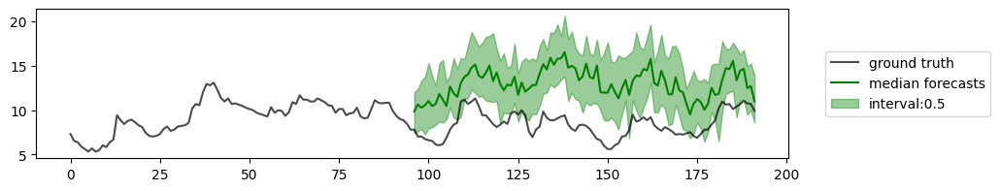

30


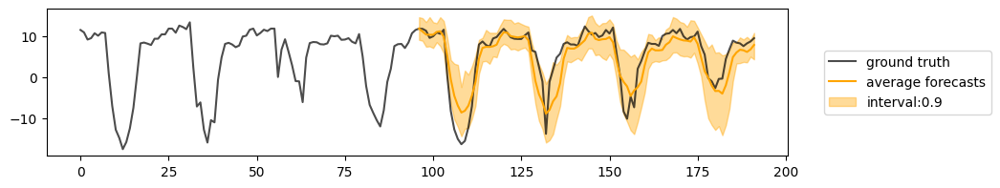

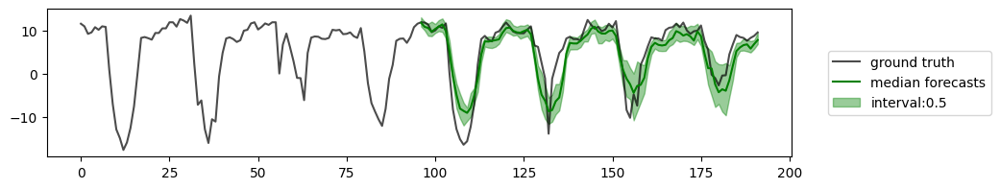

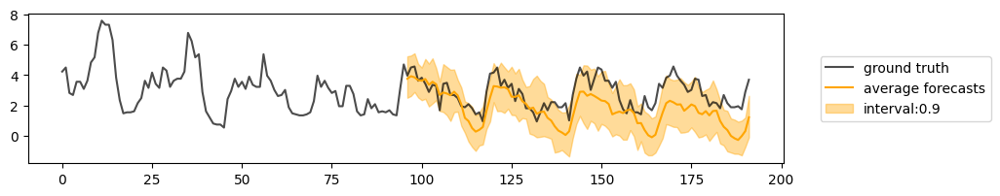

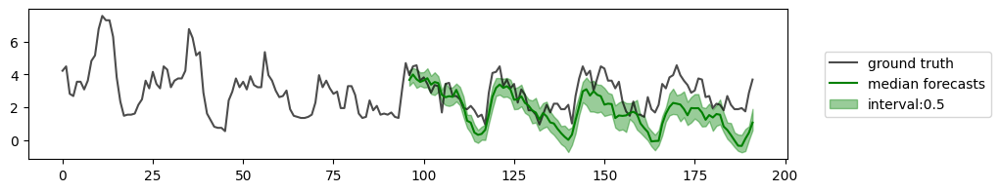

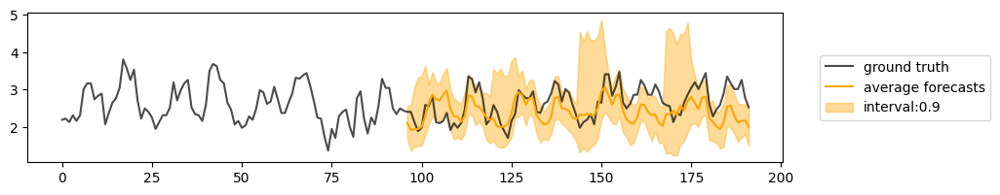

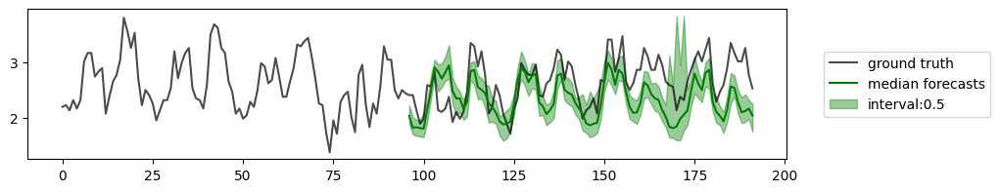

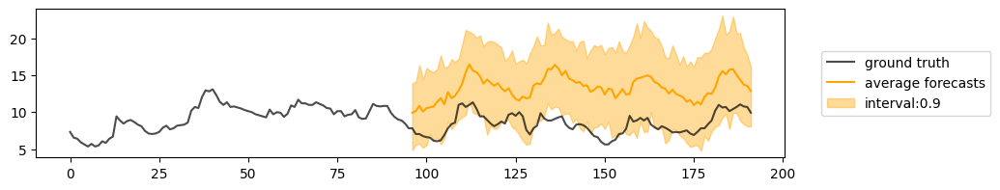

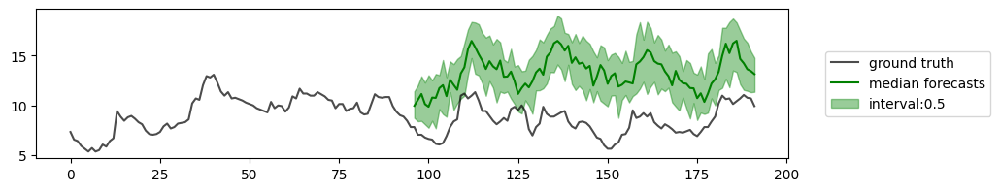

50


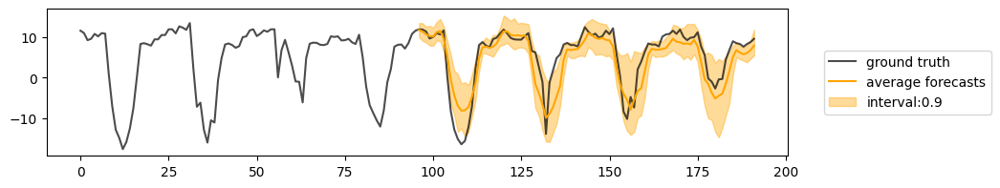

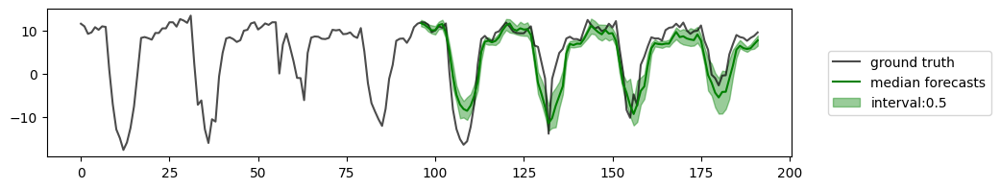

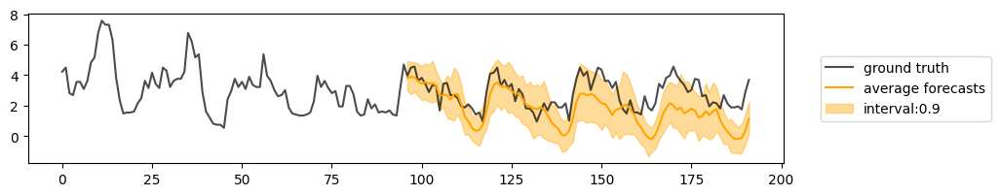

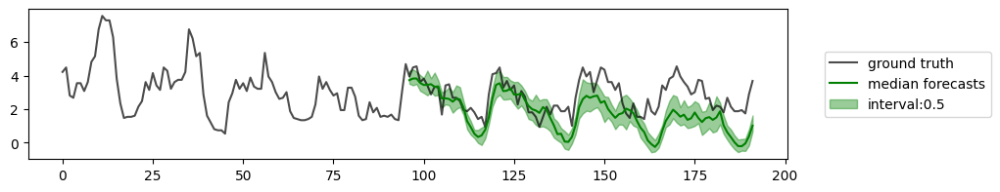

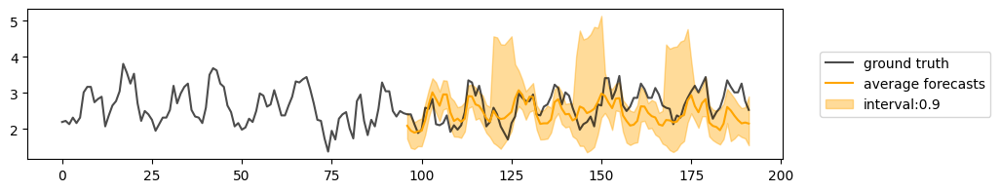

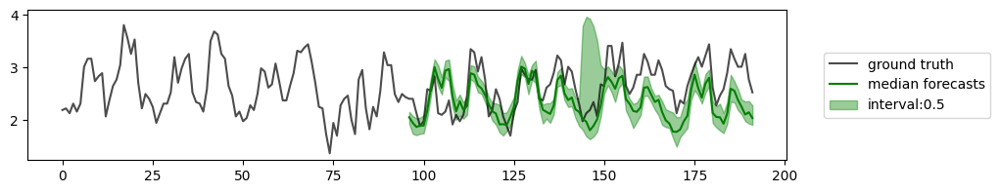

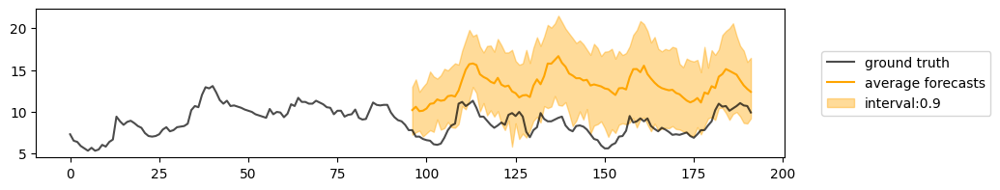

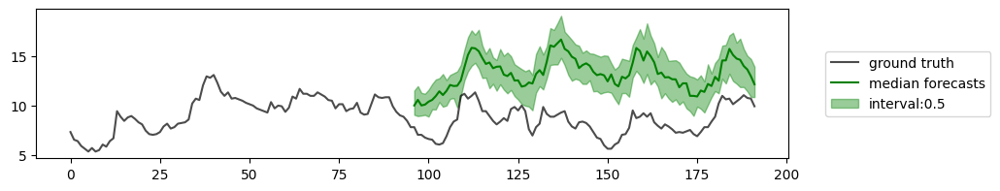

100


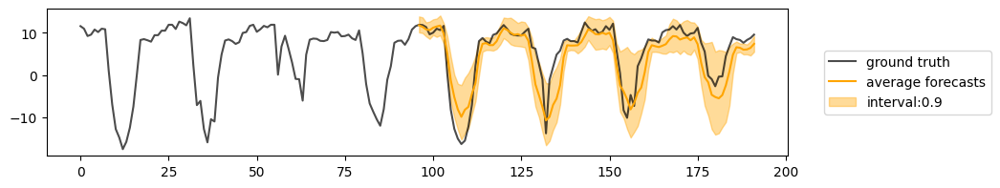

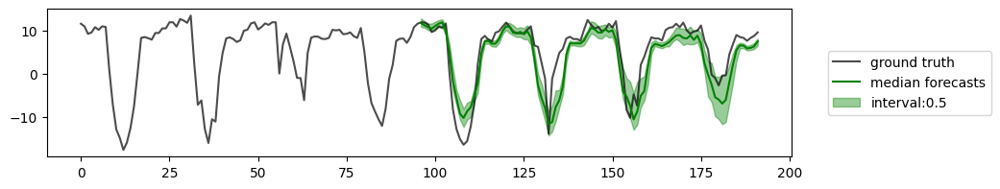

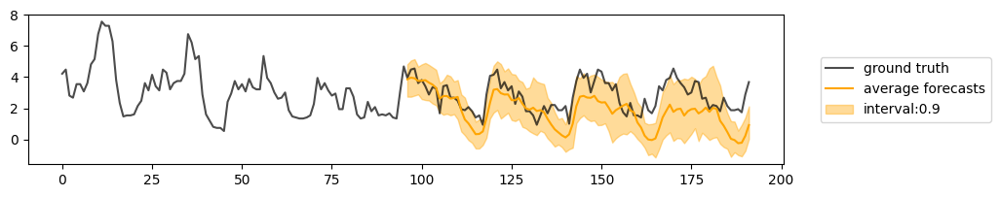

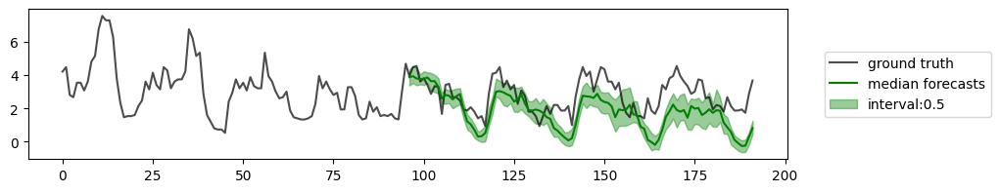

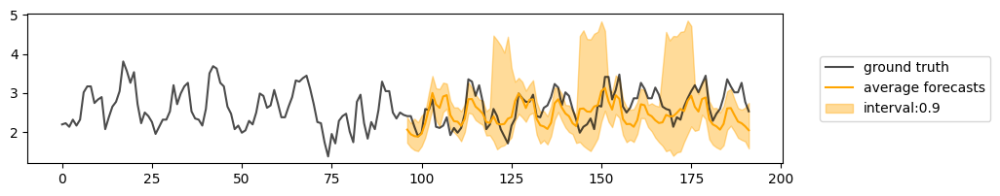

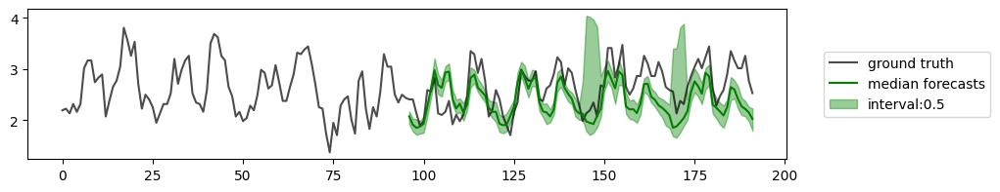

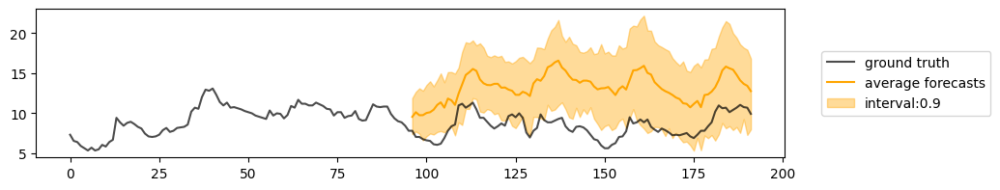

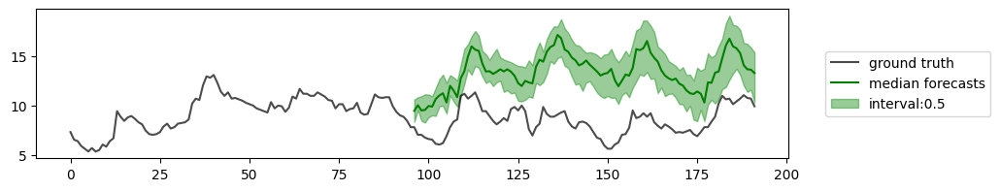

In [86]:
for num_steps in steps:
    print(num_steps)
    model.forecaster.solver_num_steps = num_steps
    forecast_and_visualize(batch, model, num_chan=[0, 1, 4, 6], num_samples=50, batch_idx=4, context_length=96, prediction_length=96) 
    plt.show()

### Heun

In [87]:
model.forecaster.solver = 'heun'
model.scaler = data_manager.scaler
model.forecaster.solver_num_steps = 15
model.forecaster.solver_schedule = 'linear'
steps = [10, 15, 20, 30, 50, 100]

for batch in test_dataloader:
    break

In [88]:
heun_time = []
for num_steps in tqdm(steps):
    model.forecaster.solver_num_steps = num_steps // 2
    heun_time.append(time_for_forecast(batch, model, n_repeats=1))
heun_time

100%|██████████| 6/6 [00:00<00:00,  6.34it/s]


[0.038728952407836914,
 0.05302596092224121,
 0.08159947395324707,
 0.12326717376708984,
 0.21294593811035156,
 0.4294300079345703]

In [89]:
heun_metrics = check_metrics_for_samplers(test_dataloader, model, trainer, steps=[step // 2 for step in steps])

  0%|          | 0/6 [00:00<?, ?it/s]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |          | 0/? [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:05<00:27,  5.46s/it]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS           11.23393440246582
    96_test_CRPS-Sum         5.339910507202148
      96_test_MASE           38.50968933105469
       96_test_MSE           895.2552490234375
     96_test_MSE-Sum          4701.8037109375
       96_test_ND            4.865146636962891
     96_test_ND-Sum          2.332825183868408
      96_test_NRMSE          6.460700511932373
    96_test_NRMSE-Sum       2.4317471981048584
   96_test_weighted_ND       4.865146636962891
 96_test_weighted_ND-Sum     2.332825183868408
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing: |          | 0/? [00:00<?, ?it/s]

 33%|███▎      | 2/6 [00:11<00:22,  5.51s/it]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS          1.5103646516799927
    96_test_CRPS-Sum         0.693867564201355
      96_test_MASE           7.829691410064697
       96_test_MSE           49.22771072387695
     96_test_MSE-Sum        353.78656005859375
       96_test_ND            1.021700143814087
     96_test_ND-Sum         0.5510607957839966
      96_test_NRMSE         1.5004240274429321
    96_test_NRMSE-Sum        0.660207986831665
   96_test_weighted_ND       1.021700143814087
 96_test_weighted_ND-Sum    0.5510607957839966
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing: |          | 0/? [00:00<?, ?it/s]

 50%|█████     | 3/6 [00:16<00:16,  5.58s/it]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS          0.4555909335613251
    96_test_CRPS-Sum        0.25984901189804077
      96_test_MASE           4.274837493896484
       96_test_MSE           19.65992546081543
     96_test_MSE-Sum        178.04214477539062
       96_test_ND           0.5660252571105957
     96_test_ND-Sum         0.31781572103500366
      96_test_NRMSE         0.9333505630493164
    96_test_NRMSE-Sum       0.45315226912498474
   96_test_weighted_ND      0.5660252571105957
 96_test_weighted_ND-Sum    0.31781572103500366
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing: |          | 0/? [00:00<?, ?it/s]

 67%|██████▋   | 4/6 [00:22<00:11,  5.71s/it]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS          0.4470992684364319
    96_test_CRPS-Sum        0.2372579127550125
      96_test_MASE           4.153214454650879
       96_test_MSE          17.548805236816406
     96_test_MSE-Sum        150.23532104492188
       96_test_ND           0.5561059713363647
     96_test_ND-Sum         0.2958088219165802
      96_test_NRMSE         0.8805491924285889
    96_test_NRMSE-Sum       0.4138942062854767
   96_test_weighted_ND      0.5561059713363647
 96_test_weighted_ND-Sum    0.2958088219165802
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing: |          | 0/? [00:00<?, ?it/s]

 83%|████████▎ | 5/6 [00:28<00:05,  5.95s/it]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS          0.44475048780441284
    96_test_CRPS-Sum        0.22945478558540344
      96_test_MASE           4.114531993865967
       96_test_MSE           16.89299201965332
     96_test_MSE-Sum        139.07452392578125
       96_test_ND           0.5551148653030396
     96_test_ND-Sum          0.29001584649086
      96_test_NRMSE         0.8655692338943481
    96_test_NRMSE-Sum        0.398227721452713
   96_test_weighted_ND      0.5551148653030396
 96_test_weighted_ND-Sum     0.29001584649086
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing: |          | 0/? [00:00<?, ?it/s]

100%|██████████| 6/6 [00:36<00:00,  6.09s/it]

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS          0.4413265883922577
    96_test_CRPS-Sum        0.22799797356128693
      96_test_MASE           4.076651573181152
       96_test_MSE          16.496063232421875
     96_test_MSE-Sum        135.91014099121094
       96_test_ND           0.5531101822853088
     96_test_ND-Sum         0.29080507159233093
      96_test_NRMSE         0.8563516736030579
    96_test_NRMSE-Sum       0.39267414808273315
   96_test_weighted_ND      0.5531101822853088
 96_test_weighted_ND-Sum    0.29080507159233093
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


In [90]:
import pickle
with open("heun_metrics.pkl", "wb") as fp:
   pickle.dump(heun_metrics, fp)

10


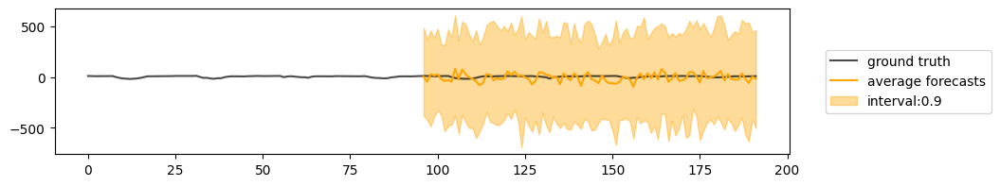

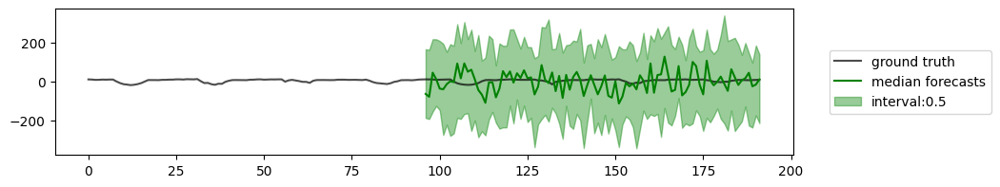

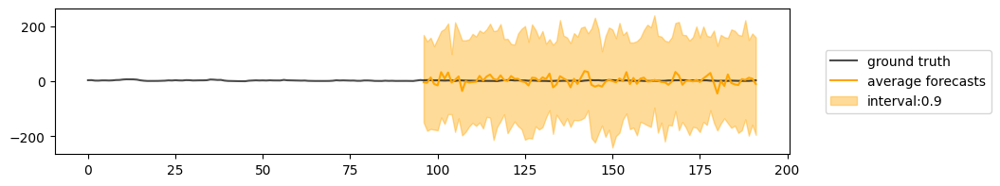

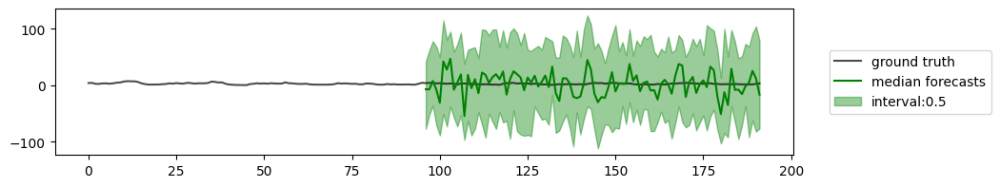

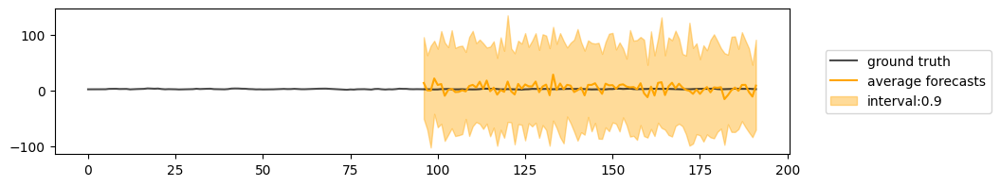

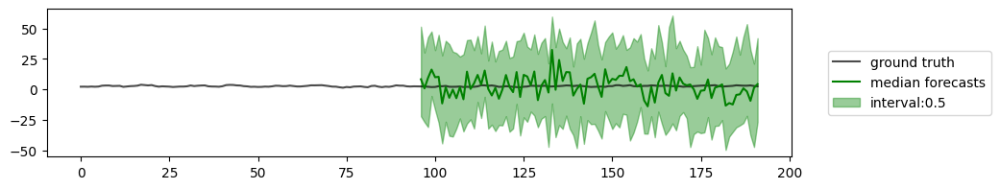

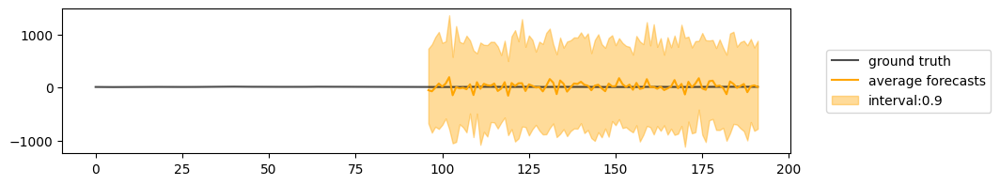

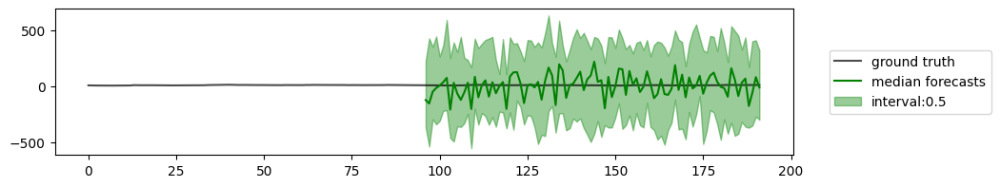

15


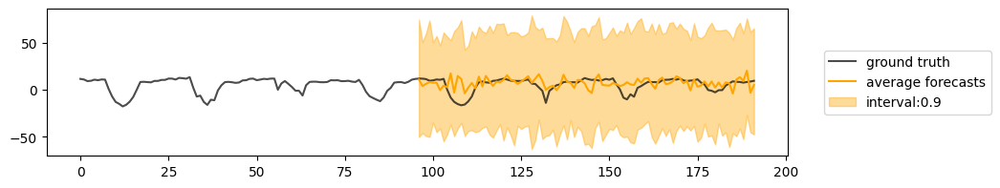

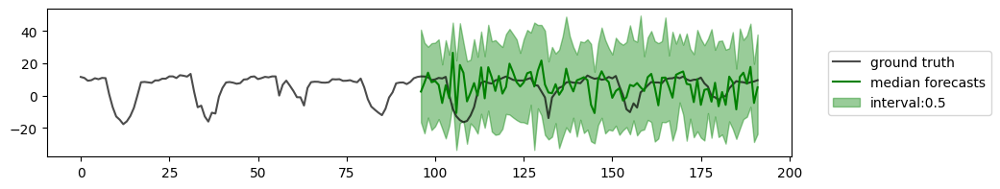

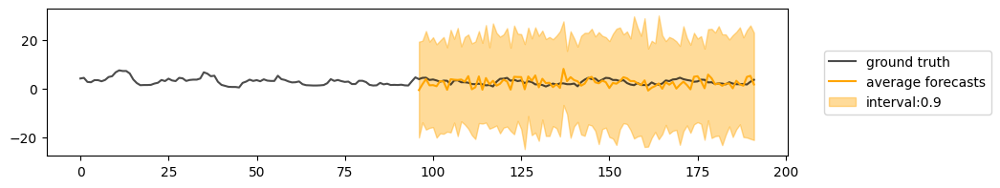

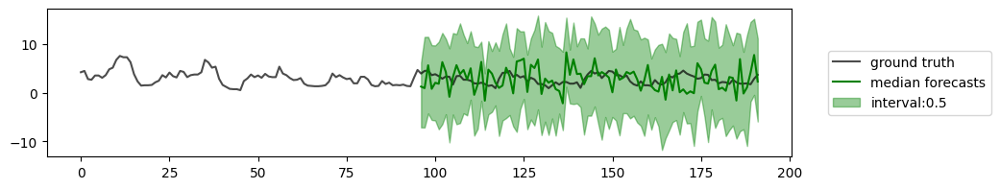

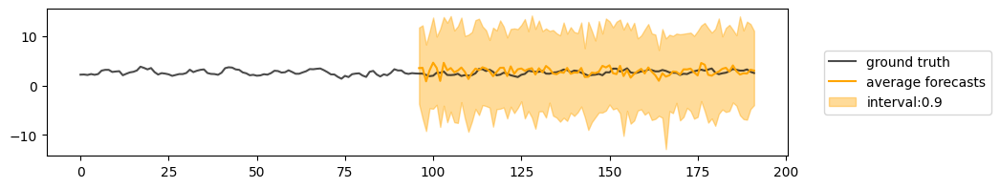

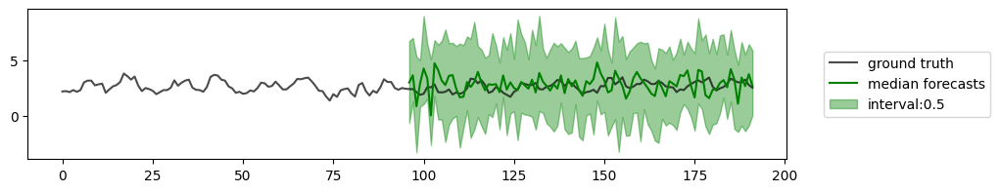

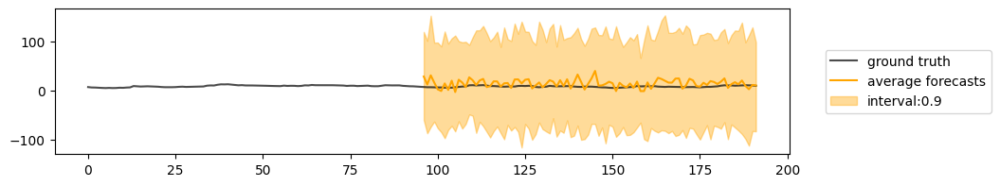

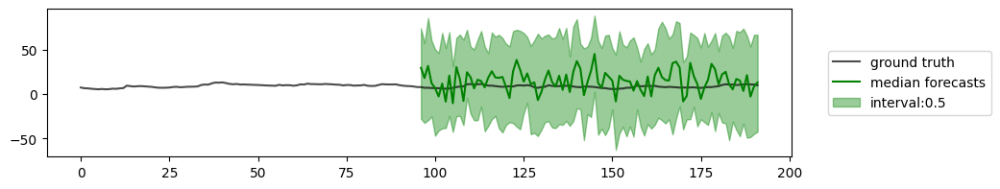

20


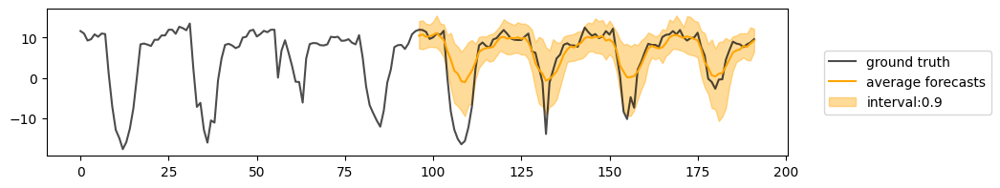

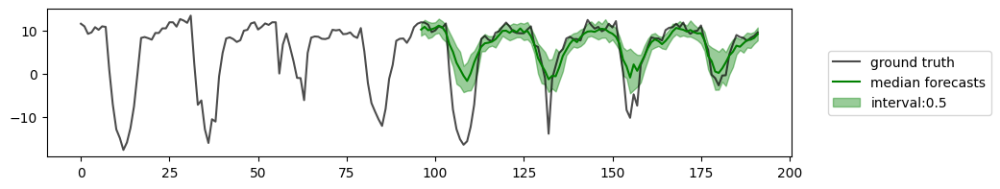

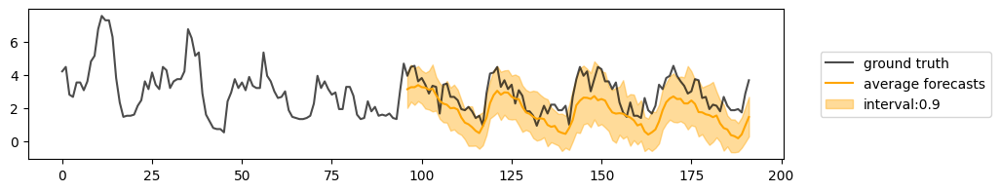

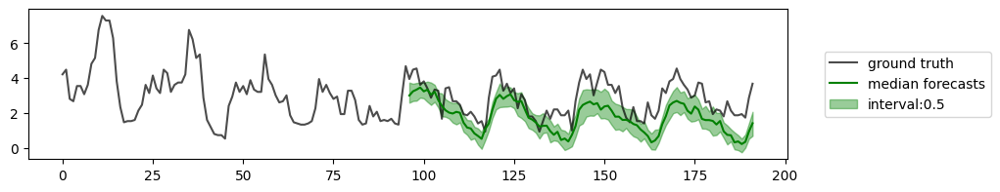

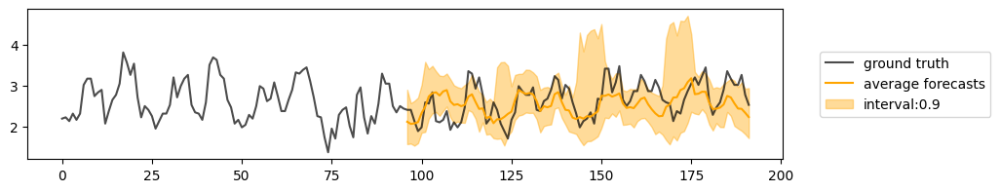

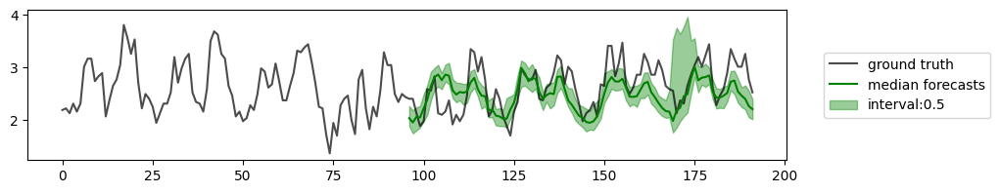

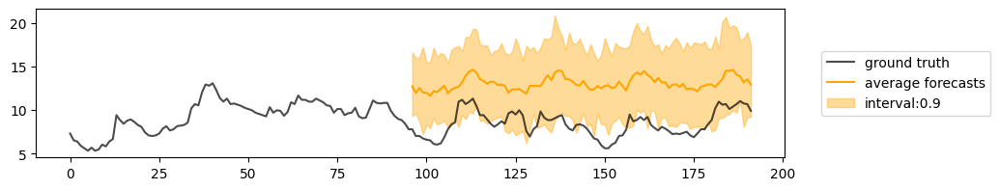

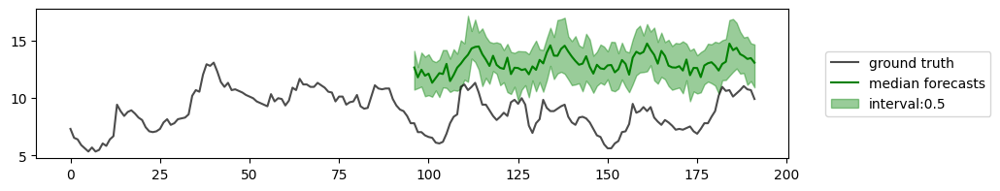

30


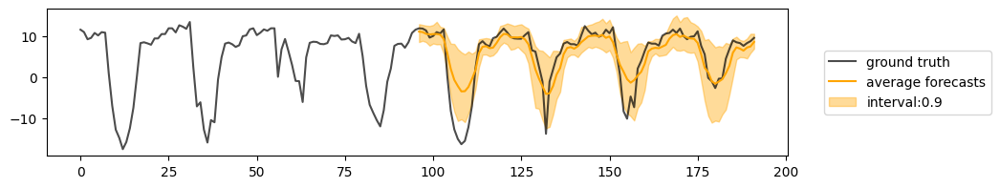

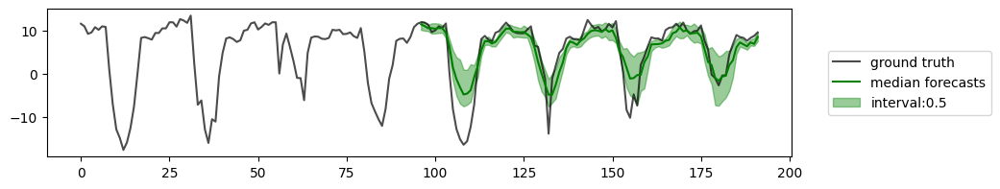

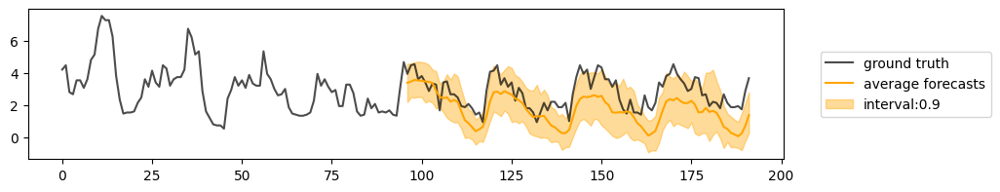

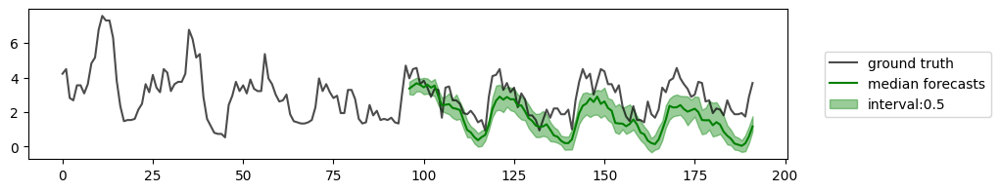

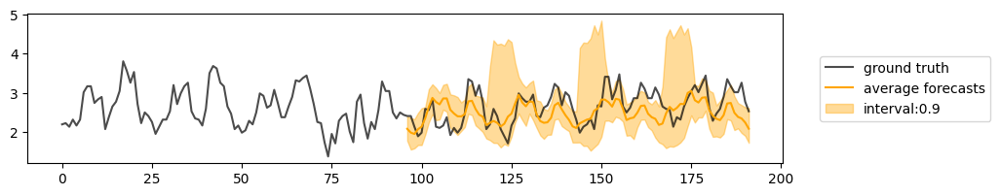

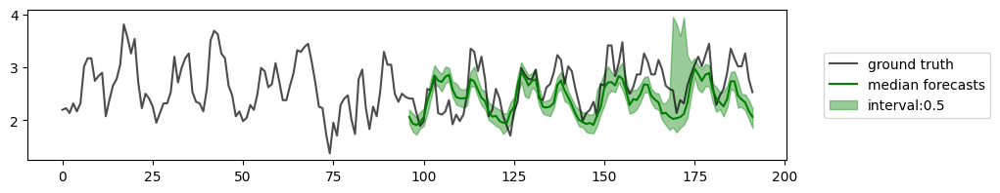

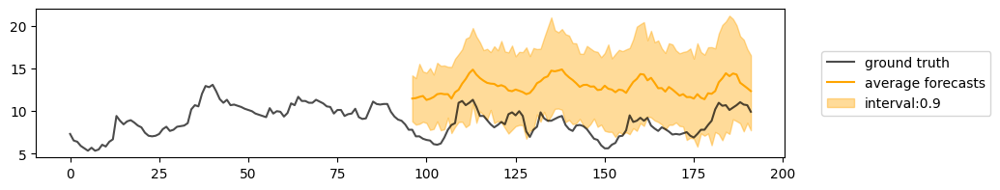

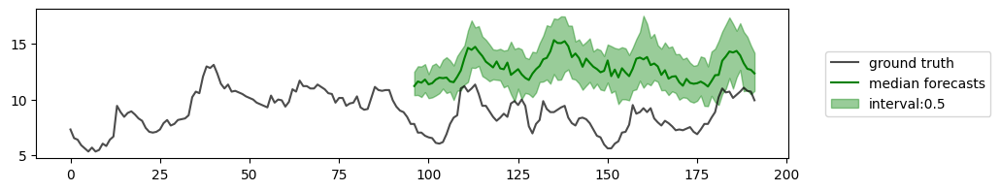

50


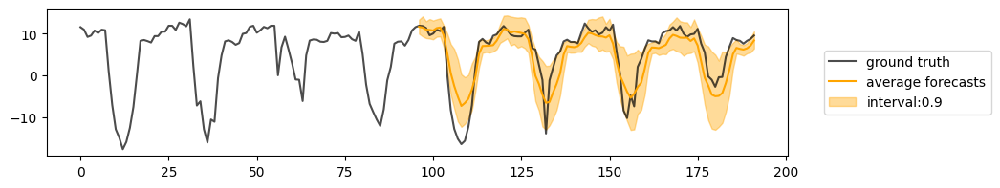

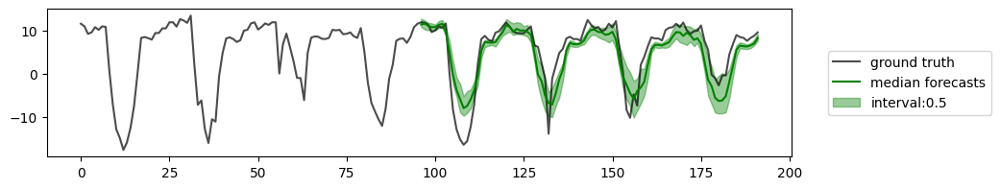

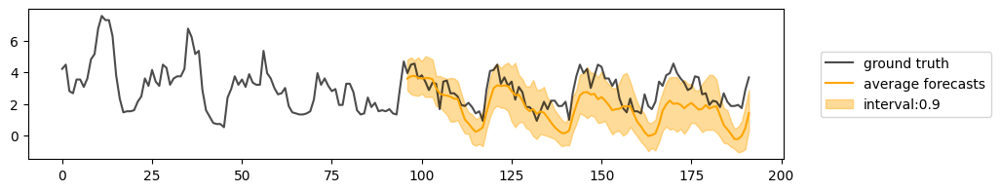

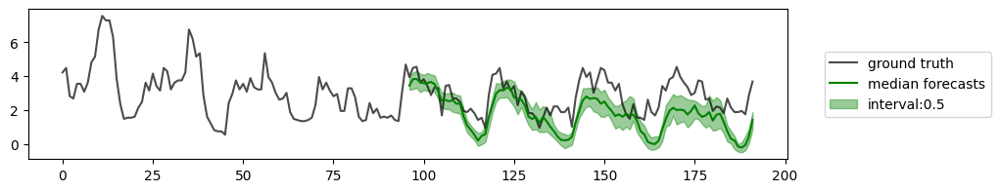

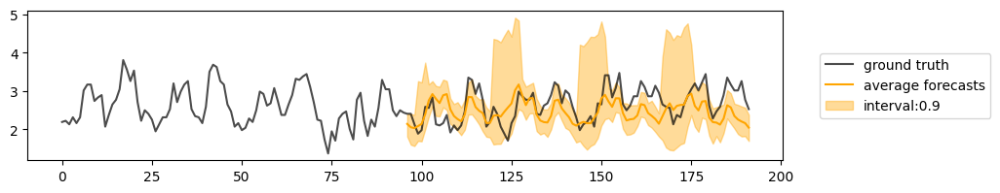

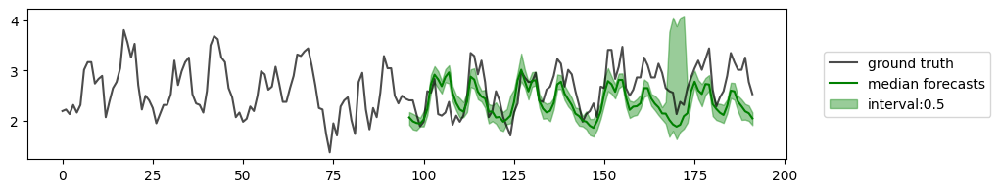

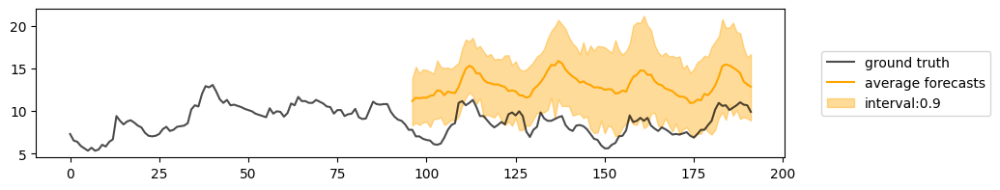

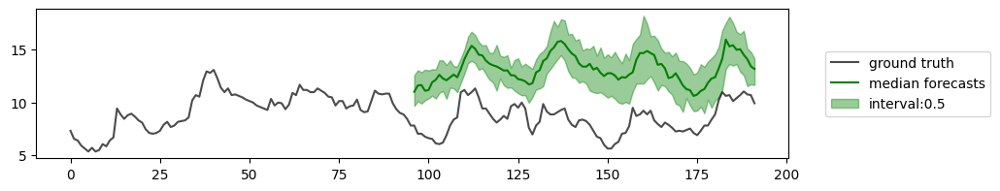

100


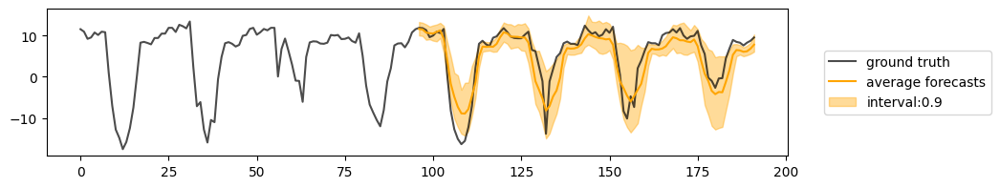

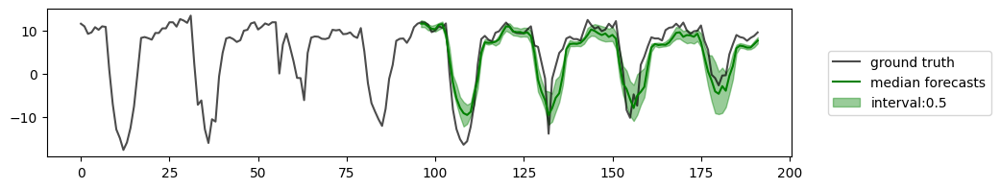

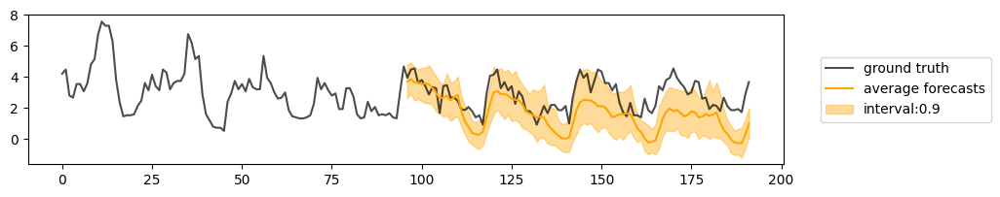

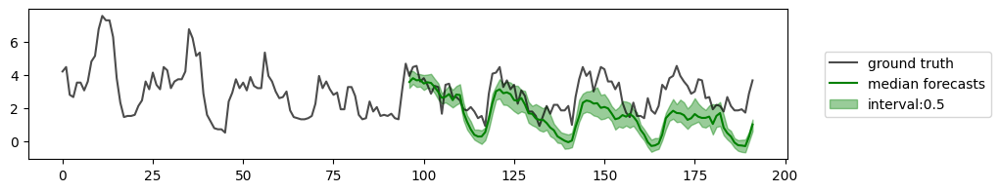

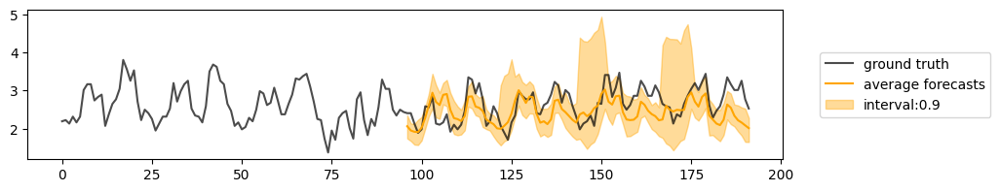

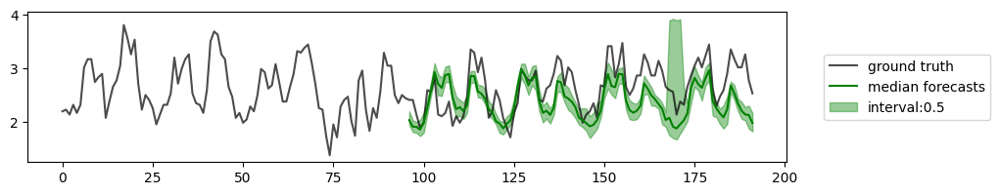

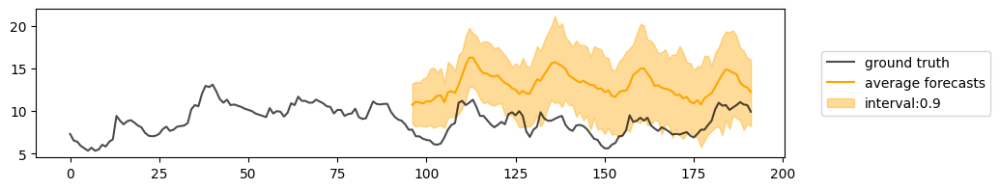

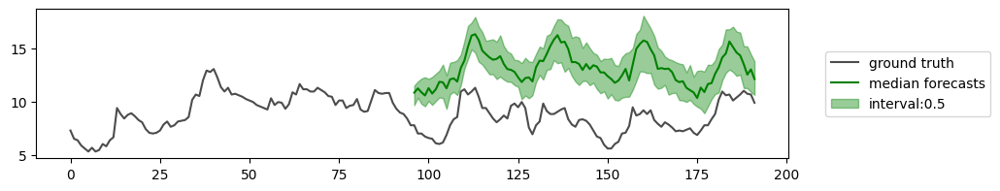

In [91]:
for num_steps in steps:
    print(num_steps)
    model.forecaster.solver_num_steps = num_steps // 2
    forecast_and_visualize(batch, model, num_chan=[0, 1, 4, 6], num_samples=50, batch_idx=4, context_length=96, prediction_length=96)
    plt.show()

### DDIM, quad

In [92]:
model.forecaster.solver = 'ddim'
model.forecaster.solver_schedule = 'quad'

for batch in test_dataloader:
    break

In [93]:
ddim_time = []
for num_steps in tqdm(steps):
    model.forecaster.solver_num_steps = num_steps
    ddim_time.append(time_for_forecast(batch, model, n_repeats=1))
ddim_time

100%|██████████| 6/6 [00:00<00:00,  6.17it/s]


[0.04303145408630371,
 0.06158089637756348,
 0.08330464363098145,
 0.12932848930358887,
 0.21355533599853516,
 0.4331536293029785]

In [94]:
ddim_quad_metrics = check_metrics_for_samplers(test_dataloader, model, trainer, steps=steps)

  0%|          | 0/6 [00:00<?, ?it/s]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |          | 0/? [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:05<00:27,  5.50s/it]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS          0.4367167353630066
    96_test_CRPS-Sum        0.3385010361671448
      96_test_MASE          3.2867960929870605
       96_test_MSE          14.437769889831543
     96_test_MSE-Sum         189.957275390625
       96_test_ND           0.5152804255485535
     96_test_ND-Sum         0.4121292233467102
      96_test_NRMSE         0.7874982953071594
    96_test_NRMSE-Sum       0.47722622752189636
   96_test_weighted_ND      0.5152804255485535
 96_test_weighted_ND-Sum    0.4121292233467102
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing: |          | 0/? [00:00<?, ?it/s]

 33%|███▎      | 2/6 [00:11<00:22,  5.56s/it]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS          0.4137369692325592
    96_test_CRPS-Sum        0.2512069642543793
      96_test_MASE          3.5265841484069824
       96_test_MSE          13.571929931640625
     96_test_MSE-Sum         140.3231658935547
       96_test_ND           0.5153135657310486
     96_test_ND-Sum         0.3182128667831421
      96_test_NRMSE         0.7679349780082703
    96_test_NRMSE-Sum       0.40471407771110535
   96_test_weighted_ND      0.5153135657310486
 96_test_weighted_ND-Sum    0.3182128667831421
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing: |          | 0/? [00:00<?, ?it/s]

 50%|█████     | 3/6 [00:16<00:16,  5.63s/it]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS          0.41038304567337036
    96_test_CRPS-Sum        0.2377554178237915
      96_test_MASE           3.611577033996582
       96_test_MSE          13.845234870910645
     96_test_MSE-Sum        135.32667541503906
       96_test_ND           0.5183605551719666
     96_test_ND-Sum         0.30249443650245667
      96_test_NRMSE         0.7768175005912781
    96_test_NRMSE-Sum       0.3953006863594055
   96_test_weighted_ND      0.5183605551719666
 96_test_weighted_ND-Sum    0.30249443650245667
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing: |          | 0/? [00:00<?, ?it/s]

 67%|██████▋   | 4/6 [00:22<00:11,  5.75s/it]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS          0.4122781753540039
    96_test_CRPS-Sum        0.22927139699459076
      96_test_MASE          3.7361714839935303
       96_test_MSE          14.215425491333008
     96_test_MSE-Sum        131.55455017089844
       96_test_ND           0.5256226062774658
     96_test_ND-Sum         0.2939888834953308
      96_test_NRMSE         0.7897228002548218
    96_test_NRMSE-Sum       0.3894003629684448
   96_test_weighted_ND      0.5256226062774658
 96_test_weighted_ND-Sum    0.2939888834953308
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing: |          | 0/? [00:00<?, ?it/s]

 83%|████████▎ | 5/6 [00:29<00:05,  5.99s/it]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS          0.4154779613018036
    96_test_CRPS-Sum        0.22577092051506042
      96_test_MASE          3.8230371475219727
       96_test_MSE          14.519017219543457
     96_test_MSE-Sum         130.4146728515625
       96_test_ND           0.5316860675811768
     96_test_ND-Sum         0.2899596393108368
      96_test_NRMSE         0.7991105914115906
    96_test_NRMSE-Sum       0.3876134753227234
   96_test_weighted_ND      0.5316860675811768
 96_test_weighted_ND-Sum    0.2899596393108368
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing: |          | 0/? [00:00<?, ?it/s]

100%|██████████| 6/6 [00:36<00:00,  6.12s/it]

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS          0.41702091693878174
    96_test_CRPS-Sum        0.22491757571697235
      96_test_MASE           3.848950147628784
       96_test_MSE          14.768890380859375
     96_test_MSE-Sum        131.25576782226562
       96_test_ND           0.5349451899528503
     96_test_ND-Sum         0.2883596122264862
      96_test_NRMSE         0.8066965937614441
    96_test_NRMSE-Sum       0.3878321945667267
   96_test_weighted_ND      0.5349451899528503
 96_test_weighted_ND-Sum    0.2883596122264862
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


In [95]:
with open("ddim_quad_metrics.pkl", "wb") as fp:
   pickle.dump(ddim_quad_metrics, fp)

10


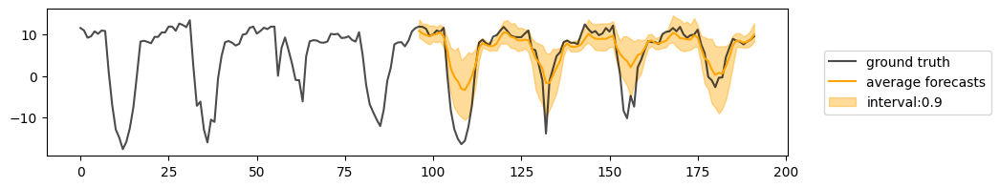

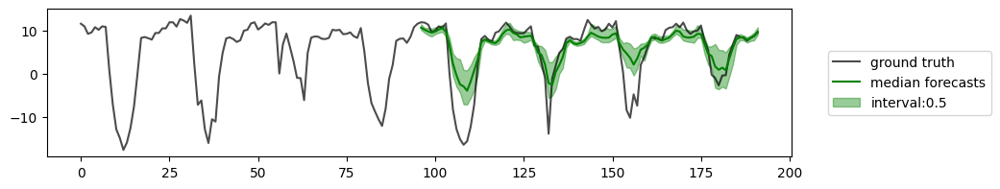

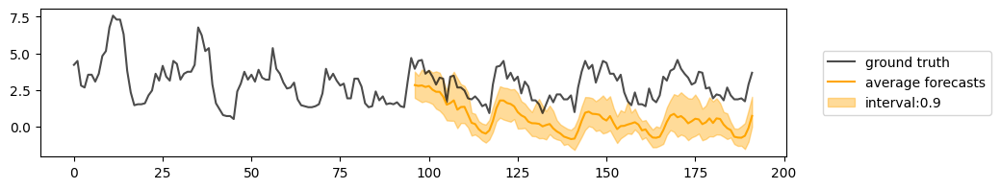

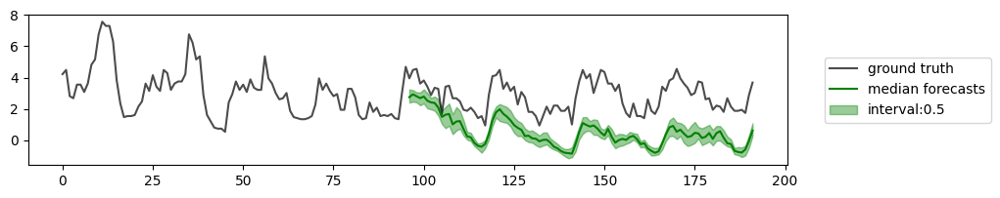

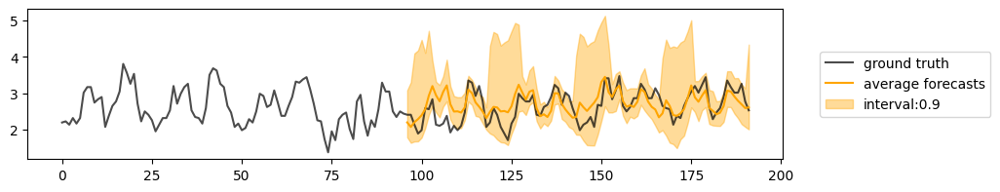

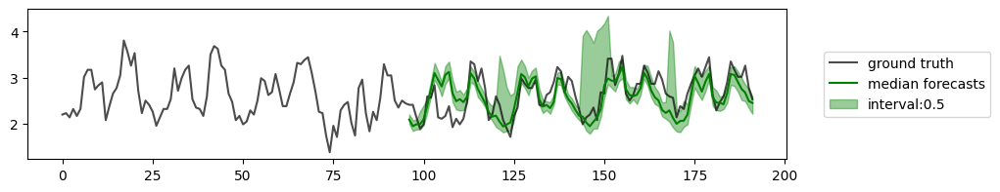

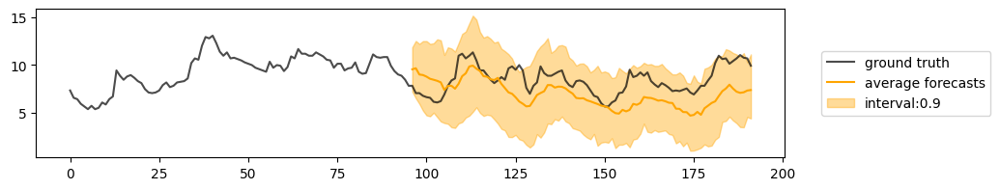

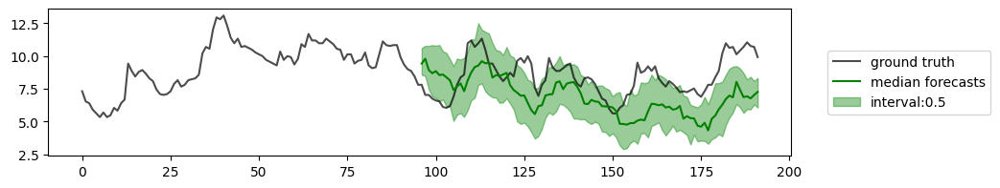

15


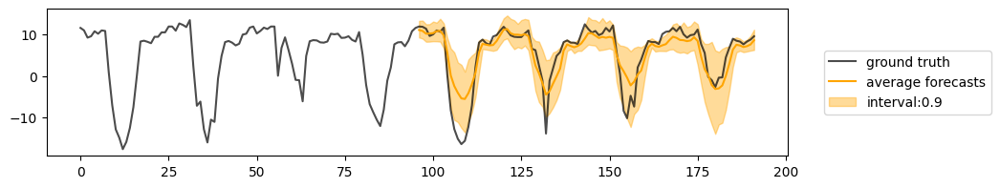

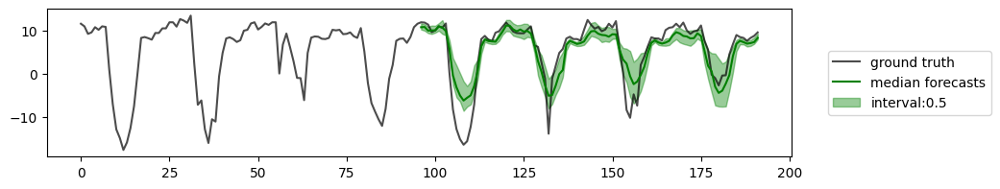

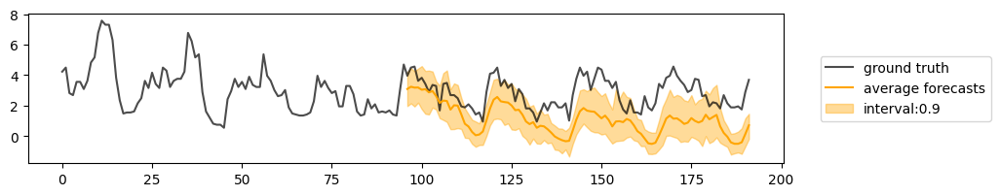

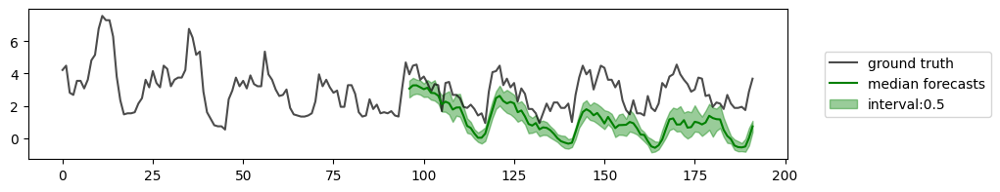

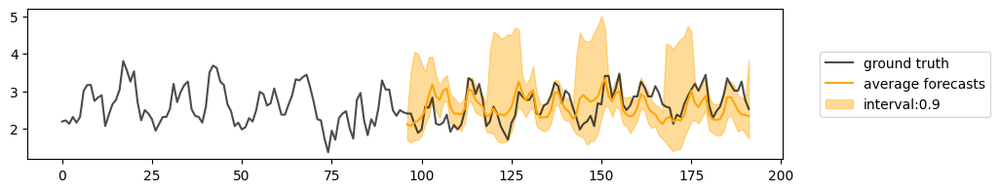

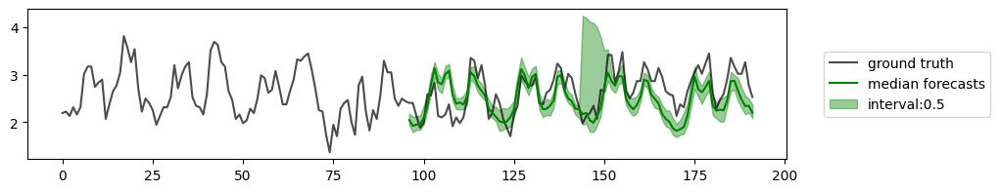

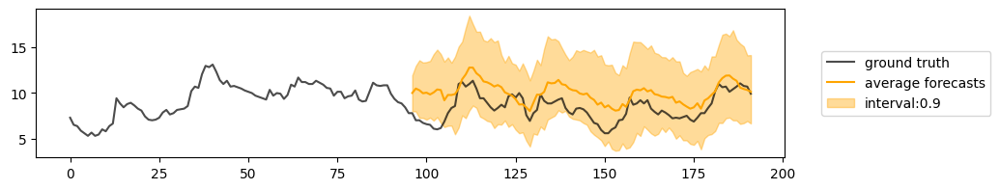

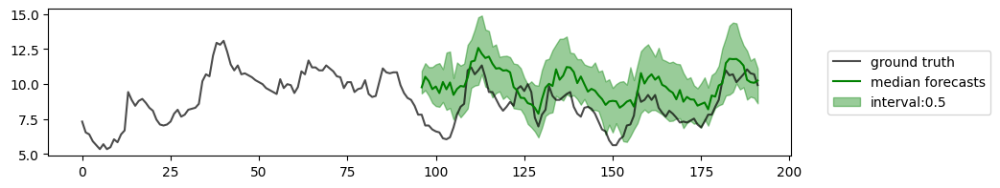

20


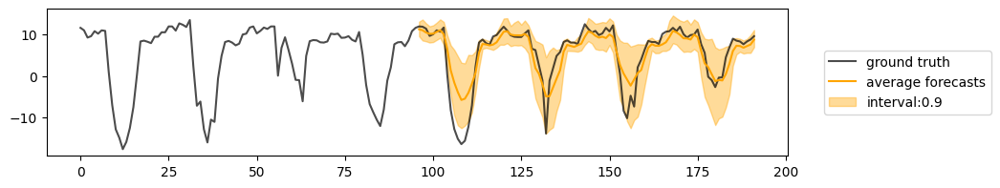

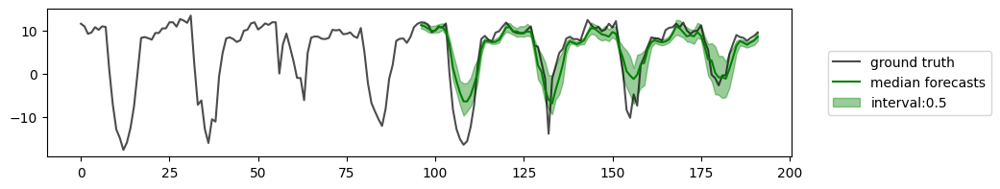

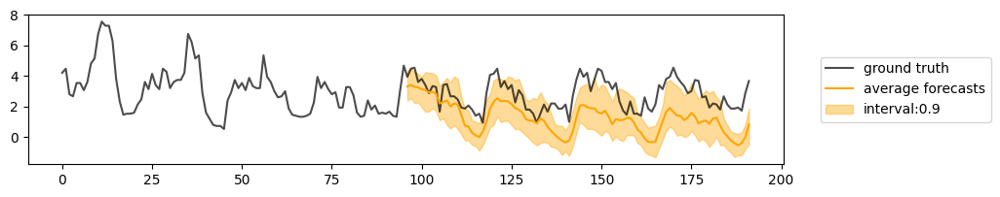

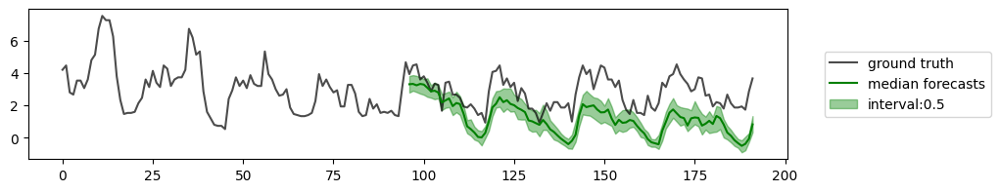

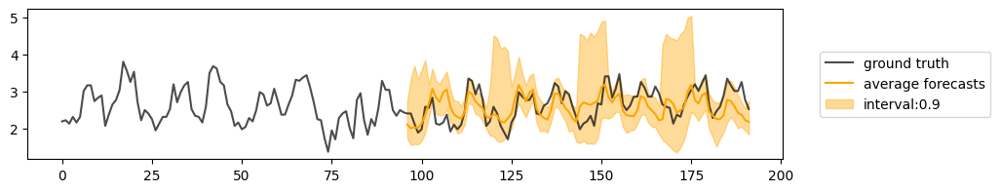

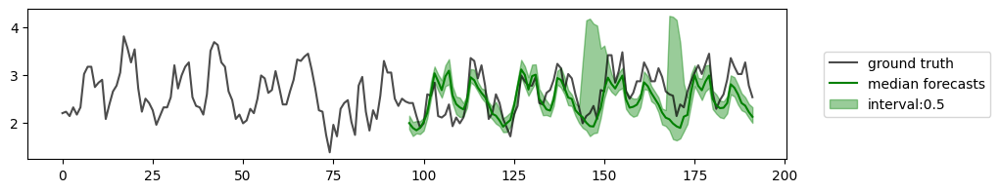

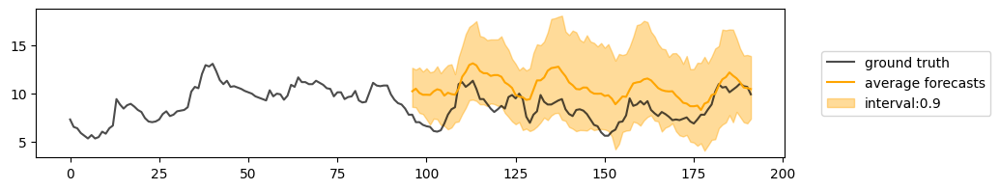

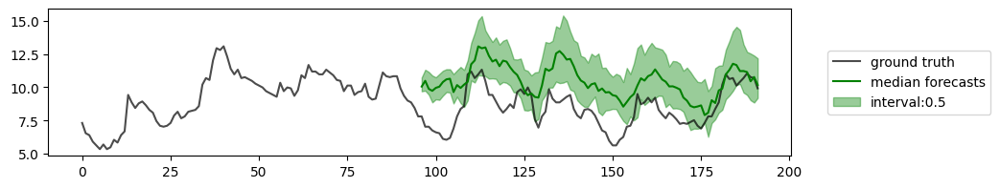

30


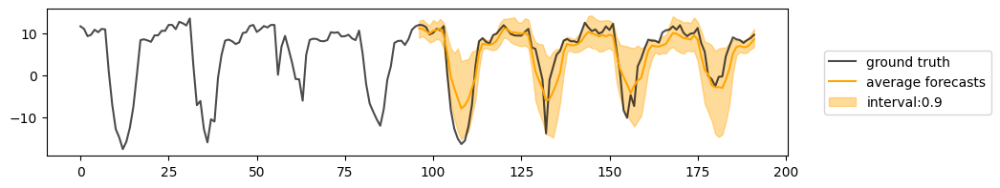

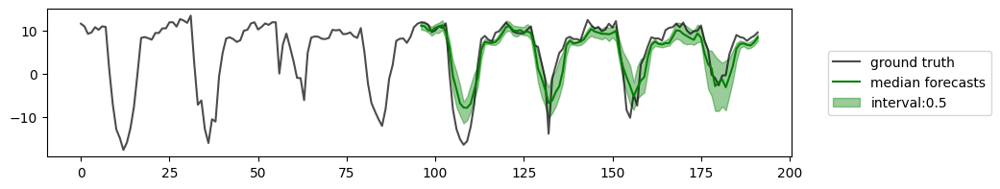

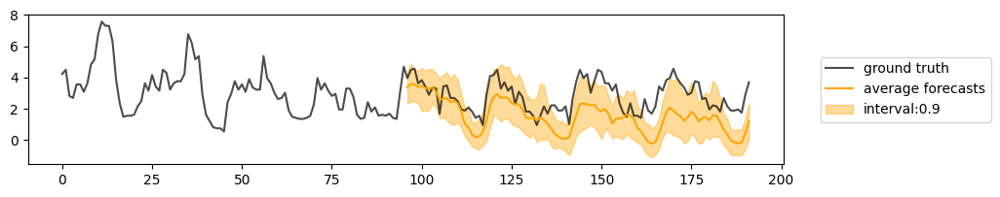

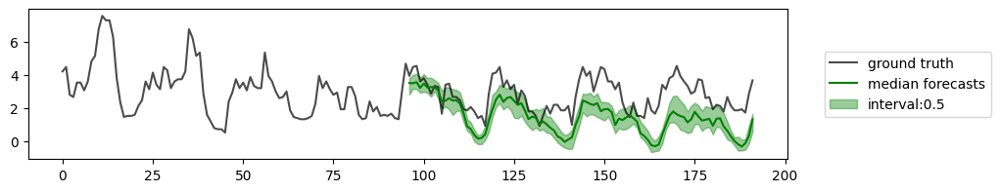

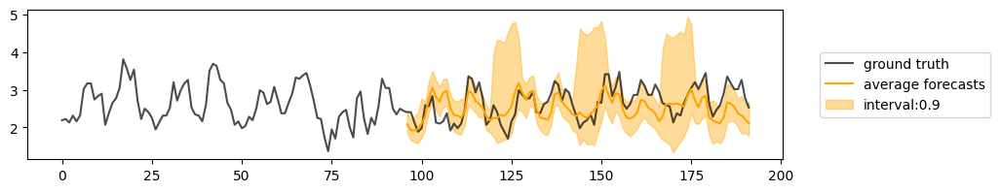

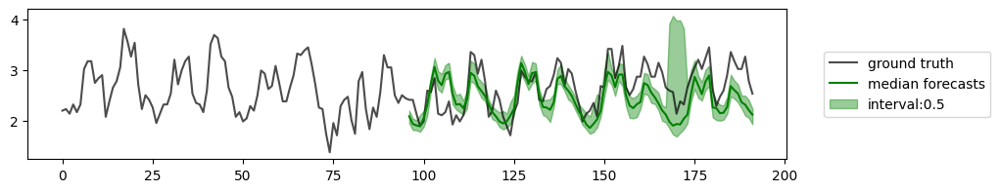

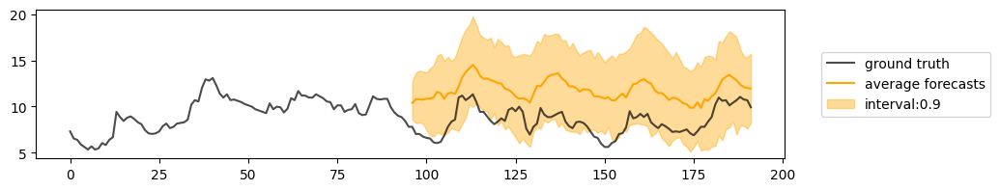

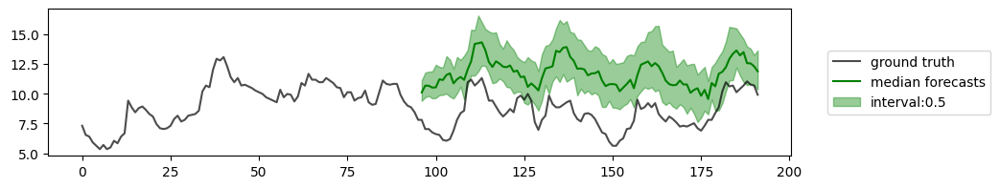

50


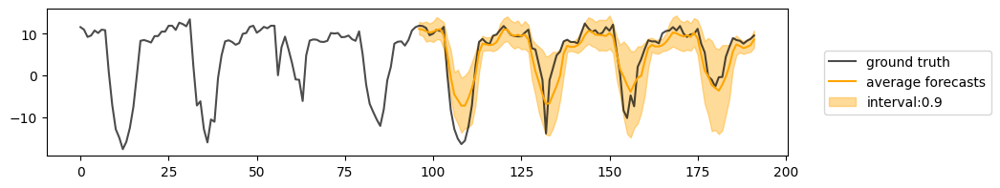

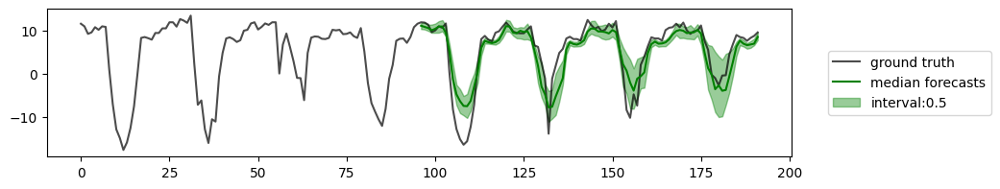

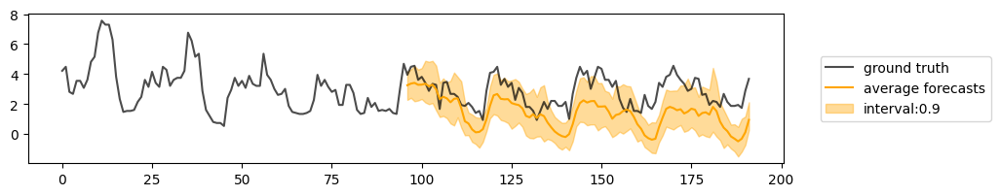

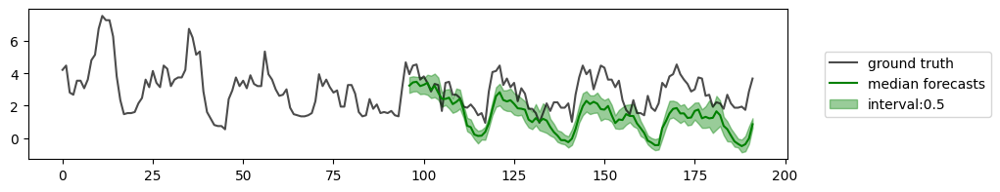

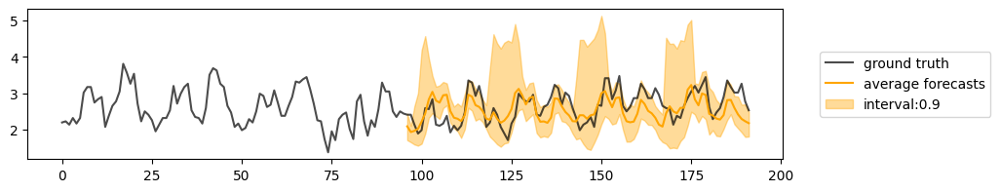

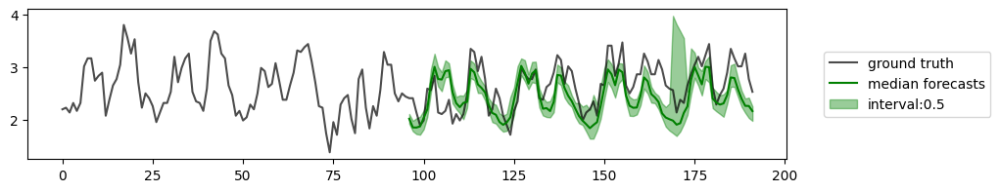

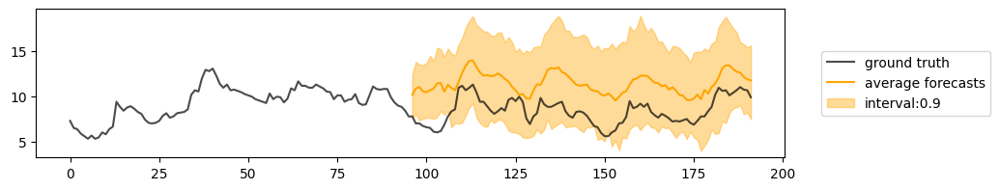

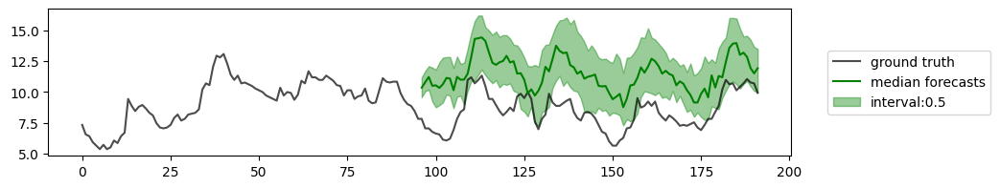

100


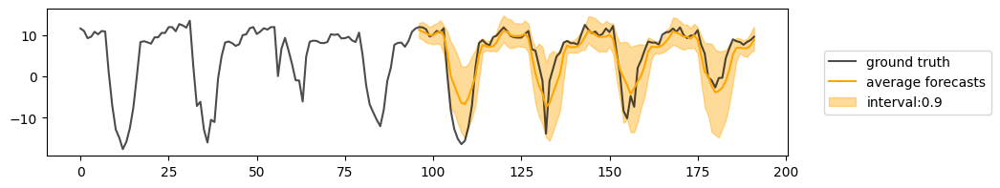

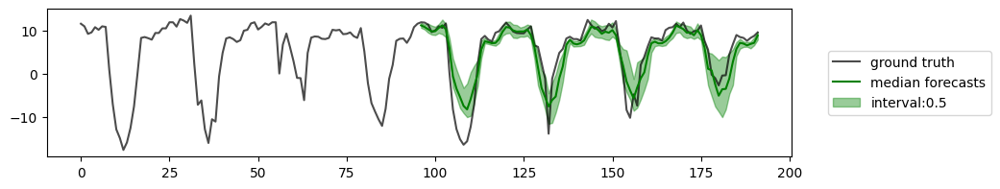

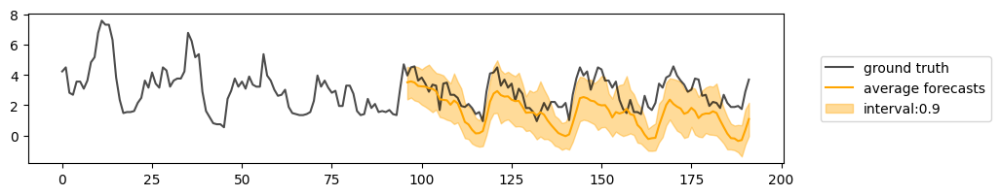

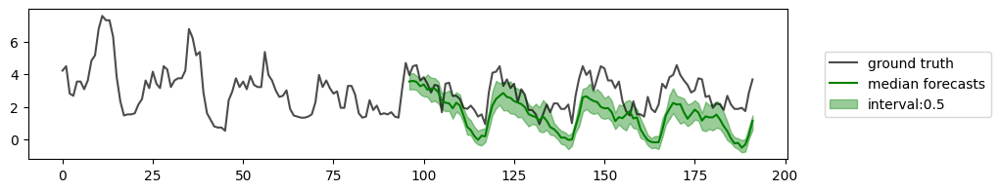

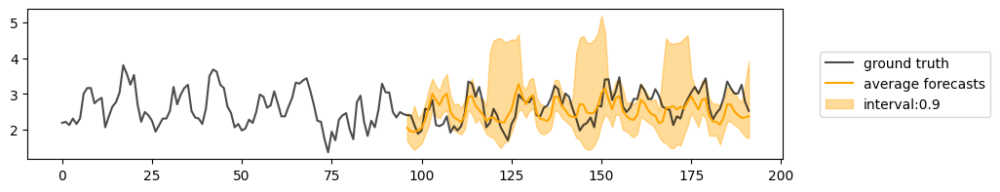

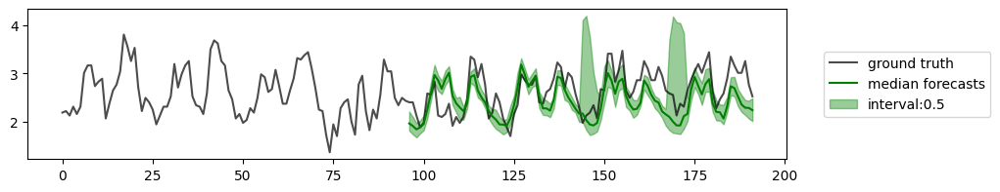

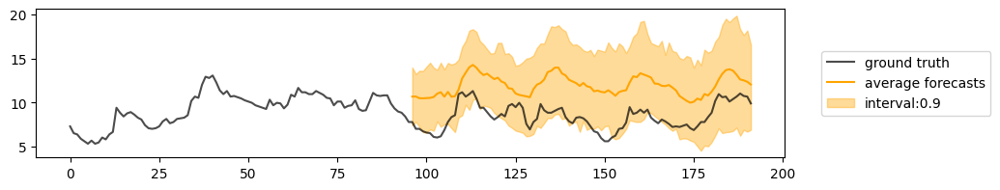

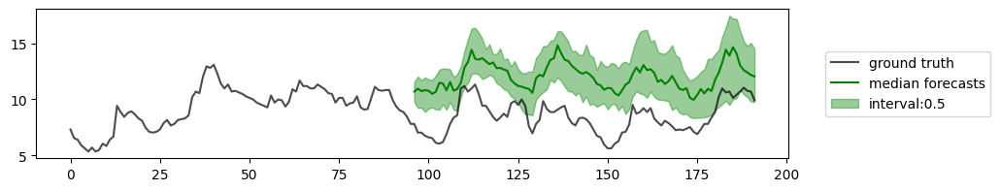

In [96]:
for num_steps in steps:
    print(num_steps)
    model.forecaster.solver_num_steps = num_steps
    forecast_and_visualize(batch, model, num_chan=[0, 1, 4, 6], num_samples=50, batch_idx=4, context_length=96, prediction_length=96)
    plt.show()

### DDIM, linear

10


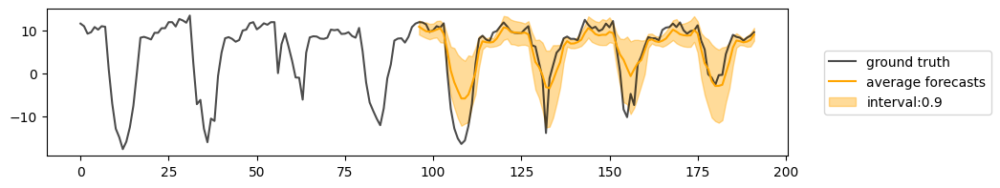

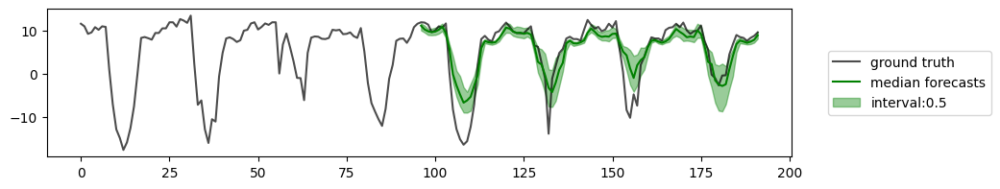

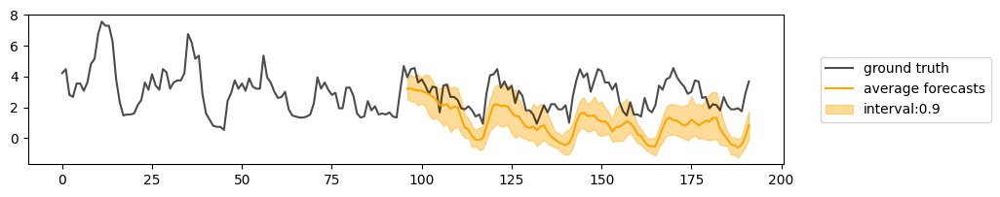

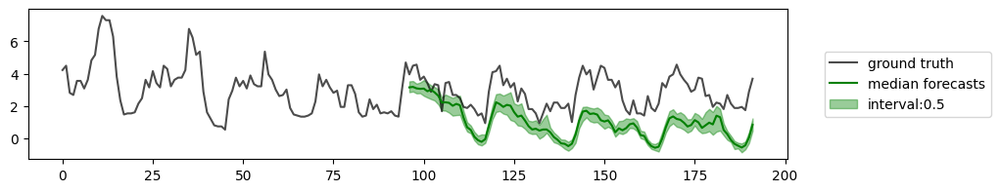

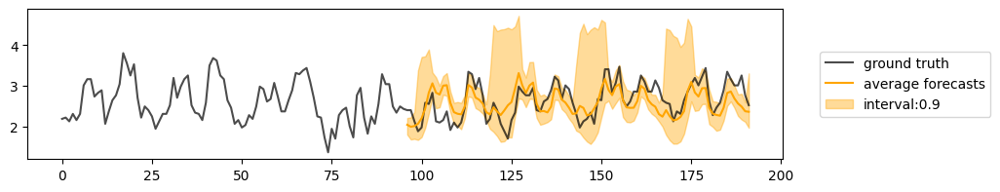

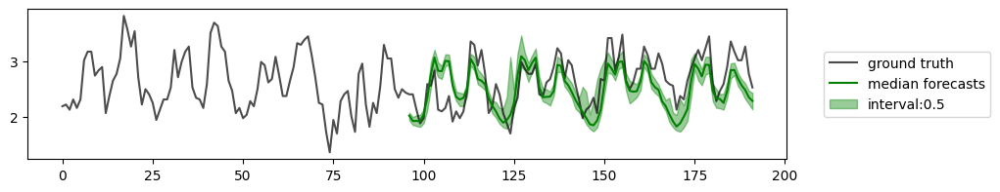

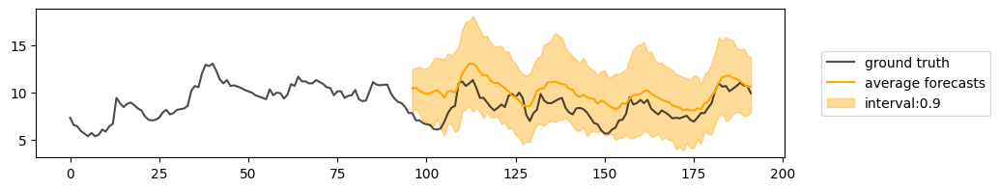

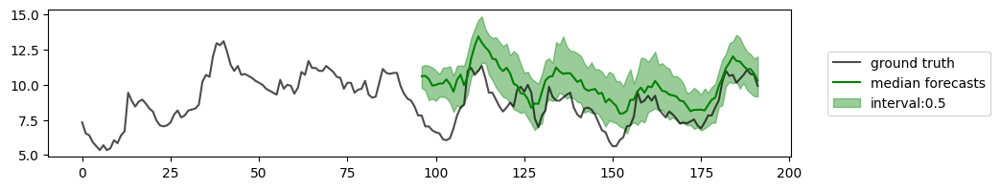

15


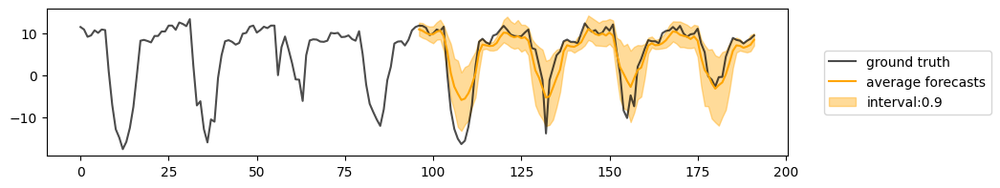

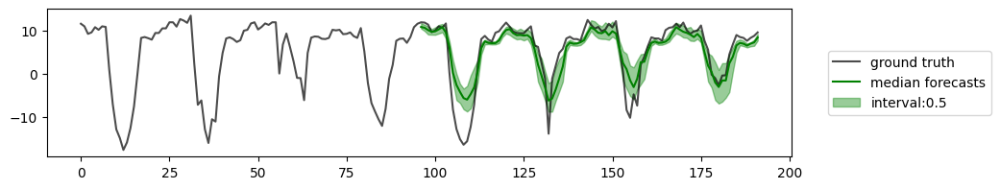

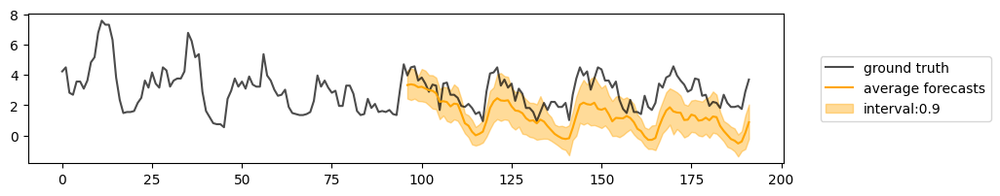

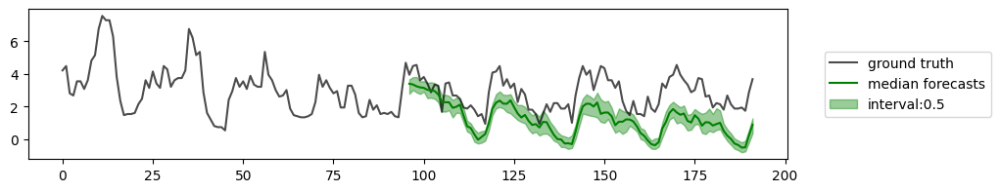

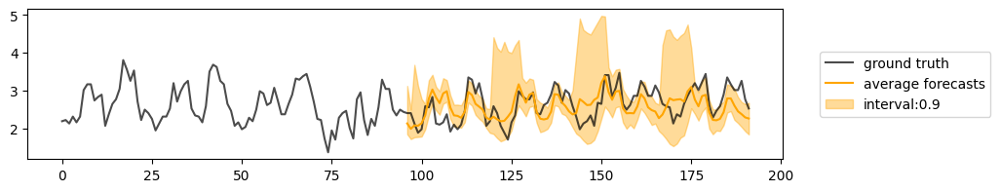

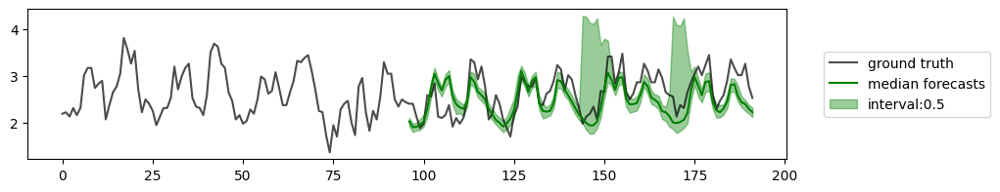

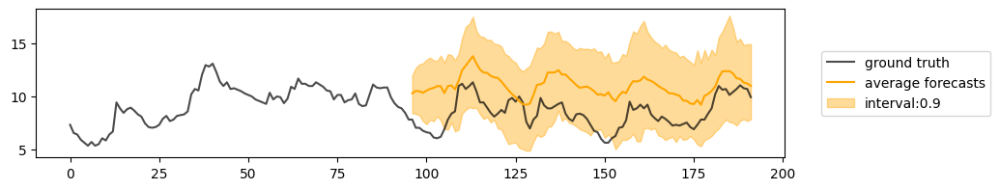

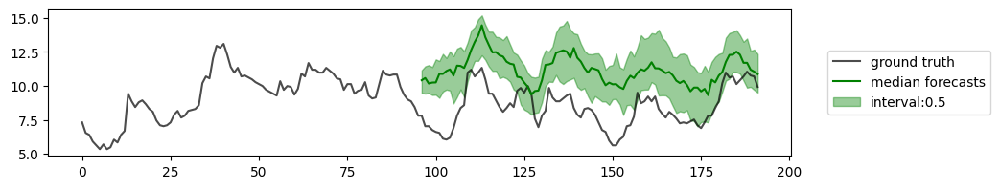

20


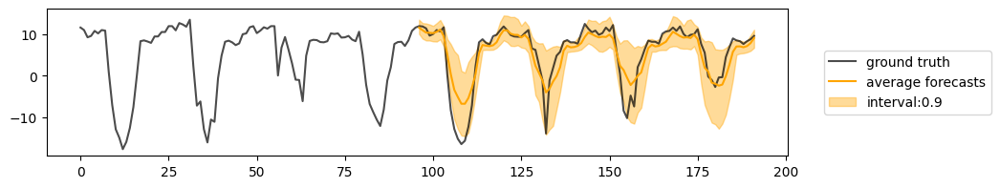

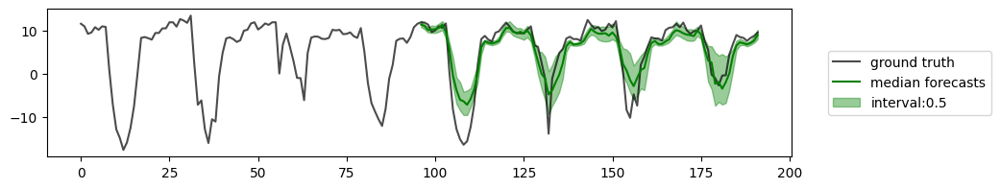

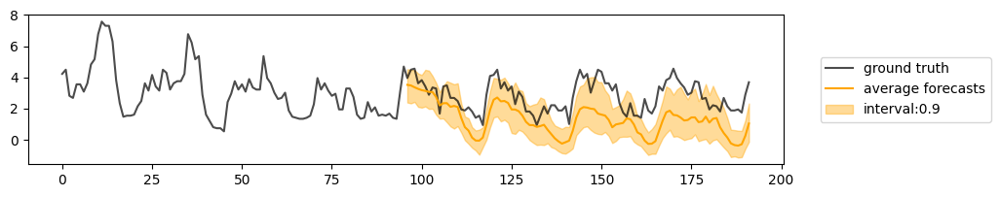

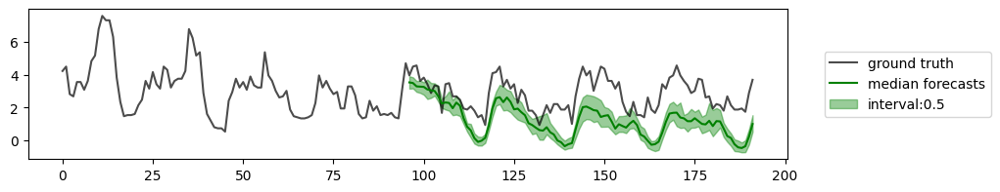

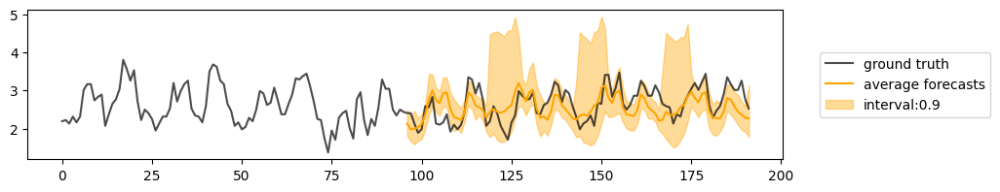

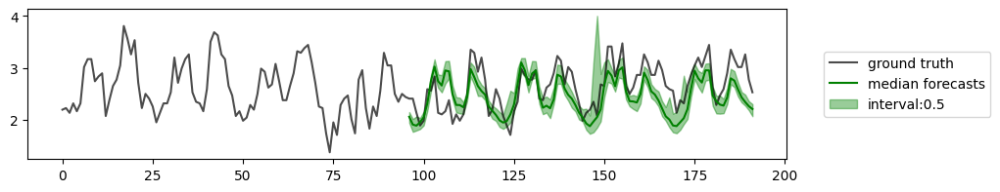

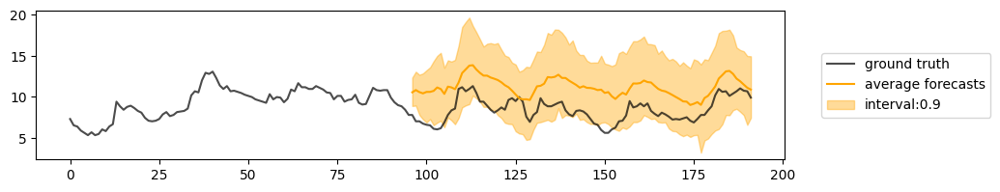

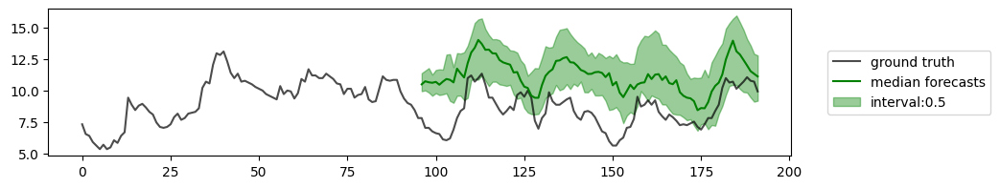

30


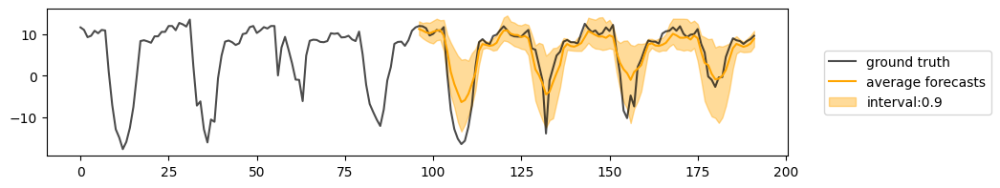

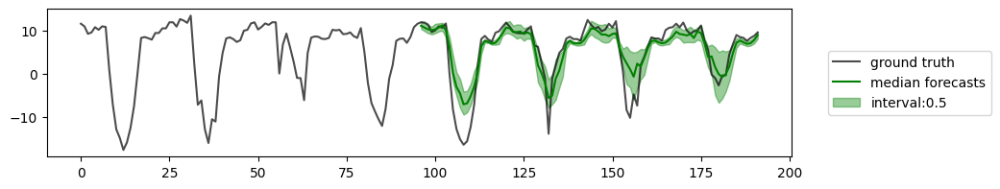

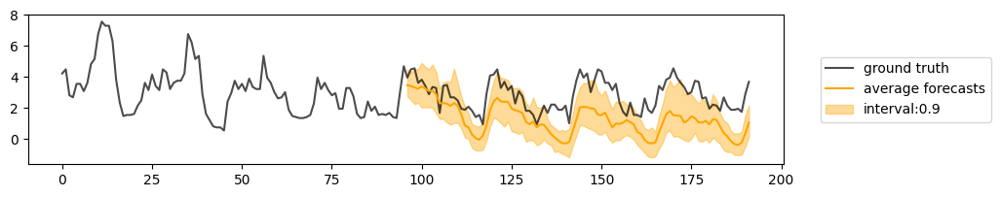

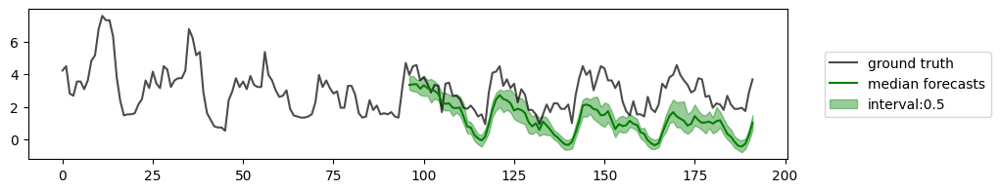

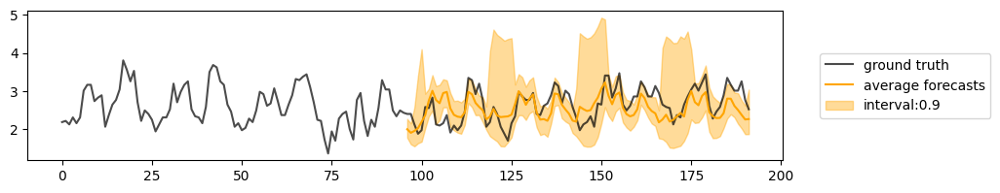

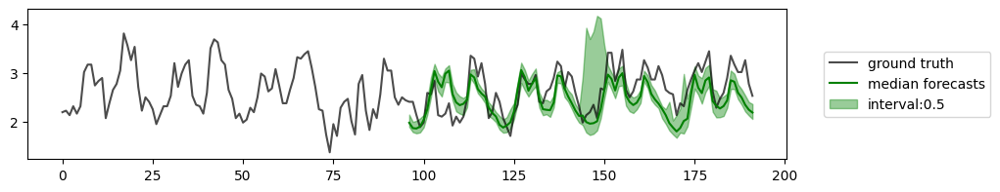

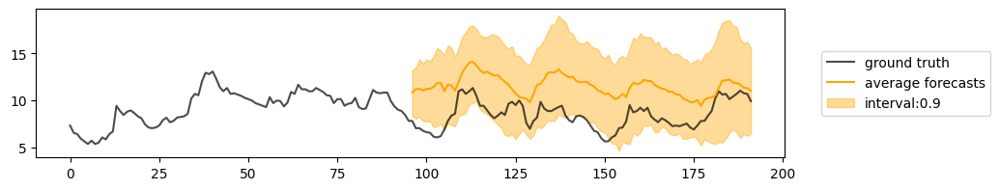

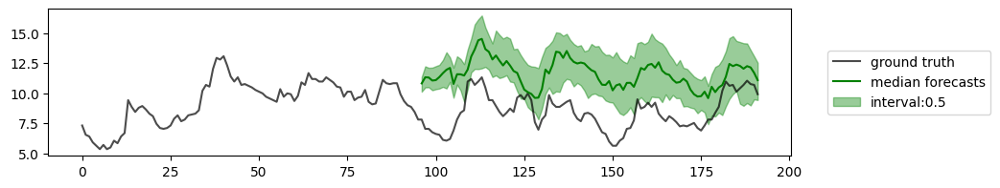

50


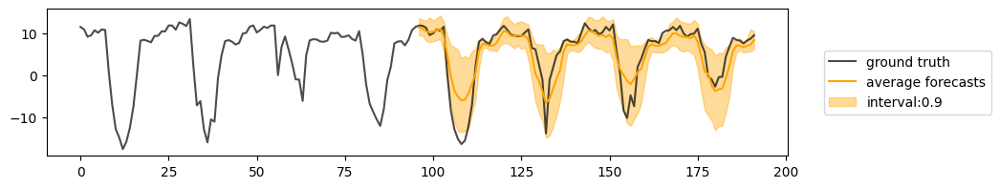

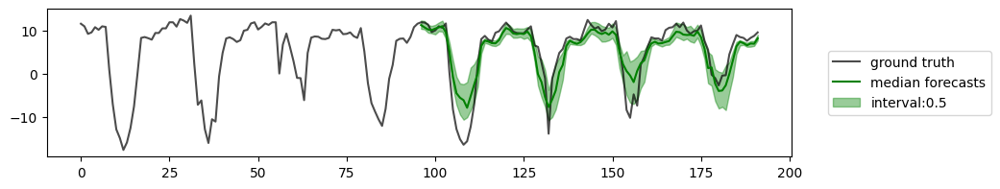

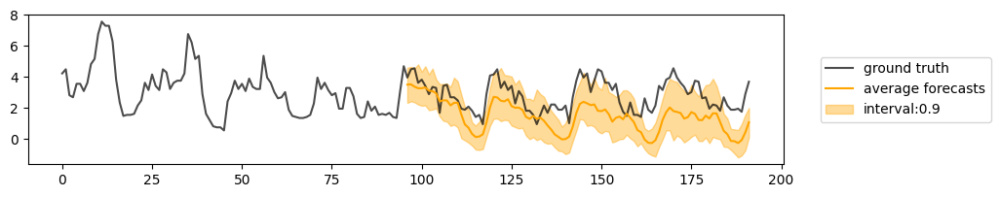

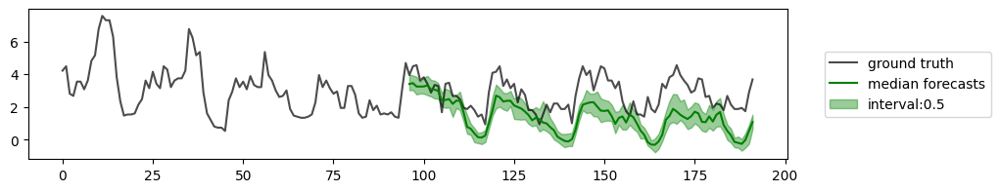

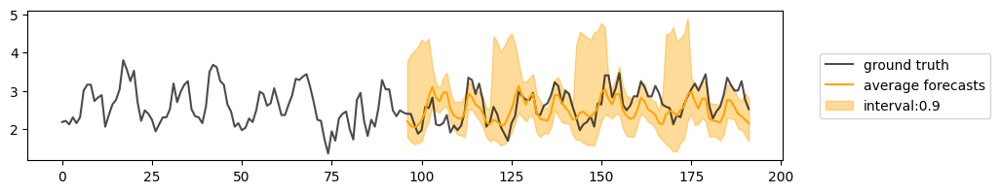

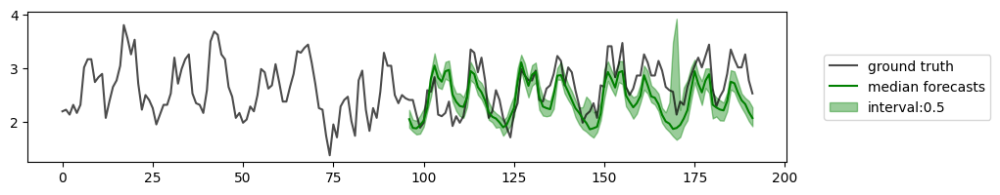

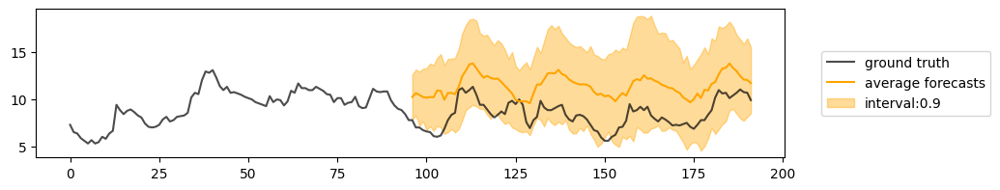

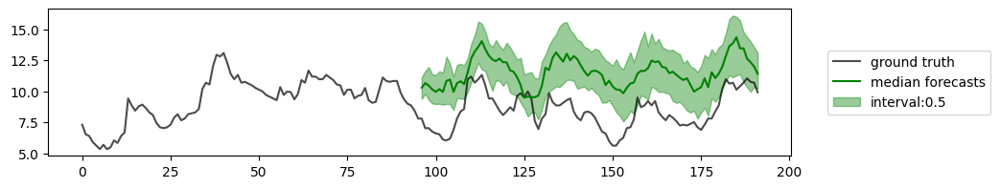

100


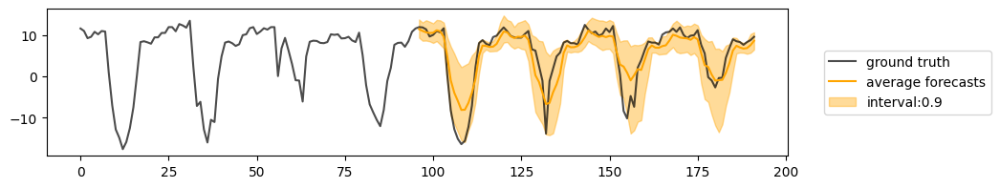

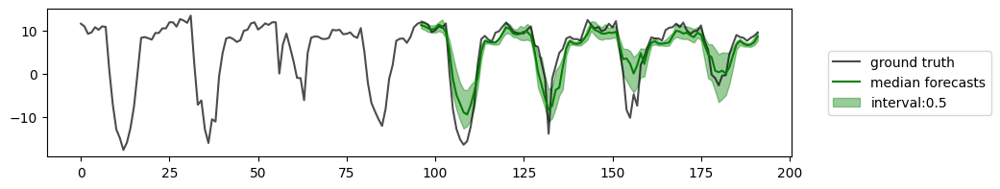

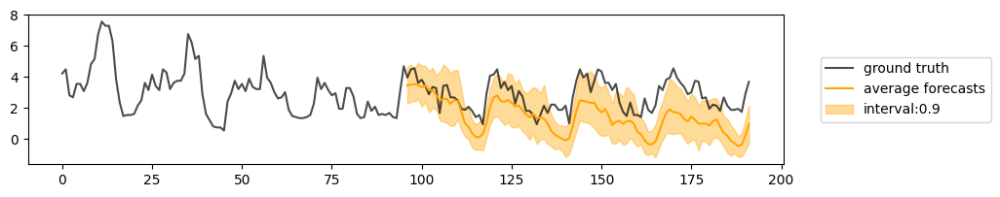

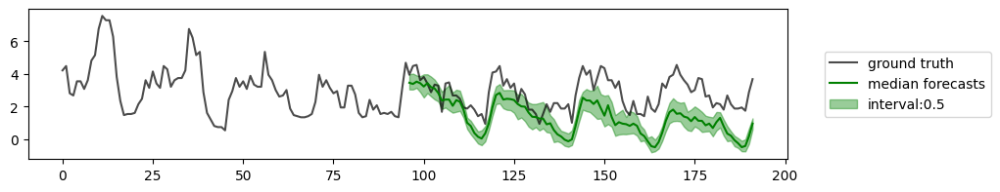

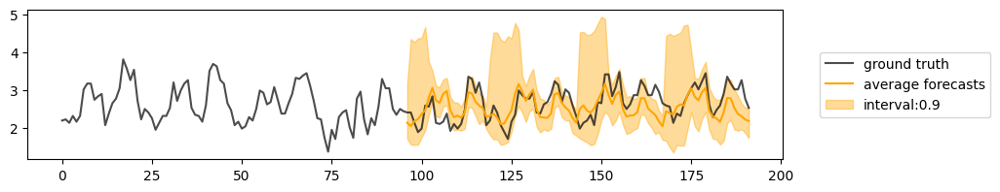

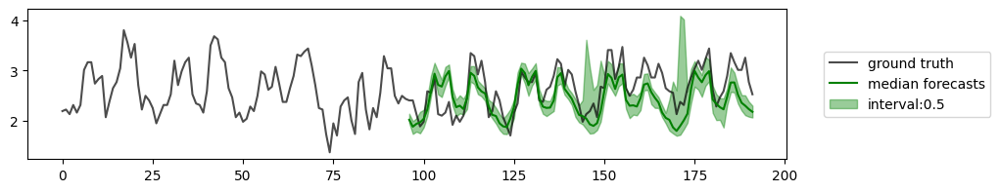

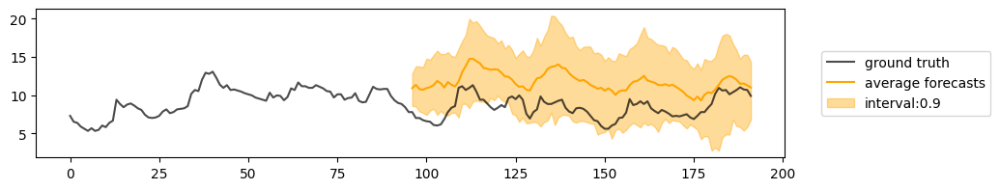

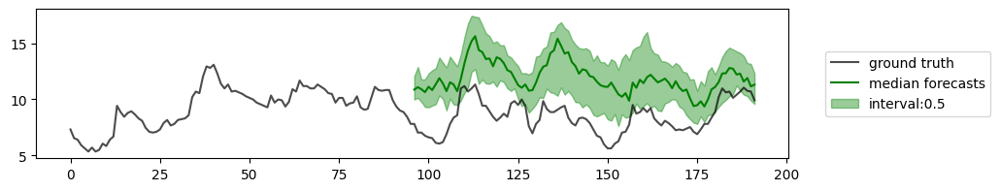

In [98]:
model.forecaster.solver_schedule = 'linear'

for num_steps in steps:
    print(num_steps)
    model.forecaster.solver_num_steps = num_steps
    forecast_and_visualize(batch, model, num_chan=[0, 1, 4, 6], num_samples=50, batch_idx=4, context_length=96, prediction_length=96)
    plt.show()

In [99]:
ddim_linear_metrics = check_metrics_for_samplers(test_dataloader, model, trainer, steps=steps)

  0%|          | 0/6 [00:00<?, ?it/s]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |          | 0/? [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:05<00:27,  5.46s/it]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS          0.41748279333114624
    96_test_CRPS-Sum        0.2656860649585724
      96_test_MASE           3.414703369140625
       96_test_MSE          13.592573165893555
     96_test_MSE-Sum        146.69630432128906
       96_test_ND            0.507303774356842
     96_test_ND-Sum         0.33057793974876404
      96_test_NRMSE         0.7665435671806335
    96_test_NRMSE-Sum       0.4146253168582916
   96_test_weighted_ND       0.507303774356842
 96_test_weighted_ND-Sum    0.33057793974876404
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing: |          | 0/? [00:00<?, ?it/s]

 33%|███▎      | 2/6 [00:11<00:22,  5.54s/it]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS          0.4182644784450531
    96_test_CRPS-Sum        0.24149209260940552
      96_test_MASE           3.614993095397949
       96_test_MSE          13.940461158752441
     96_test_MSE-Sum        136.20481872558594
       96_test_ND            0.519364058971405
     96_test_ND-Sum         0.30429208278656006
      96_test_NRMSE         0.7790284752845764
    96_test_NRMSE-Sum       0.39668625593185425
   96_test_weighted_ND       0.519364058971405
 96_test_weighted_ND-Sum    0.30429208278656006
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing: |          | 0/? [00:00<?, ?it/s]

 50%|█████     | 3/6 [00:16<00:16,  5.62s/it]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS          0.4181378483772278
    96_test_CRPS-Sum        0.23500671982765198
      96_test_MASE           3.701843738555908
       96_test_MSE          14.134532928466797
     96_test_MSE-Sum        134.33810424804688
       96_test_ND           0.5259594917297363
     96_test_ND-Sum         0.29991549253463745
      96_test_NRMSE         0.7869927287101746
    96_test_NRMSE-Sum       0.39440369606018066
   96_test_weighted_ND      0.5259594917297363
 96_test_weighted_ND-Sum    0.29991549253463745
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing: |          | 0/? [00:00<?, ?it/s]

 67%|██████▋   | 4/6 [00:22<00:11,  5.74s/it]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS          0.4165496230125427
    96_test_CRPS-Sum        0.23032821714878082
      96_test_MASE           3.743764638900757
       96_test_MSE          14.275627136230469
     96_test_MSE-Sum        132.17140197753906
       96_test_ND           0.5264174342155457
     96_test_ND-Sum         0.2937168478965759
      96_test_NRMSE         0.7914279699325562
    96_test_NRMSE-Sum       0.39002612233161926
   96_test_weighted_ND      0.5264174342155457
 96_test_weighted_ND-Sum    0.2937168478965759
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing: |          | 0/? [00:00<?, ?it/s]

 83%|████████▎ | 5/6 [00:29<00:06,  6.15s/it]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS          0.41661885380744934
    96_test_CRPS-Sum        0.22899805009365082
      96_test_MASE          3.7847020626068115
       96_test_MSE          14.533836364746094
     96_test_MSE-Sum        133.31675720214844
       96_test_ND           0.5307847261428833
     96_test_ND-Sum         0.2930290997028351
      96_test_NRMSE         0.7985050082206726
    96_test_NRMSE-Sum       0.3913041651248932
   96_test_weighted_ND      0.5307847261428833
 96_test_weighted_ND-Sum    0.2930290997028351
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing: |          | 0/? [00:00<?, ?it/s]

100%|██████████| 6/6 [00:37<00:00,  6.21s/it]

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS          0.4168550968170166
    96_test_CRPS-Sum        0.22748583555221558
      96_test_MASE           3.817282199859619
       96_test_MSE          14.698336601257324
     96_test_MSE-Sum         132.2899627685547
       96_test_ND           0.5342673659324646
     96_test_ND-Sum         0.29168954491615295
      96_test_NRMSE         0.8040086627006531
    96_test_NRMSE-Sum       0.38989949226379395
   96_test_weighted_ND      0.5342673659324646
 96_test_weighted_ND-Sum    0.29168954491615295
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


In [100]:
with open("ddim_linear_metrics.pkl", "wb") as fp:
   pickle.dump(ddim_linear_metrics, fp)

### DPM-Solver-1

In [101]:
model.forecaster.solver = 'dpm1'
model.forecaster.solver_schedule = 'linear'

for batch in test_dataloader:
    break

In [102]:
dpm_time = []
for num_steps in tqdm(steps):
    model.forecaster.solver_num_steps = num_steps
    dpm_time.append(time_for_forecast(batch, model, n_repeats=1))
dpm_time

100%|██████████| 6/6 [00:00<00:00,  6.19it/s]


[0.043869972229003906,
 0.06148266792297363,
 0.08323407173156738,
 0.12696051597595215,
 0.21389317512512207,
 0.43181633949279785]

In [103]:
dpm1_metrics = check_metrics_for_samplers(test_dataloader, model, trainer, steps=steps)

  0%|          | 0/6 [00:00<?, ?it/s]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |          | 0/? [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:05<00:27,  5.49s/it]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS          0.4178948402404785
    96_test_CRPS-Sum        0.2657831907272339
      96_test_MASE          3.4211158752441406
       96_test_MSE          13.585932731628418
     96_test_MSE-Sum        147.02049255371094
       96_test_ND           0.5073496699333191
     96_test_ND-Sum         0.32984182238578796
      96_test_NRMSE         0.7657085657119751
    96_test_NRMSE-Sum       0.4150262773036957
   96_test_weighted_ND      0.5073496699333191
 96_test_weighted_ND-Sum    0.32984182238578796
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing: |          | 0/? [00:00<?, ?it/s]

 33%|███▎      | 2/6 [00:11<00:22,  5.56s/it]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS          0.41749390959739685
    96_test_CRPS-Sum        0.24225115776062012
      96_test_MASE          3.6213221549987793
       96_test_MSE           13.93390941619873
     96_test_MSE-Sum        136.84556579589844
       96_test_ND            0.519095778465271
     96_test_ND-Sum         0.3052936792373657
      96_test_NRMSE         0.7791622877120972
    96_test_NRMSE-Sum       0.39813387393951416
   96_test_weighted_ND       0.519095778465271
 96_test_weighted_ND-Sum    0.3052936792373657
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing: |          | 0/? [00:00<?, ?it/s]

 50%|█████     | 3/6 [00:16<00:16,  5.63s/it]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS          0.41789427399635315
    96_test_CRPS-Sum        0.23552972078323364
      96_test_MASE           3.682997703552246
       96_test_MSE           14.0573091506958
     96_test_MSE-Sum         133.3833770751953
       96_test_ND           0.5230639576911926
     96_test_ND-Sum         0.29918739199638367
      96_test_NRMSE         0.7837570309638977
    96_test_NRMSE-Sum       0.3924567997455597
   96_test_weighted_ND      0.5230639576911926
 96_test_weighted_ND-Sum    0.29918739199638367
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing: |          | 0/? [00:00<?, ?it/s]

 67%|██████▋   | 4/6 [00:22<00:11,  5.76s/it]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS          0.4188230037689209
    96_test_CRPS-Sum        0.23140236735343933
      96_test_MASE          3.7642388343811035
       96_test_MSE           14.40001106262207
     96_test_MSE-Sum        133.31663513183594
       96_test_ND           0.5282356142997742
     96_test_ND-Sum         0.2937765121459961
      96_test_NRMSE         0.7941517233848572
    96_test_NRMSE-Sum       0.3913138210773468
   96_test_weighted_ND      0.5282356142997742
 96_test_weighted_ND-Sum    0.2937765121459961
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing: |          | 0/? [00:00<?, ?it/s]

 83%|████████▎ | 5/6 [00:29<00:05,  5.99s/it]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS          0.41733235120773315
    96_test_CRPS-Sum        0.22880885004997253
      96_test_MASE           3.801449775695801
       96_test_MSE          14.509702682495117
     96_test_MSE-Sum         131.6522216796875
       96_test_ND           0.5325695276260376
     96_test_ND-Sum         0.2932734787464142
      96_test_NRMSE         0.7987199425697327
    96_test_NRMSE-Sum       0.38914117217063904
   96_test_weighted_ND      0.5325695276260376
 96_test_weighted_ND-Sum    0.2932734787464142
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing: |          | 0/? [00:00<?, ?it/s]

100%|██████████| 6/6 [00:36<00:00,  6.13s/it]

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS          0.41648852825164795
    96_test_CRPS-Sum        0.22538027167320251
      96_test_MASE          3.8189151287078857
       96_test_MSE          14.656820297241211
     96_test_MSE-Sum         130.8751983642578
       96_test_ND            0.532896876335144
     96_test_ND-Sum         0.28955405950546265
      96_test_NRMSE         0.8027824759483337
    96_test_NRMSE-Sum       0.38764113187789917
   96_test_weighted_ND       0.532896876335144
 96_test_weighted_ND-Sum    0.28955405950546265
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


In [104]:
with open("dpm1_metrics.pkl", "wb") as fp:
   pickle.dump(dpm1_metrics, fp)

10


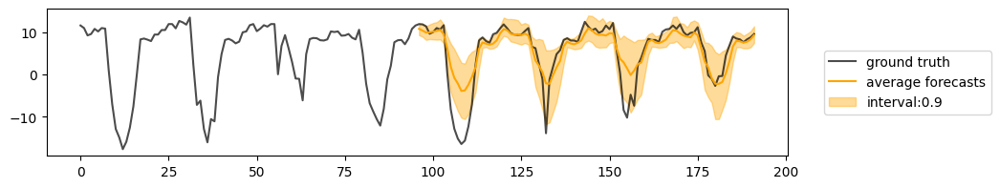

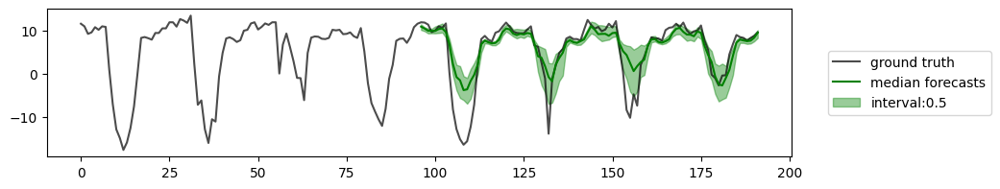

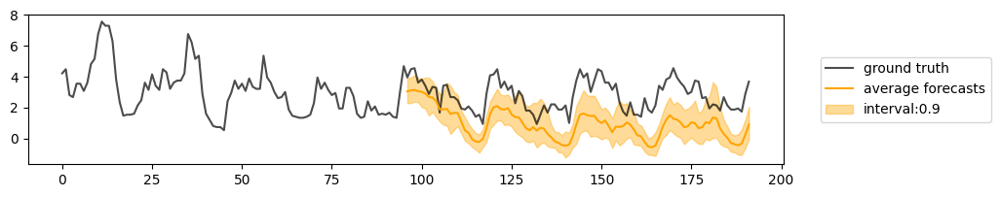

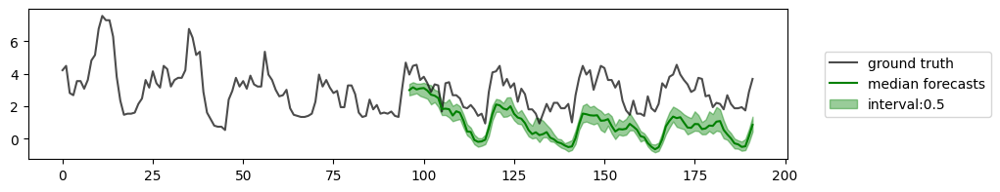

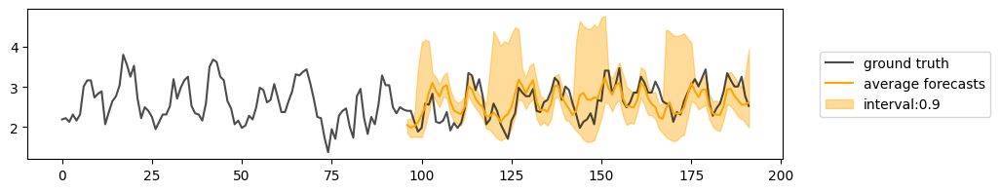

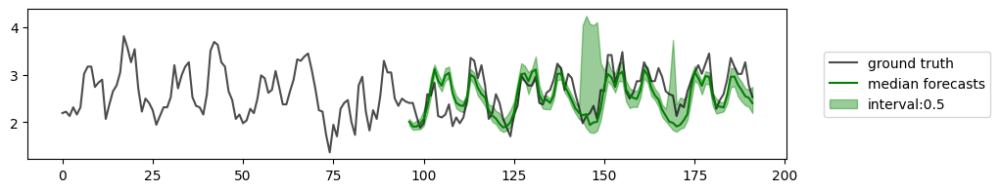

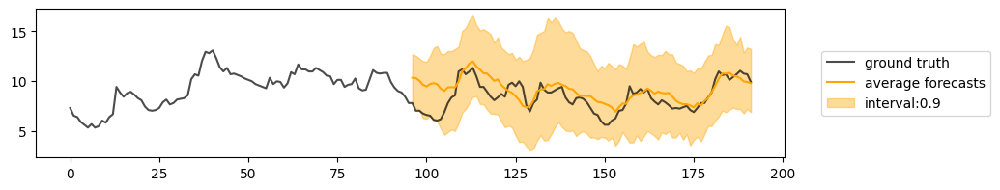

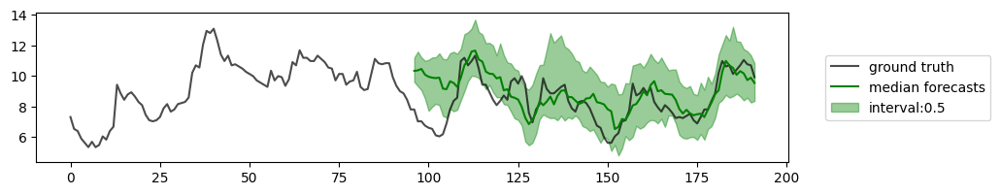

15


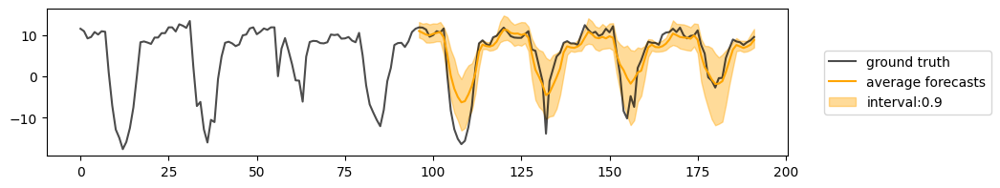

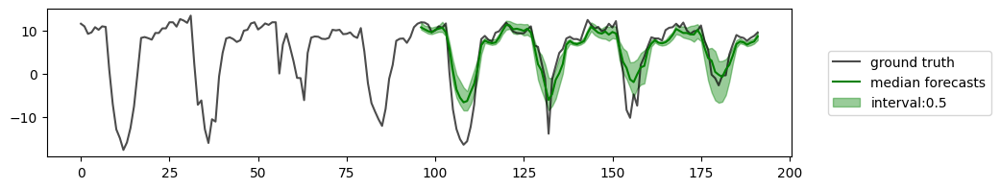

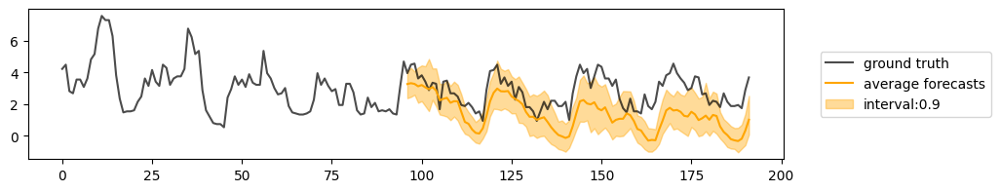

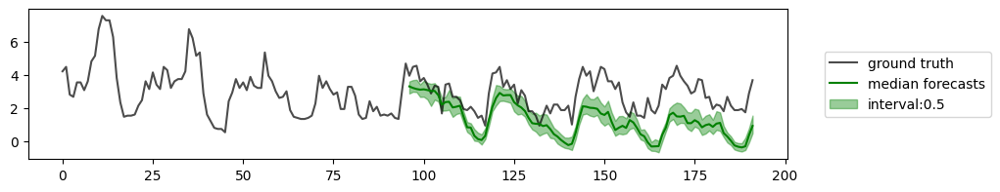

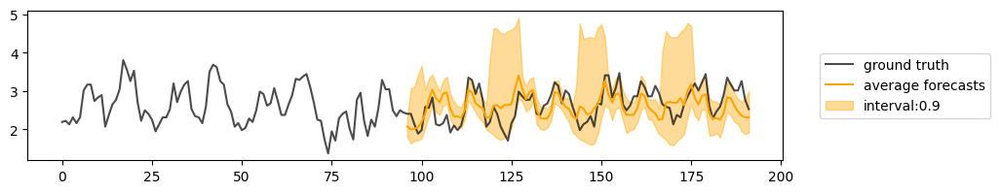

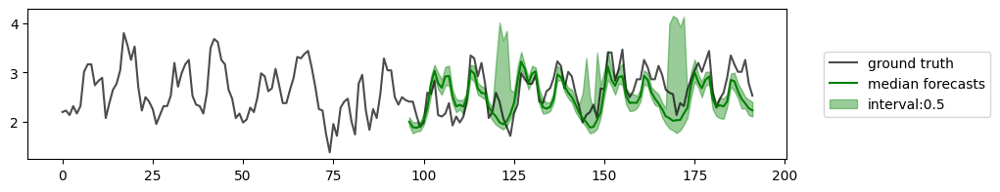

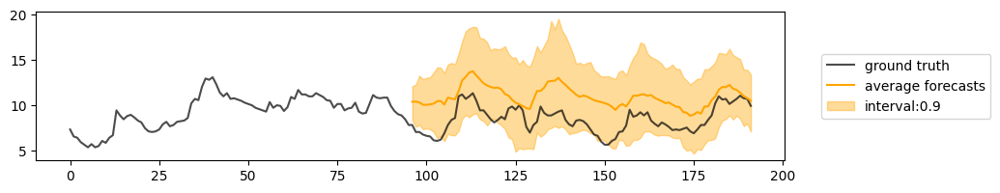

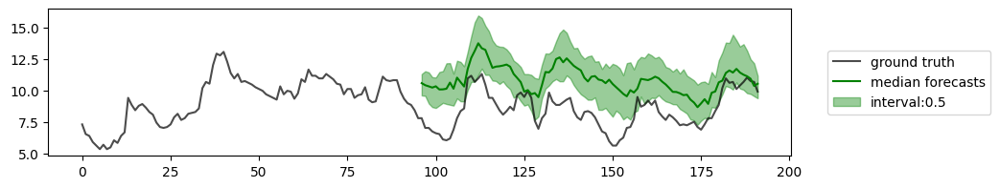

20


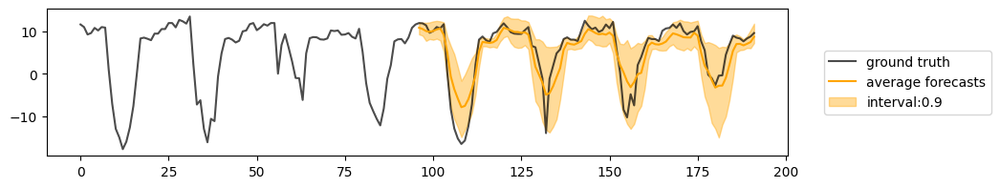

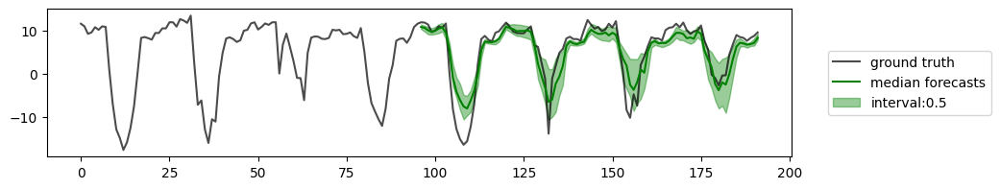

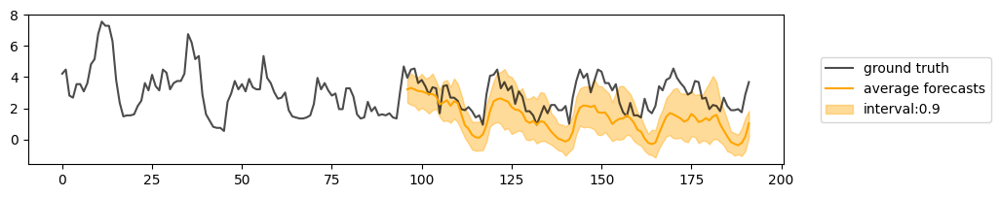

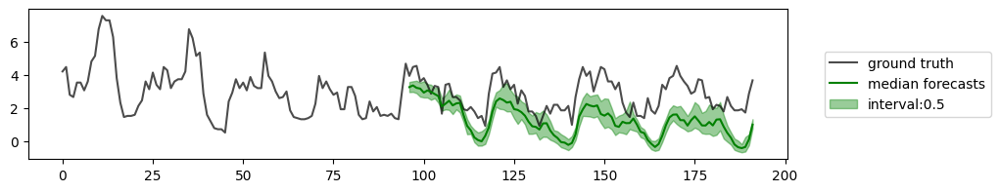

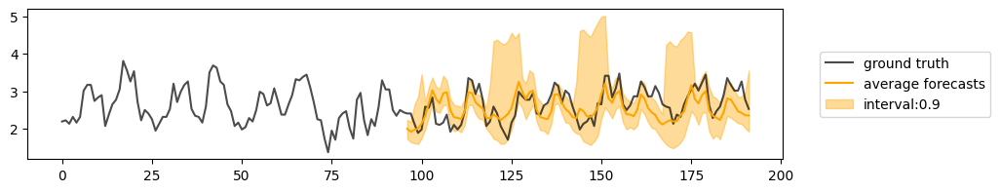

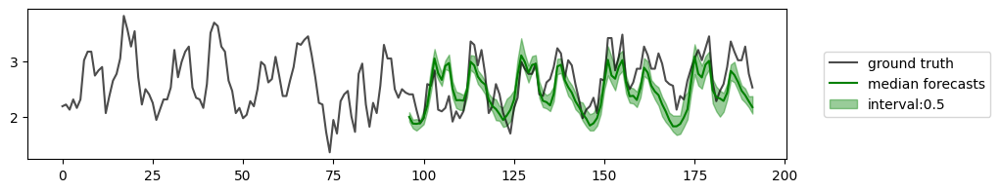

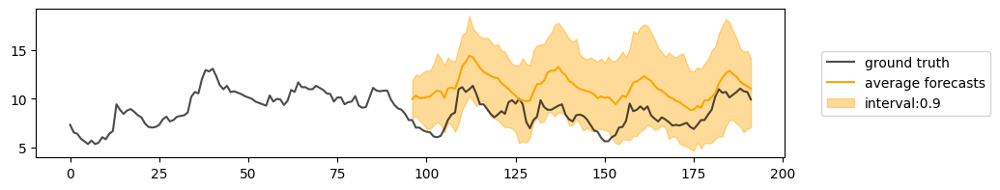

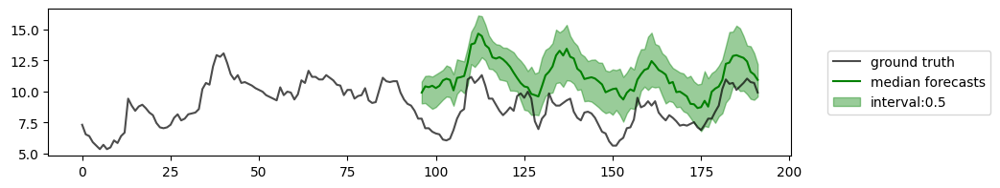

30


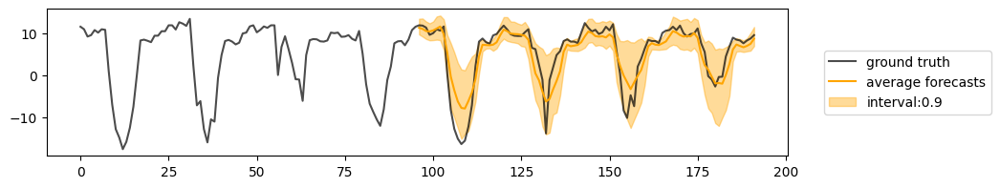

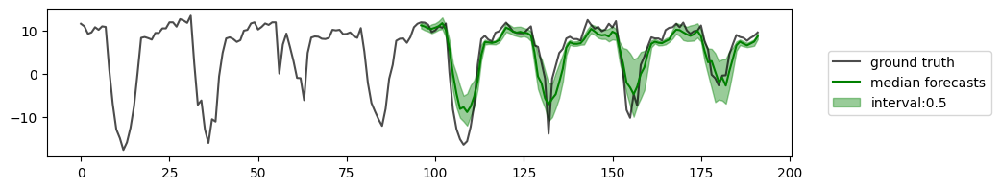

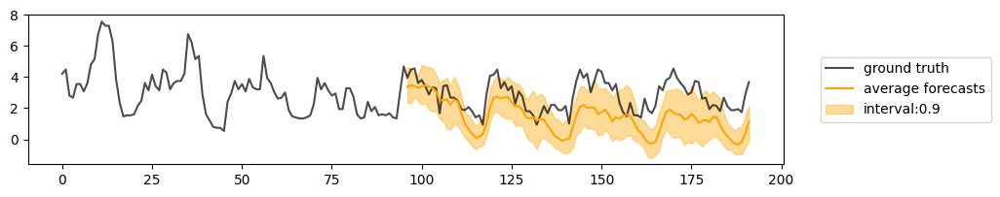

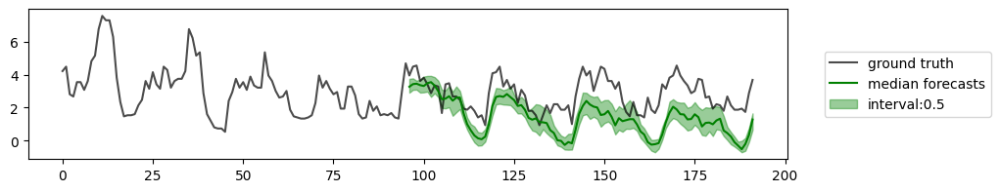

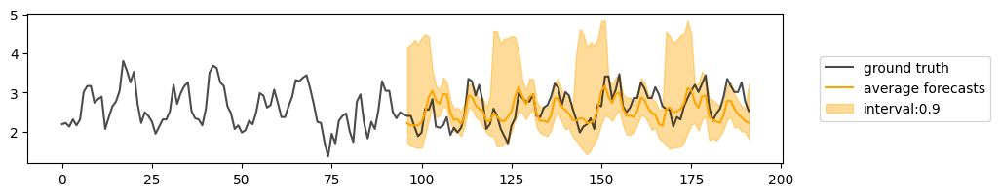

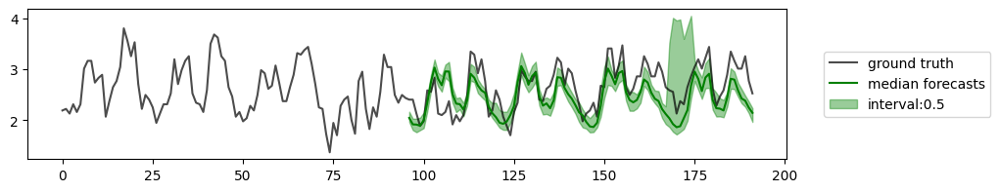

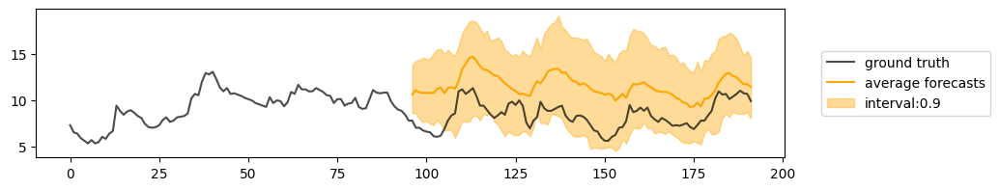

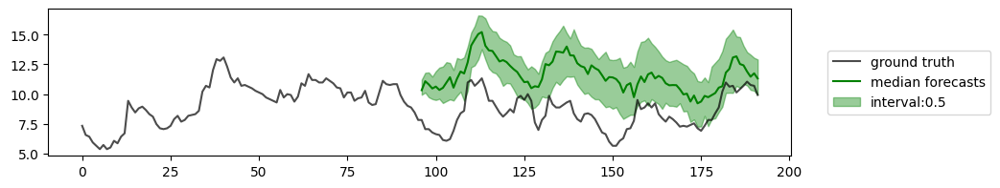

50


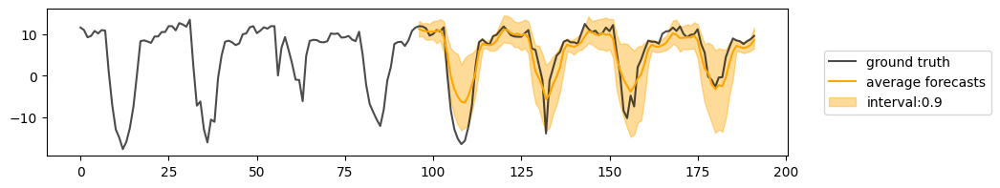

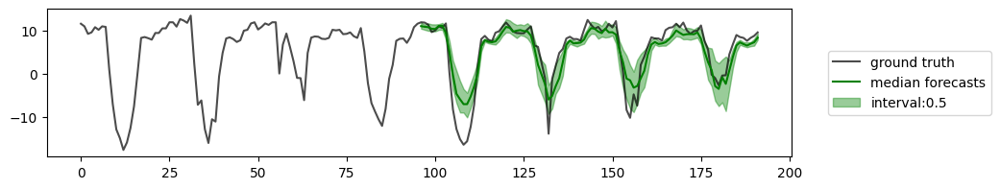

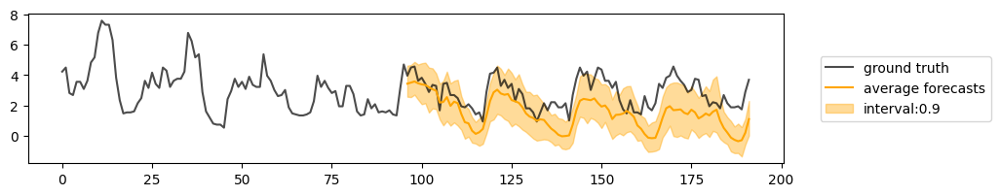

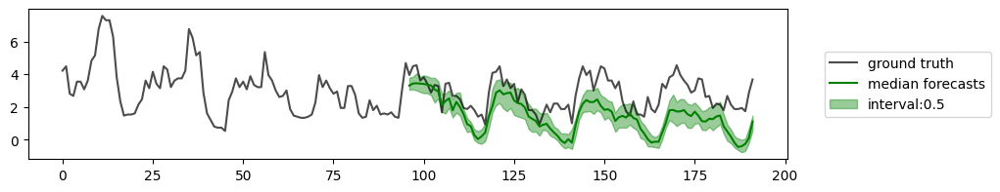

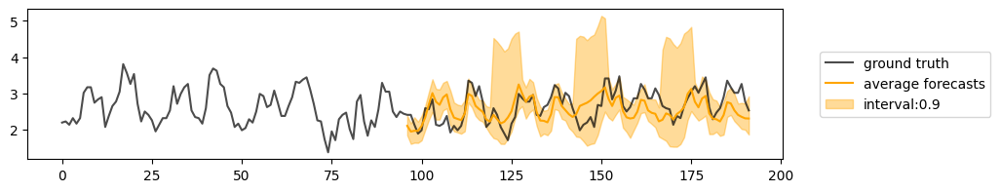

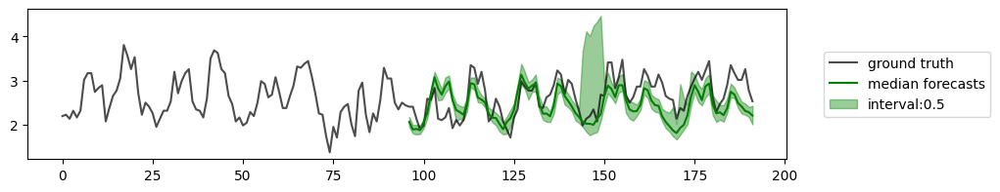

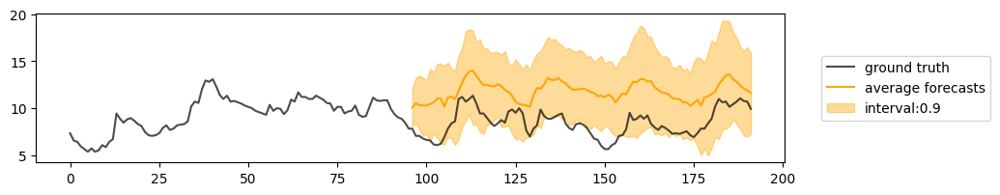

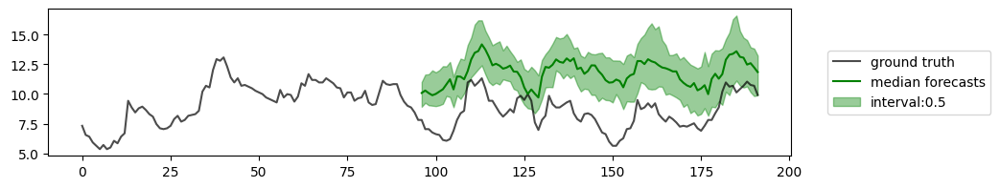

100


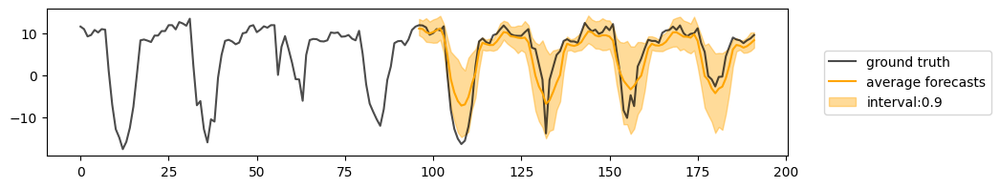

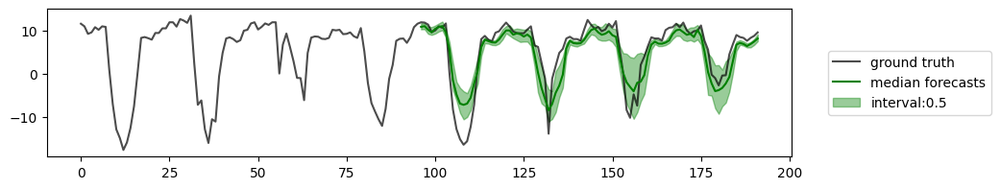

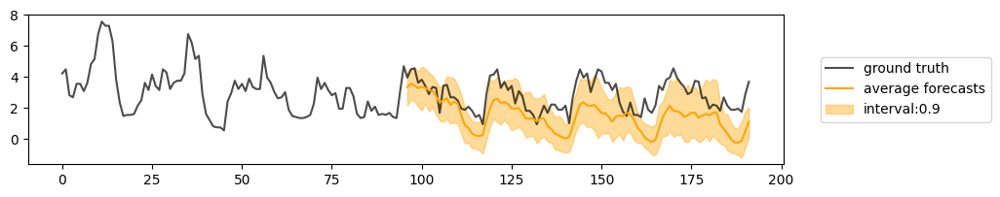

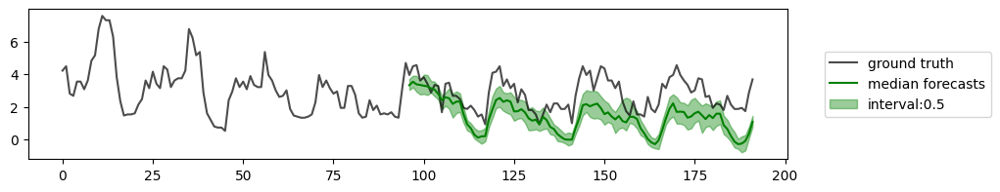

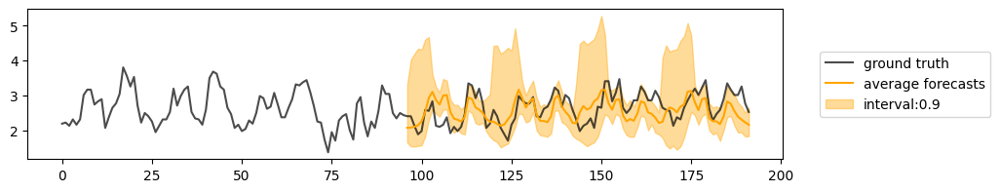

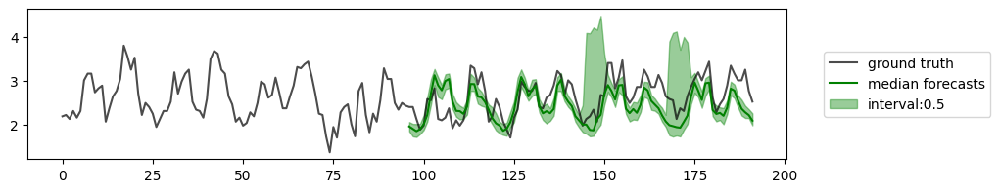

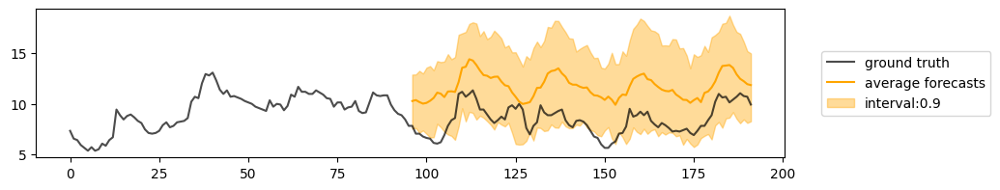

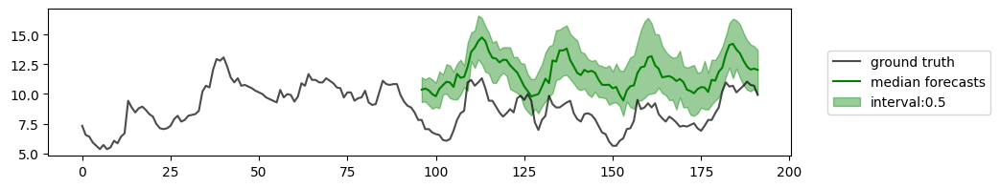

In [105]:
for num_steps in steps:
    print(num_steps)
    model.forecaster.solver_num_steps = num_steps
    forecast_and_visualize(batch, model, num_chan=[0, 1, 4, 6], num_samples=50, batch_idx=4, context_length=96, prediction_length=96)
    plt.show()

### DPM-Solver-2

In [106]:
model.forecaster.solver = 'dpm2'
model.forecaster.solver_schedule = 'linear'
model.scaler = data_manager.scaler
model.forecaster.solver_num_steps = 15

steps = [10, 15, 20, 30, 50, 100]
for batch in test_dataloader:
    break

In [107]:
dpm_time = []
for num_steps in tqdm(steps):
    model.forecaster.solver_num_steps = num_steps // 2
    dpm_time.append(time_for_forecast(batch, model, n_repeats=1))
dpm_time

100%|██████████| 6/6 [00:00<00:00,  6.37it/s]


[0.038242340087890625,
 0.05303955078125,
 0.07992005348205566,
 0.12305021286010742,
 0.21064043045043945,
 0.42955517768859863]

In [108]:
dpm2_metrics = check_metrics_for_samplers(test_dataloader, model, trainer, steps=[step // 2 for step in steps])

  0%|          | 0/6 [00:00<?, ?it/s]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |          | 0/? [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:05<00:27,  5.45s/it]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS           313.9327697753906
    96_test_CRPS-Sum         105.8958511352539
      96_test_MASE           2819.685302734375
       96_test_MSE               4223527.0
     96_test_MSE-Sum             4727846.5
       96_test_ND            314.5672912597656
     96_test_ND-Sum          65.03794860839844
      96_test_NRMSE          444.3923034667969
    96_test_NRMSE-Sum        77.20854949951172
   96_test_weighted_ND       314.5672912597656
 96_test_weighted_ND-Sum     65.03794860839844
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing: |          | 0/? [00:00<?, ?it/s]

 33%|███▎      | 2/6 [00:10<00:22,  5.50s/it]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS          0.9648247361183167
    96_test_CRPS-Sum        0.6335793733596802
      96_test_MASE          10.596211433410645
       96_test_MSE           73.6947250366211
     96_test_MSE-Sum         587.9542236328125
       96_test_ND           1.0933078527450562
     96_test_ND-Sum         0.7383139729499817
      96_test_NRMSE          1.835682988166809
    96_test_NRMSE-Sum       0.8358597159385681
   96_test_weighted_ND      1.0933078527450562
 96_test_weighted_ND-Sum    0.7383139729499817
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing: |          | 0/? [00:00<?, ?it/s]

 50%|█████     | 3/6 [00:16<00:16,  5.59s/it]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS          0.4539319574832916
    96_test_CRPS-Sum        0.23720784485340118
      96_test_MASE           4.475805759429932
       96_test_MSE           20.05356216430664
     96_test_MSE-Sum        150.16815185546875
       96_test_ND            0.590918779373169
     96_test_ND-Sum         0.3095785975456238
      96_test_NRMSE         0.9511423110961914
    96_test_NRMSE-Sum       0.4169987142086029
   96_test_weighted_ND       0.590918779373169
 96_test_weighted_ND-Sum    0.3095785975456238
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing: |          | 0/? [00:00<?, ?it/s]

 67%|██████▋   | 4/6 [00:22<00:11,  5.71s/it]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS          0.41303667426109314
    96_test_CRPS-Sum        0.22084100544452667
      96_test_MASE          3.9886791706085205
       96_test_MSE          15.938166618347168
     96_test_MSE-Sum        133.72804260253906
       96_test_ND           0.5424966812133789
     96_test_ND-Sum         0.2910347580909729
      96_test_NRMSE         0.8414771556854248
    96_test_NRMSE-Sum       0.3914826512336731
   96_test_weighted_ND      0.5424966812133789
 96_test_weighted_ND-Sum    0.2910347580909729
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing: |          | 0/? [00:00<?, ?it/s]

 83%|████████▎ | 5/6 [00:28<00:05,  5.95s/it]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS          0.40532395243644714
    96_test_CRPS-Sum        0.22102026641368866
      96_test_MASE          3.8400275707244873
       96_test_MSE          14.853830337524414
     96_test_MSE-Sum        130.56613159179688
       96_test_ND           0.5307697057723999
     96_test_ND-Sum         0.2878407835960388
      96_test_NRMSE         0.8103696703910828
    96_test_NRMSE-Sum       0.3866729140281677
   96_test_weighted_ND      0.5307697057723999
 96_test_weighted_ND-Sum    0.2878407835960388
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing: |          | 0/? [00:00<?, ?it/s]

100%|██████████| 6/6 [00:36<00:00,  6.08s/it]

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS           0.452670156955719
    96_test_CRPS-Sum        0.24584196507930756
      96_test_MASE           3.765341281890869
       96_test_MSE          14.716686248779297
     96_test_MSE-Sum         133.9922637939453
       96_test_ND           0.5325668454170227
     96_test_ND-Sum         0.2967529892921448
      96_test_NRMSE         0.8055099248886108
    96_test_NRMSE-Sum       0.39221230149269104
   96_test_weighted_ND      0.5325668454170227
 96_test_weighted_ND-Sum    0.2967529892921448
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


In [109]:
import pickle
with open("dpm2_metrics.pkl", "wb") as fp:
   pickle.dump(dpm2_metrics, fp)

10


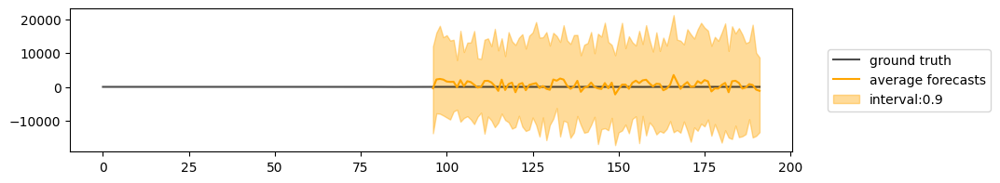

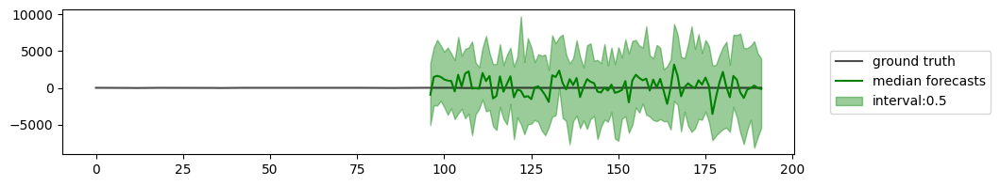

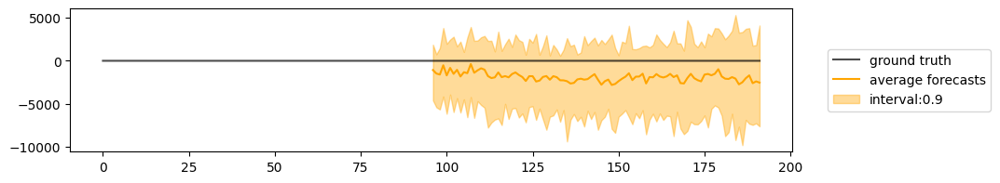

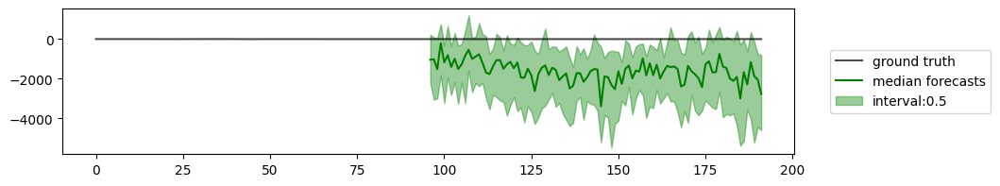

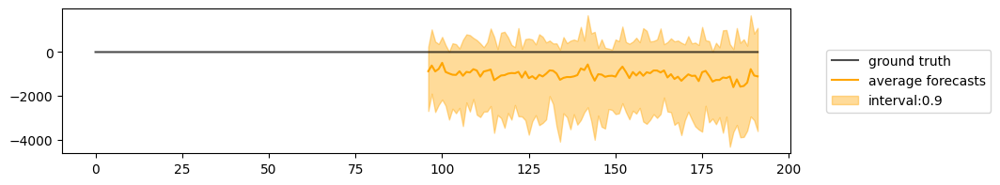

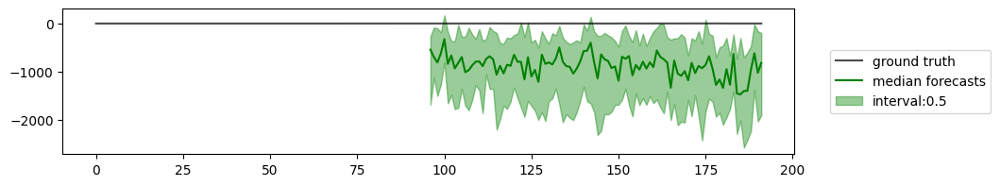

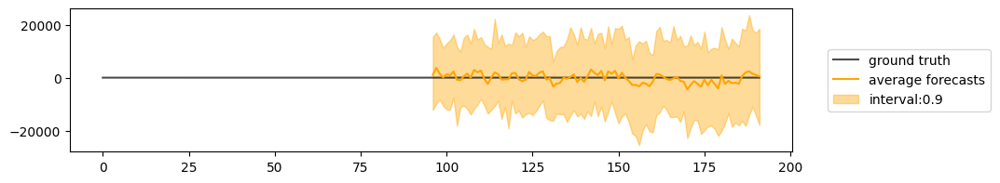

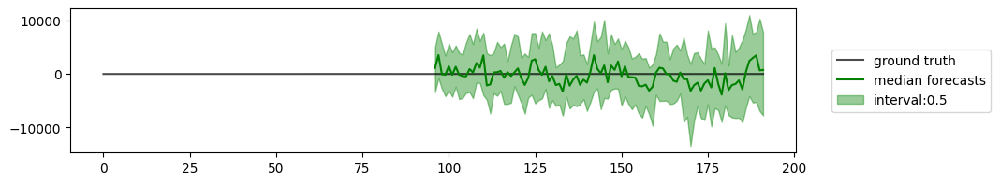

15


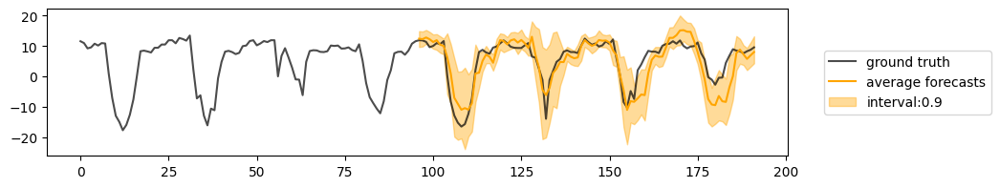

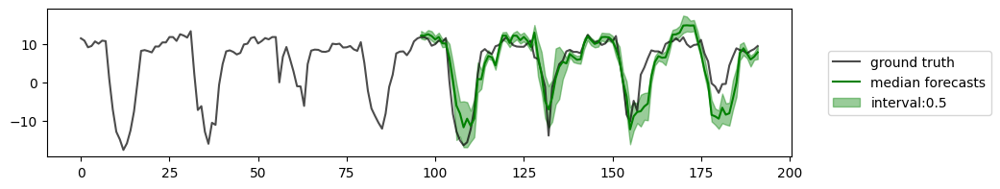

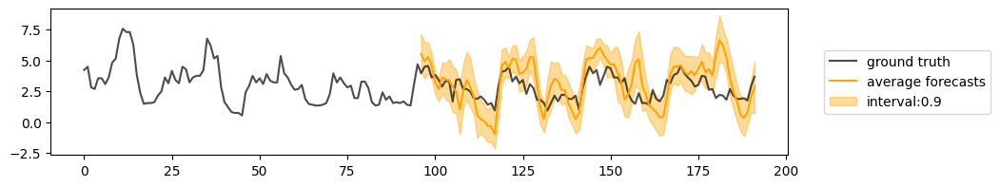

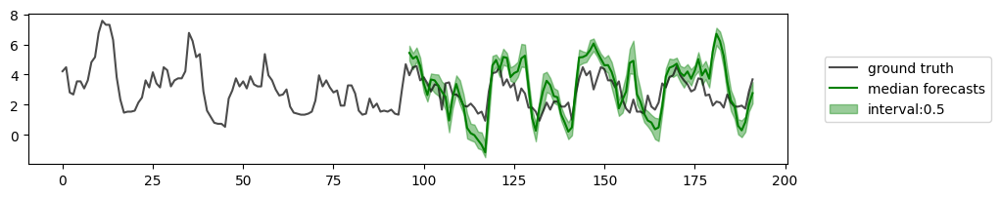

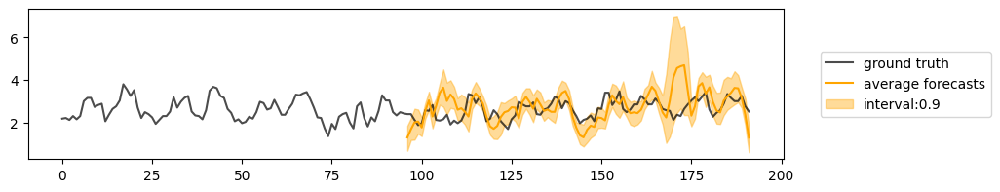

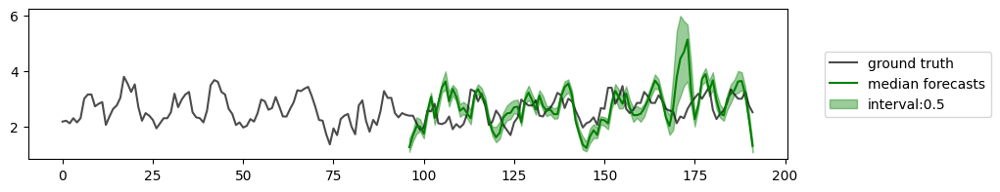

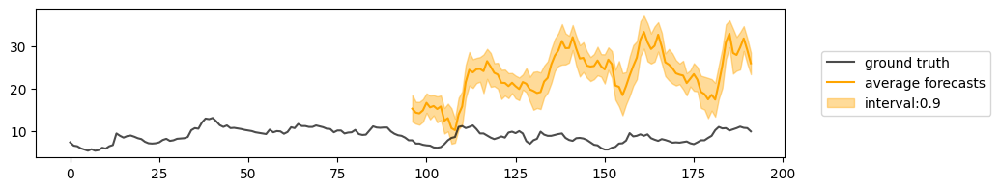

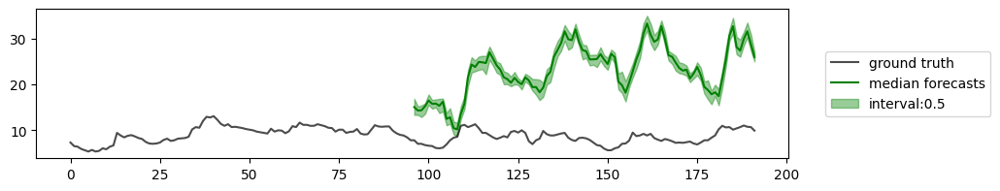

20


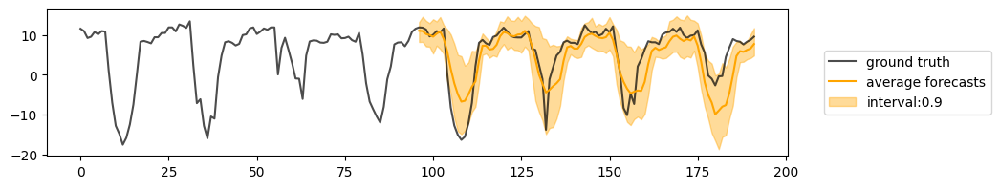

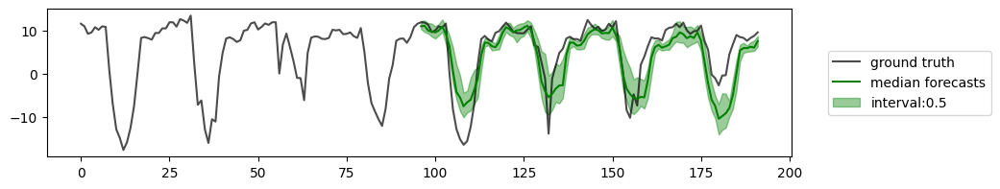

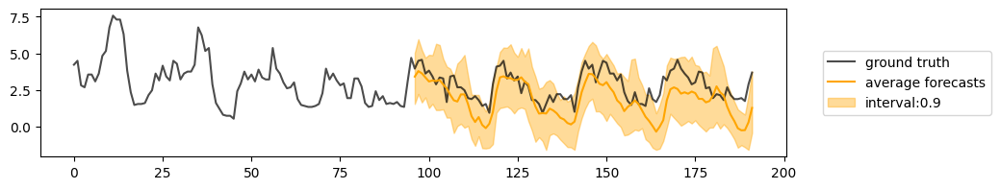

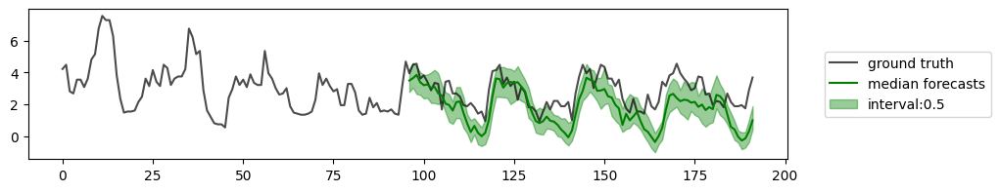

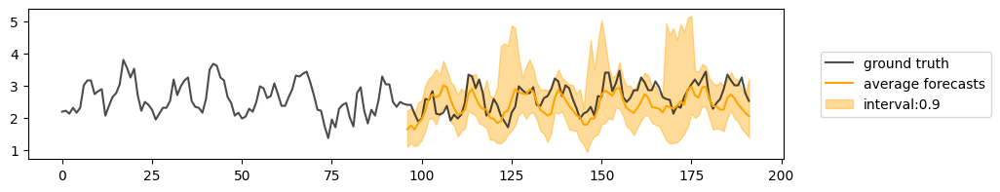

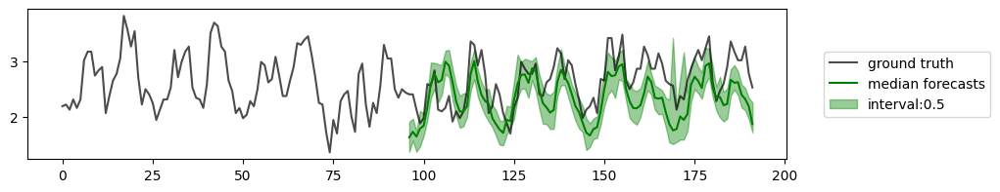

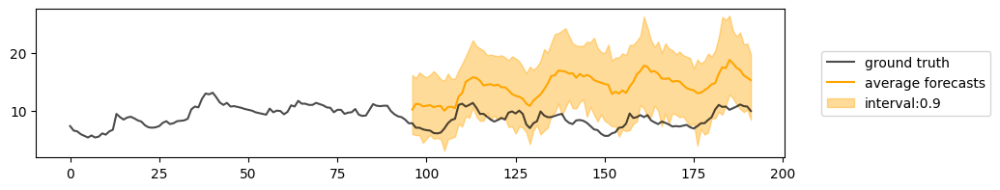

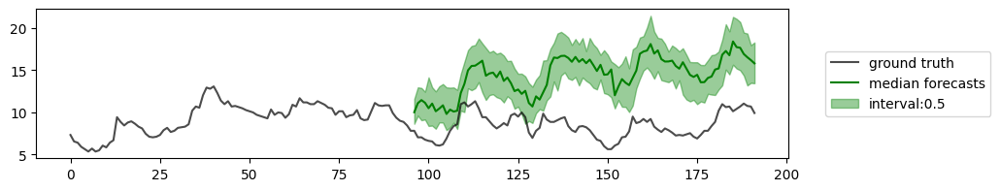

30


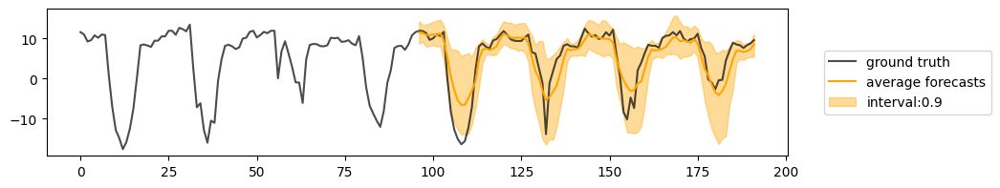

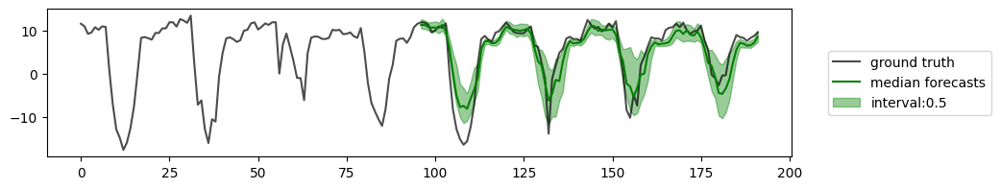

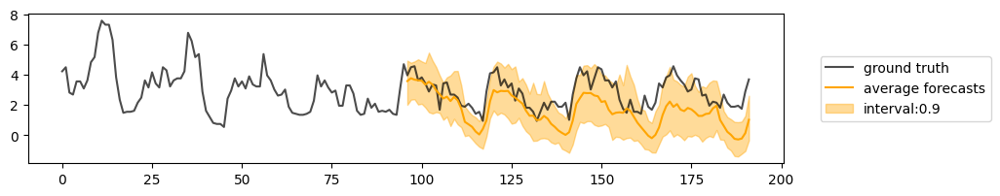

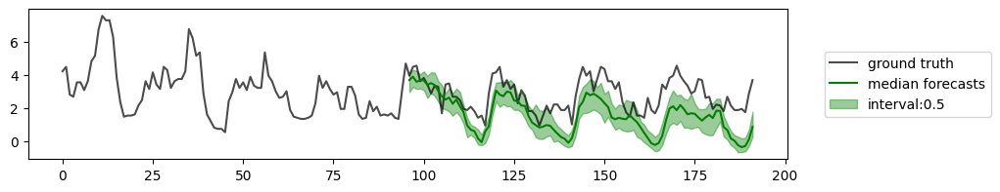

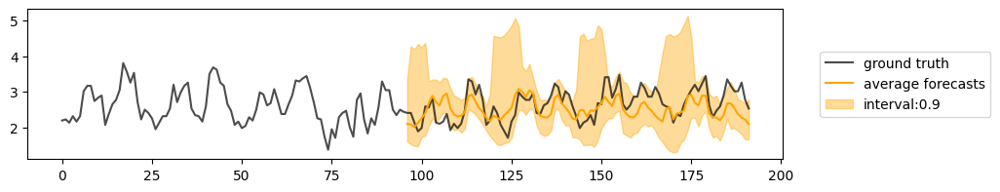

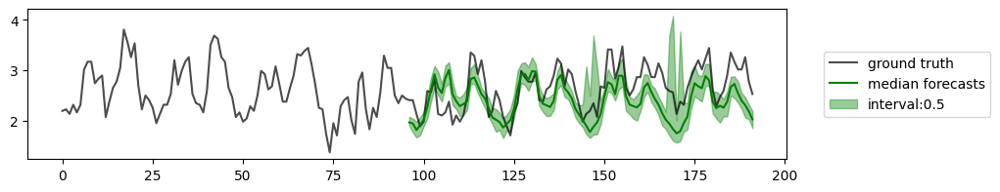

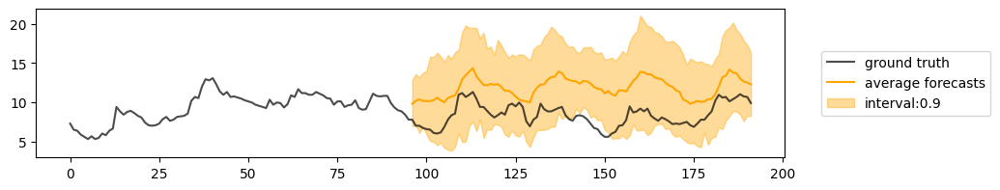

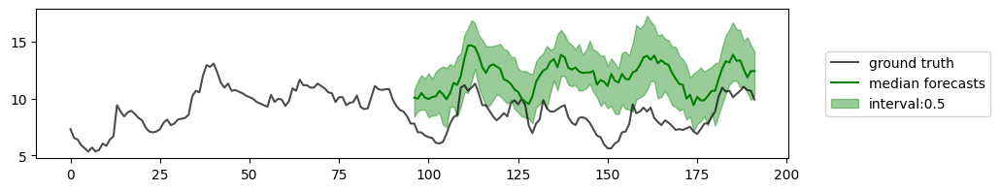

50


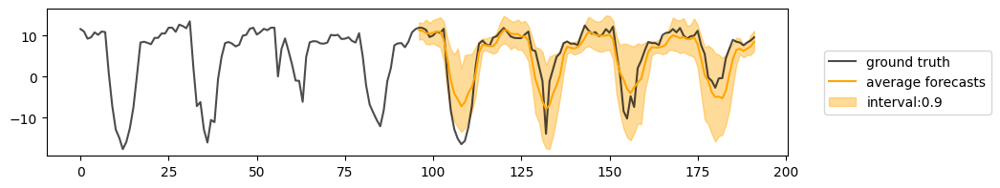

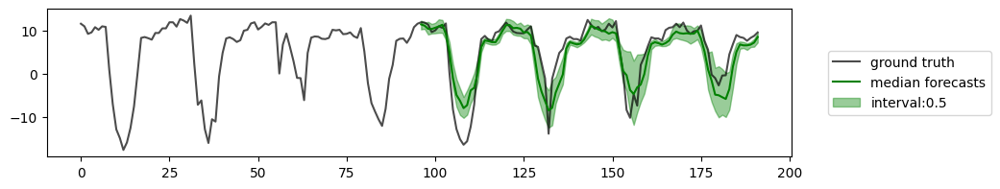

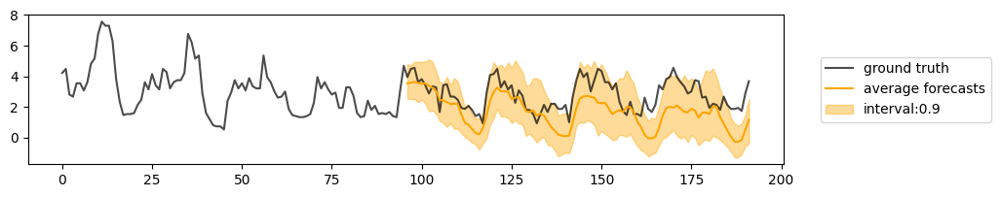

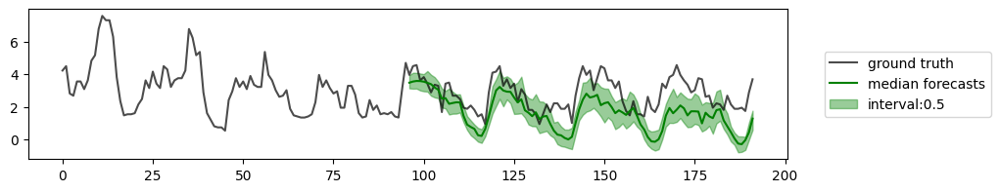

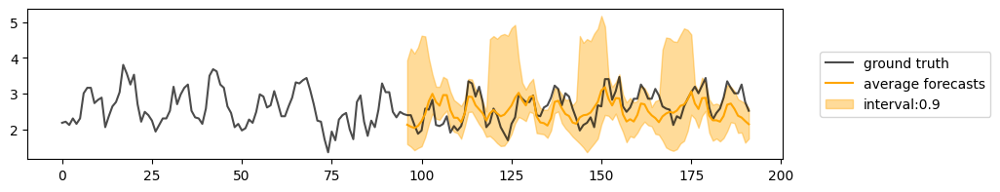

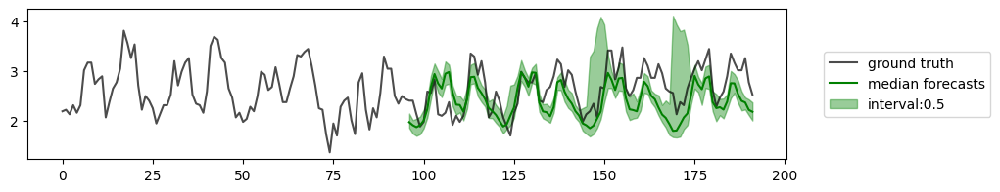

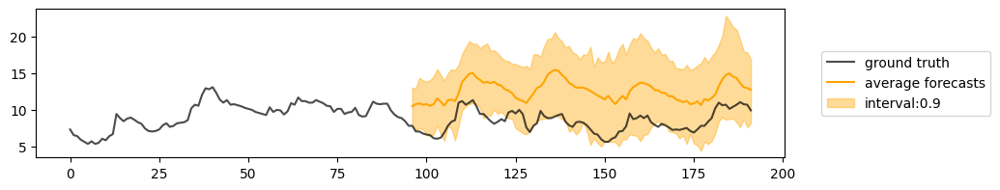

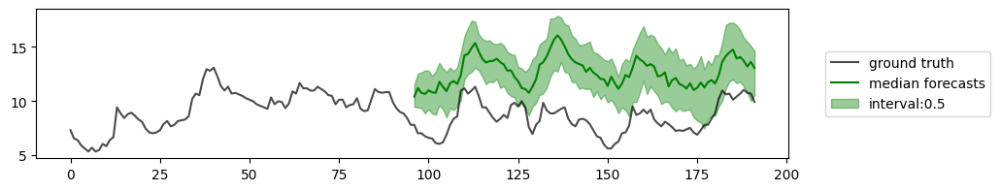

100


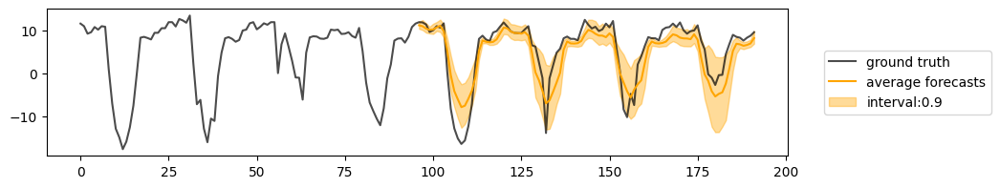

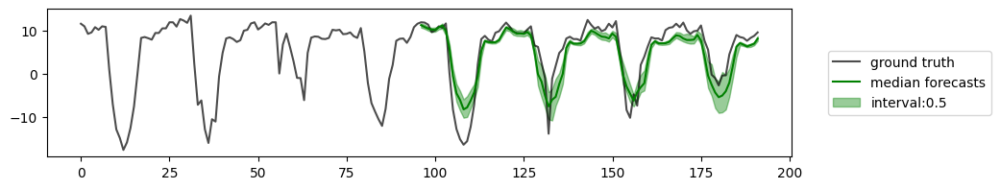

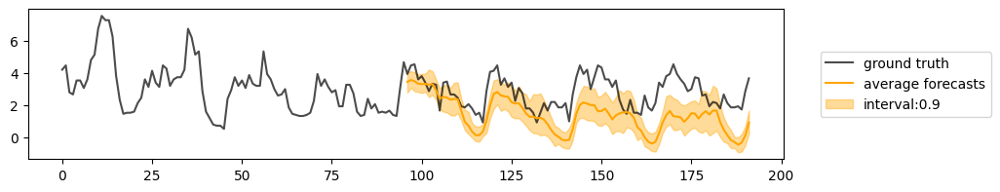

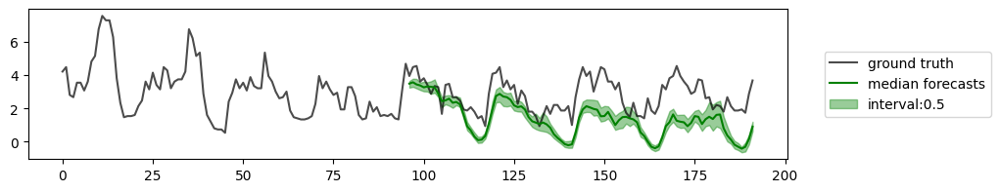

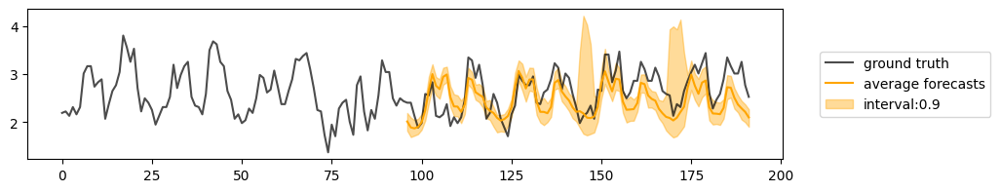

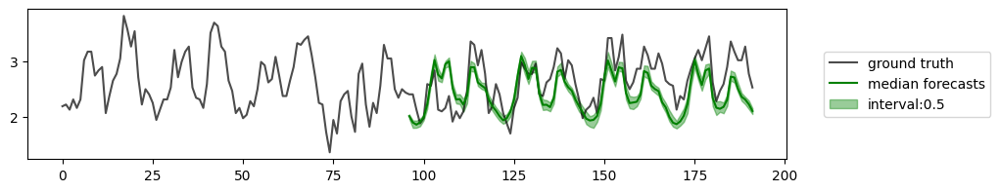

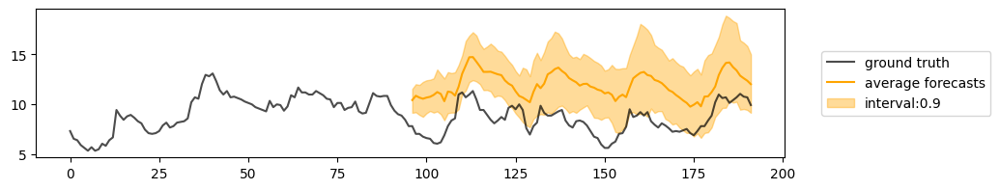

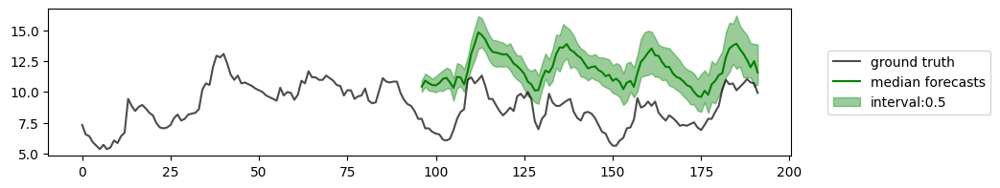

In [111]:
for num_steps in steps:
    print(num_steps)
    model.forecaster.solver_num_steps = num_steps // 2
    forecast_and_visualize(batch, model, num_chan=[0, 1, 4, 6], num_samples=50, batch_idx=4, context_length=96, prediction_length=96)
    plt.show()

### Plot results

In [112]:
import pickle
import os

metrics = {}
samplers_name = ['DDIM, linear', 'DDIM, quad', 'DPM-Solver-1', 'DPM-Solver-2', 'Euler', 'Heun']
for i, file in enumerate(sorted(os.listdir("samplers_res/"))):
    with open(f"samplers_res/{file}", "rb") as fp:
        metrics[samplers_name[i]] = pickle.load(fp)

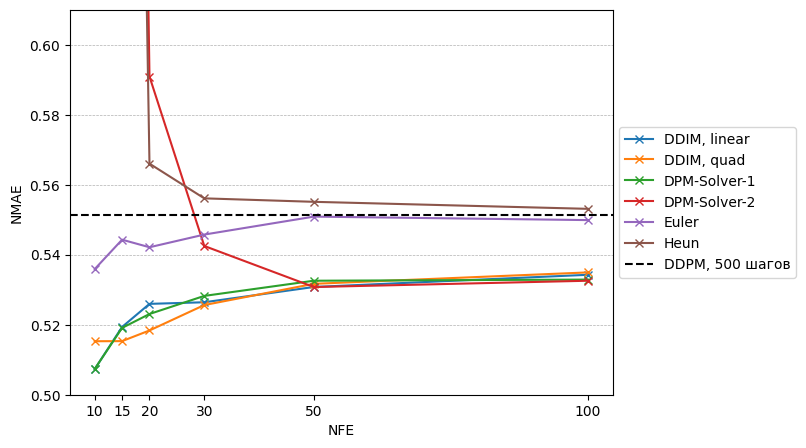

In [116]:
import matplotlib.pyplot as plt
import numpy as np

nfe = [10, 15, 20, 30, 50, 100]
plt.figure(figsize=(7, 5))

for sampler in metrics:
    runs = metrics[sampler]
    nmae = [run['96_test_ND'] for run in runs]
    plt.plot(nfe, nmae, marker='x', linestyle='-', label=sampler)
    
plt.axhline(y=0.5514733195304871 , linestyle='--', label='DDPM, 500 шагов', c='black')

plt.xlabel('NFE')
plt.xticks(nfe)
plt.ylabel('NMAE')
plt.ylim(0.5, 0.61)
plt.grid(True, which="both", ls="--", linewidth=0.5, axis='y')

plt.legend(loc='center left', bbox_to_anchor=(1, 0.5));

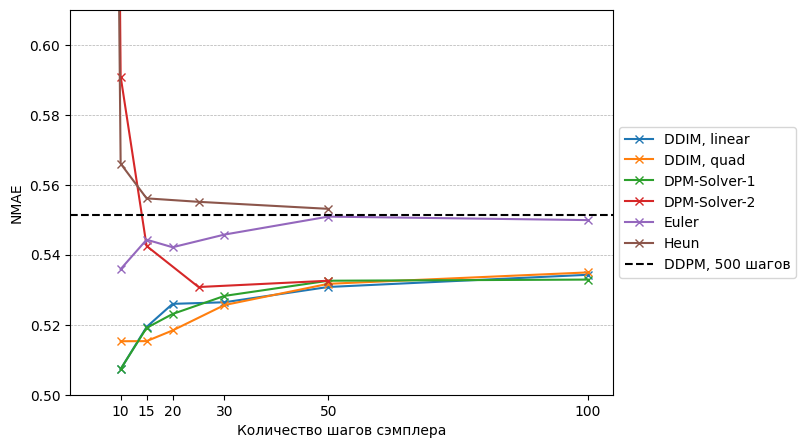

In [117]:
solver_steps = [10, 15, 20, 30, 50, 100]
solver_steps_2ord = [step // 2 for step in solver_steps]
plt.figure(figsize=(7, 5))

for sampler in metrics:
    runs = metrics[sampler]
    nmae = [run['96_test_ND'] for run in runs]
    if sampler in ['Heun', 'DPM-Solver-2']:
        plt.plot(solver_steps_2ord, nmae, marker='x', linestyle='-', label=sampler)
    else:
        plt.plot(solver_steps, nmae, marker='x', linestyle='-', label=sampler)
    
plt.axhline(y=0.5514733195304871 , linestyle='--', label='DDPM, 500 шагов', c='black')

plt.xlabel('Количество шагов сэмплера')
plt.xticks(nfe)
plt.ylabel('NMAE')
plt.ylim(0.5, 0.61)
plt.grid(True, which="both", ls="--", linewidth=0.5, axis='y')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5));

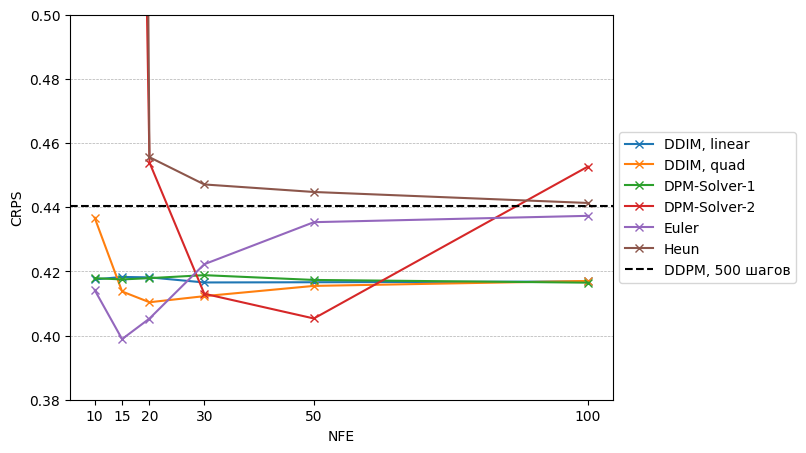

In [121]:
import matplotlib.pyplot as plt
import numpy as np

nfe = [10, 15, 20, 30, 50, 100]
plt.figure(figsize=(7, 5))

for sampler in metrics:
    runs = metrics[sampler]
    crps = [run['96_test_CRPS'] for run in runs]
    plt.plot(nfe, crps, marker='x', linestyle='-', label=sampler)

plt.axhline(y=0.44042032957077026, linestyle='--', label='DDPM, 500 шагов', c='black')

plt.xlabel('NFE')
plt.xticks(nfe)
plt.ylabel('CRPS')
plt.ylim(0.38, 0.5)
# plt.yticks(np.arange(0.05, 0.251, 0.05))
plt.grid(True, which="both", ls="--", linewidth=0.5, axis='y')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5));

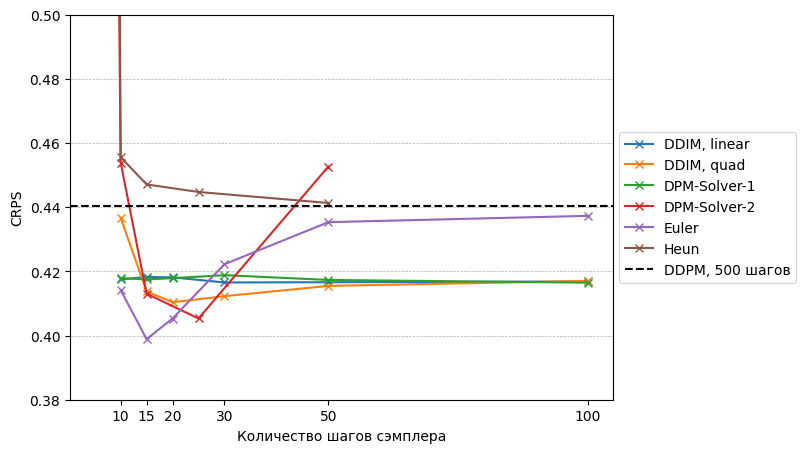

In [122]:
import matplotlib.pyplot as plt
import numpy as np

nfe = [10, 15, 20, 30, 50, 100]
plt.figure(figsize=(7, 5))

for sampler in metrics:
    runs = metrics[sampler]
    crps = [run['96_test_CRPS'] for run in runs]
    if sampler in ['Heun', 'DPM-Solver-2']:
        plt.plot(solver_steps_2ord, crps, marker='x', linestyle='-', label=sampler)
    else:
        plt.plot(solver_steps, crps, marker='x', linestyle='-', label=sampler)

plt.axhline(y=0.44042032957077026, linestyle='--', label='DDPM, 500 шагов', c='black')

plt.xlabel('Количество шагов сэмплера')
plt.xticks(nfe)
plt.ylabel('CRPS')
plt.ylim(0.38, 0.5)
plt.grid(True, which="both", ls="--", linewidth=0.5, axis='y')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5));